In [604]:
from pgmpy.models import BayesianNetwork
from pgmpy.estimators import MaximumLikelihoodEstimator, BayesianEstimator, ParameterEstimator
from pgmpy.inference import VariableElimination
from pgmpy.factors.discrete import TabularCPD
from pgmpy.inference.CausalInference import CausalInference

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt



import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import daft
from daft import PGM
import time
import sys
import psutil
import os

In [605]:
covid = pd.read_excel("symptomatic_dataset.xlsx")
covid.head(2)

,ID,Completion_Date,Age,Gender,Banana,Caramel,Mint,Orange,Pineapple,Vanilla,1__Rinitis_or_Sinusitis,2__Respiratory_allergies,3__Hypertension,4__Diabetes,5__Parkinson,6__Alzheimer,7__Cold,8__Cough,9__Fever,10__Muscular_pain,11__Breathing_difficulty,12__Other_COMMENTS,13__Days_with_symptoms,Smoker,COVI19_PCR
0,1,2020-06-01,30,Female,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,anosmia,3,0,1
1,2,2020-06-01,31,Female,0,1,1,1,0,1,0,0,0,0,0,0,0,1,0,1,0,NaN,2,0,1


In [606]:

#Create a mask based on the condition
mask = (covid['Banana'] + covid['Caramel'] + covid['Mint'] + covid['Orange'] + covid['Pineapple'] + covid['Vanilla']) > 3

#Assign the values 1 or 0 to the new column based on the mask
covid['Anosmia'] = mask.astype(int)



In [607]:
#drop columns that are not predictors
dropthis = ["ID", #"12__Other_COMMENTS",
            "Banana", "Caramel", "Mint", "Orange", "Pineapple", "Vanilla"]
covid_symp = covid.drop(dropthis, axis=1)

In [608]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.expand_frame_repr', False)

In [609]:
# Create a DataFrame with binary encoding for the presence of each value
binary_comments = covid_symp['12__Other_COMMENTS'].str.get_dummies(sep=',')

In [610]:
#deleting spaces before column names
binary_comments.columns = [col.lstrip() for col in binary_comments.columns]
#checking stats
#binary_comments.sum().sort_values(ascending=False)

In [611]:
binary_comments = binary_comments.sort_index(axis=1)
binary_comments.head(2)

,ageusia,ageusia,allergy,angina,anosmia,anosmia,asma,augesia,bronchitis,chest pain,chest pain,chest pain,clogged nose,cough,depression,depression,dermomiositis,diarrhea,diarrhea,diarrhea anosmia,dizziness,dizziness,dysphagia,dyspnea,dyspnea,ear pain,fatigue,fatigue,fever,fever,fibromyalgia,headache,headache,headache Y diarrhea,headache.,headaches,hiposmia,hipotiridismo,hypothyroidism,indigestion,indigestion,lack of appetite,lack of appetite,lupus,nausea,nausea,nauseas,neumonia,odynophagia,odynophagia,otalgia,pharyngeal itching,rhinorrea,rhinorrhea,shivers,sore throat,sore throat,stomach pain,stomach pain,sweating,vomiting,vomiting nausea
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [612]:
headache_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'headache' in col_name]
binary_comments['Headache'] = binary_comments.iloc[:, headache_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[headache_cols], axis=1, inplace=True)

In [613]:
headache_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'headache' in col_name]
binary_comments['Headache'].sum()

137

In [614]:
anosmia_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'anosmia' in col_name]
binary_comments['Anosmia'] = binary_comments.iloc[:, anosmia_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[anosmia_cols], axis=1, inplace=True)

In [615]:
binary_comments['Anosmia'].sum()

58

In [616]:
ageusia_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'ageusia' in col_name]
binary_comments['Ageusia'] = binary_comments.iloc[:, ageusia_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[ageusia_cols], axis=1, inplace=True)

#augesia                  3
augesia_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'augesia' in col_name]
binary_comments['Augesia'] = binary_comments.iloc[:, augesia_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[augesia_cols], axis=1, inplace=True)

binary_comments['Ageusia'] = (binary_comments['Ageusia'] + binary_comments['Augesia']).clip(upper=1)

# And then, drop the misspelled column:
binary_comments.drop('Augesia', axis=1, inplace=True)

In [617]:
odynophagia_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'odynophagia' in col_name]
binary_comments['Odynophagia'] = binary_comments.iloc[:, odynophagia_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[odynophagia_cols], axis=1, inplace=True)

In [618]:
#diarrhea                13
diarrhea_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'diarrhea' in col_name]
binary_comments['Diarrhea'] = binary_comments.iloc[:, diarrhea_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[diarrhea_cols], axis=1, inplace=True)

In [619]:
#asma
asthma_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'asma' in col_name]
binary_comments['Asthma'] = binary_comments.iloc[:, asthma_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[asthma_cols], axis=1, inplace=True)

In [620]:
#hypothyroidism
hypothyroidism_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'hypothyroidism' in col_name]
binary_comments['Hypothyroidism'] = binary_comments.iloc[:, hypothyroidism_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[hypothyroidism_cols], axis=1, inplace=True)

In [621]:
#diarrhea
diarrhea_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'diarrhea' in col_name]
binary_comments['Diarrhea'] = binary_comments.iloc[:, diarrhea_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[diarrhea_cols], axis=1, inplace=True)

In [622]:
#sore throat
sore_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'sore throat' in col_name]
binary_comments['SoreThroat'] = binary_comments.iloc[:, sore_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[sore_cols], axis=1, inplace=True)

In [623]:
#fatigue                  4
fatigue_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'fatigue' in col_name]
binary_comments['Fatigue'] = binary_comments.iloc[:, fatigue_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[fatigue_cols], axis=1, inplace=True)

In [624]:
#stomach pain             3
stomach_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'stomach pain' in col_name]
binary_comments['Stomach'] = binary_comments.iloc[:, stomach_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[stomach_cols], axis=1, inplace=True)

In [625]:
#clogged nose             3
clogged_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'clogged nose' in col_name]
binary_comments['CloggedNose'] = binary_comments.iloc[:, clogged_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[clogged_cols], axis=1, inplace=True)

In [626]:
#fever                    2
fever_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'fever' in col_name]
binary_comments['Fever'] = binary_comments.iloc[:, fever_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[fever_cols], axis=1, inplace=True)

In [627]:
#chest pain                    2
chest_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'chest pain' in col_name]
binary_comments['ChestPain'] = binary_comments.iloc[:, chest_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[chest_cols], axis=1, inplace=True)

In [628]:
#dizziness                   2
dizziness_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'dizziness' in col_name]
binary_comments['Dizziness'] = binary_comments.iloc[:, dizziness_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[dizziness_cols], axis=1, inplace=True)

In [629]:
1
#shivers                   2
shivers_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'shivers' in col_name]
binary_comments['Shivers'] = binary_comments.iloc[:, shivers_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[shivers_cols], axis=1, inplace=True)

In [630]:
#lack of appetite                    2
noAppetite_cols = [i for i, col_name in enumerate(binary_comments.columns) if 'lack of appetite' in col_name]
binary_comments['LossAppetite'] = binary_comments.iloc[:, noAppetite_cols].any(axis=1).astype(int)

# Delete the columns compared
binary_comments.drop(binary_comments.columns[noAppetite_cols], axis=1, inplace=True)

In [631]:
sums = binary_comments.sum()
#Filter columns where the sum is greater than 1
columns_to_keep = sums[sums > 1].index
#Keep only those columns
binary_comments = binary_comments[columns_to_keep]
binary_comments.head()

,Headache,Anosmia,Ageusia,Odynophagia,Asthma,Hypothyroidism,SoreThroat,Fatigue,Stomach,CloggedNose,Fever,ChestPain,Dizziness,Shivers,LossAppetite
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [632]:
sums = binary_comments.sum()
#print(sums)
sorted_cols = sums.sort_values(ascending=False)
sorted_cols

Headache          137
Anosmia            58
Ageusia            29
Odynophagia        29
SoreThroat         12
Asthma             11
Hypothyroidism      8
ChestPain           8
Fatigue             7
Stomach             6
CloggedNose         3
Fever               3
Dizziness           3
LossAppetite        3
Shivers             2
dtype: int64

In [633]:
#Age ranges
age_groups = {
    range(0, 13): 0, #'0-12',
    range(13, 25): 1, #'13-24',
    range(25, 45): 2, #'25-44',
    range(45, 66): 3, #'45-65',
    range(66, 120): 4, #'66+'
}

gender = {'Female': 0, 'Masculine': 1} 

# encode the age and gender
covid_symp['Age_group'] = covid_symp['Age'].map(lambda Age: next((a for b, a in age_groups.items() if Age in b), None))
covid_symp['Gender'] = covid_symp['Gender'].map(gender)

In [634]:
covid_symp = covid_symp.rename(columns={'1__Rinitis_or_Sinusitis': 'RinitisSinusitis',
                        '2__Respiratory_allergies': 'RespiratoryAllegies',
                        '3__Hypertension': 'Hypertension',
                        '4__Diabetes': 'Diabetes',
                        '5__Parkinson': 'Parkinson',
                        '6__Alzheimer': 'Alzheimer',
                        '7__Cold': 'Cold',
                        '8__Cough': 'Cough',
                        '9__Fever': 'Fever',
                        '10__Muscular_pain': 'MuscularPain',
                        '11__Breathing_difficulty': 'BreatheDiff',
                        '13__Days_with_symptoms': 'SymptomDays'                       
                       })

In [635]:
covid_symp.describe()

,Age,Gender,RinitisSinusitis,RespiratoryAllegies,Hypertension,Diabetes,Parkinson,Alzheimer,Cold,Cough,Fever,MuscularPain,BreatheDiff,SymptomDays,Smoker,COVI19_PCR,Anosmia,Age_group
count,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.0,926.0,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000
mean,37.293737,0.519438,0.134989,0.139309,0.095032,0.021598,0.0,0.0,0.338013,0.345572,0.168467,0.371490,0.139309,3.098272,0.281857,0.333693,0.830454,2.160907
std,13.073849,0.499892,0.341897,0.346456,0.293418,0.145446,0.0,0.0,0.473289,0.475812,0.374482,0.483464,0.346456,1.421099,0.450147,0.471786,0.375437,0.701369
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,2.000000
50%,35.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,1.000000,2.000000
75%,46.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,0.000000,1.000000,0.000000,5.000000,1.000000,1.000000,1.000000,3.000000
max,84.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,1.000000,4.000000


#drop Age: age group, Parkinson and Alzheimer has no variance
dropthis = ["Age","Parkinson", "Alzheimer","12__Other_COMMENTS"]
covid= covid.drop(dropthis, axis=1)

In [636]:
#drop Age: age group, Parkinson and Alzheimer has no variance
dropthis = ["Age", "Parkinson", "Alzheimer","12__Other_COMMENTS"]
covid_symp = covid_symp.drop(dropthis, axis=1)

In [637]:
pd.Categorical(covid_symp['Gender']).describe()

,counts,freqs
categories,,
0,445,0.480562
1,481,0.519438


In [638]:
#combining similar columns
covid = pd.merge(covid_symp, binary_comments, how='outer', left_index=True, right_index=True, suffixes=('_initial', '_comment'))

pd.Categorical(covid['Gender']).describe()
covid['Gender'] = covid['Gender'].map({'Masculine': 0, 'Female': 1})

In [639]:
for col in covid_symp.columns:
    if col in binary_comments.columns:
        covid[col] = covid[[col + '_initial', col + '_comment']].max(axis=1)

        #drop similar columns
        covid.drop([col + '_initial', col + '_comment'], axis=1, inplace=True)

In [640]:
sums = covid.sum()
columns_to_keep = sums[sums > 1].index
covid = covid[columns_to_keep]

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4130062116.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  sums = covid.sum()


sums = covid.sum()
columns_to_keep = sums[sums > 1].index
covid = covid[columns_to_keep]

In [641]:
covid_symp.columns

Index(['Completion_Date', 'Gender', 'RinitisSinusitis', 'RespiratoryAllegies',
       'Hypertension', 'Diabetes', 'Cold', 'Cough', 'Fever', 'MuscularPain',
       'BreatheDiff', 'SymptomDays', 'Smoker', 'COVI19_PCR', 'Anosmia',
       'Age_group'],
      dtype='object')

In [642]:
covid_symp['Completion_Date'] = pd.to_datetime(covid_symp['Completion_Date'], format='%d/%m/%Y')

# Function to determine the season based on the month
def get_season(date):
    if date.month in [5, 6, 7, 8, 9]:
        return 1
    else:
        return 0

covid['Season'] = covid_symp['Completion_Date'].apply(get_season)     

In [643]:
covid.head()

,Gender,RinitisSinusitis,RespiratoryAllegies,Hypertension,Diabetes,Cold,Cough,MuscularPain,BreatheDiff,SymptomDays,Smoker,COVI19_PCR,Age_group,Headache,Ageusia,Odynophagia,Asthma,Hypothyroidism,SoreThroat,Fatigue,Stomach,CloggedNose,ChestPain,Dizziness,Shivers,LossAppetite,Fever,Anosmia,Season
0,0,0,0,0,0,1,0,0,0,3,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,0,0,0,0,0,0,1,1,0,2,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
2,0,1,0,0,0,1,0,1,0,3,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,1,1,1,0,2,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,1,0,0,0,0,1,1,0,0,2,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


In [644]:
covid.describe()

,Gender,RinitisSinusitis,RespiratoryAllegies,Hypertension,Diabetes,Cold,Cough,MuscularPain,BreatheDiff,SymptomDays,Smoker,COVI19_PCR,Age_group,Headache,Ageusia,Odynophagia,Asthma,Hypothyroidism,SoreThroat,Fatigue,Stomach,CloggedNose,ChestPain,Dizziness,Shivers,LossAppetite,Fever,Anosmia,Season
count,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000,926.000000
mean,0.519438,0.134989,0.139309,0.095032,0.021598,0.338013,0.345572,0.371490,0.139309,3.098272,0.281857,0.333693,2.160907,0.147948,0.031317,0.031317,0.011879,0.008639,0.012959,0.007559,0.006479,0.003240,0.008639,0.003240,0.002160,0.003240,0.171706,0.862851,0.998920
std,0.499892,0.341897,0.346456,0.293418,0.145446,0.473289,0.475812,0.483464,0.346456,1.421099,0.450147,0.471786,0.701369,0.355240,0.174268,0.174268,0.108400,0.092596,0.113159,0.086662,0.080277,0.056857,0.092596,0.056857,0.046449,0.056857,0.377329,0.344191,0.032862
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,5.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [645]:
less_sym = ['Season','Gender', 'RinitisSinusitis', 'RespiratoryAllegies', 'Hypertension', 'Diabetes', 'Cold', 'Cough', 'BreatheDiff', 'SymptomDays', 'Smoker', 'COVI19_PCR', 'Age_group', 'Ageusia', 'Odynophagia', 'Asthma', 'Hypothyroidism', 'SoreThroat', 'ChestPain', 'Fever', 'Anosmia']

In [646]:
covid1=covid[less_sym].copy()

In [647]:
under = covid1[[ 'RespiratoryAllegies', 'Hypertension', 'Diabetes', 'RinitisSinusitis', 'RespiratoryAllegies', 'Asthma', 'Hypothyroidism']].any(axis=1).astype(int)
covid1['under_cond'] = under

In [648]:
covid1.head()

,Season,Gender,RinitisSinusitis,RespiratoryAllegies,Hypertension,Diabetes,Cold,Cough,BreatheDiff,SymptomDays,Smoker,COVI19_PCR,Age_group,Ageusia,Odynophagia,Asthma,Hypothyroidism,SoreThroat,ChestPain,Fever,Anosmia,under_cond
0,1,0,0,0,0,0,1,0,0,3,0,1,2,0,0,0,0,0,0,0,1,0
1,1,0,0,0,0,0,0,1,0,2,0,1,2,0,0,0,0,0,0,0,1,0
2,1,0,1,0,0,0,1,0,0,3,0,1,2,0,0,0,0,0,0,0,1,1
3,1,0,0,0,0,0,1,1,0,2,0,1,2,0,0,0,0,0,0,1,0,0
4,1,1,0,0,0,0,1,1,0,2,0,1,2,0,0,0,0,0,0,1,0,0


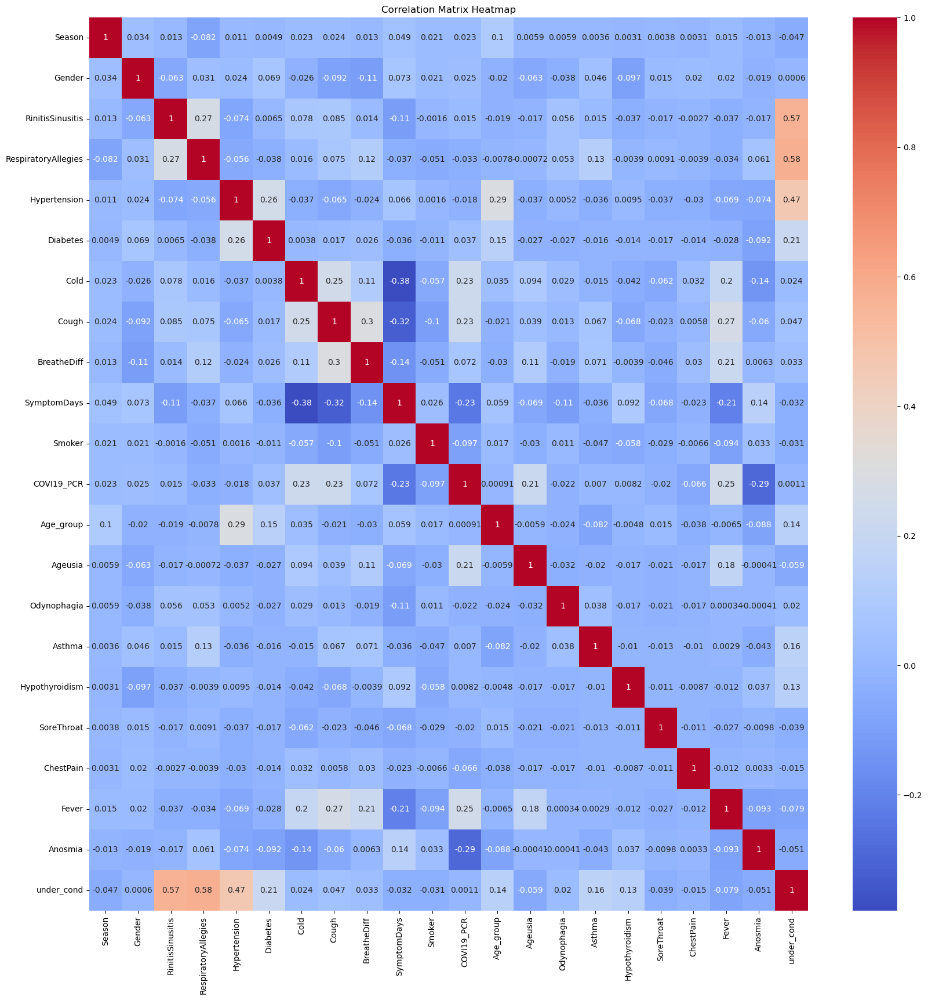

In [649]:
import seaborn as sns
import numpy as np
correlation_matrix = np.corrcoef(covid1, rowvar=False)

# Create a heatmap using seaborn
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm',xticklabels=covid1.columns,
            yticklabels=covid1.columns)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [650]:
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid1.drop(columns=[target]).columns.tolist()
features



['Season',
 'Gender',
 'RinitisSinusitis',
 'RespiratoryAllegies',
 'Hypertension',
 'Diabetes',
 'Cold',
 'Cough',
 'BreatheDiff',
 'SymptomDays',
 'Smoker',
 'Age_group',
 'Ageusia',
 'Odynophagia',
 'Asthma',
 'Hypothyroidism',
 'SoreThroat',
 'ChestPain',
 'Fever',
 'Anosmia',
 'under_cond']

1/1 [==============================] - 0s 13ms/step


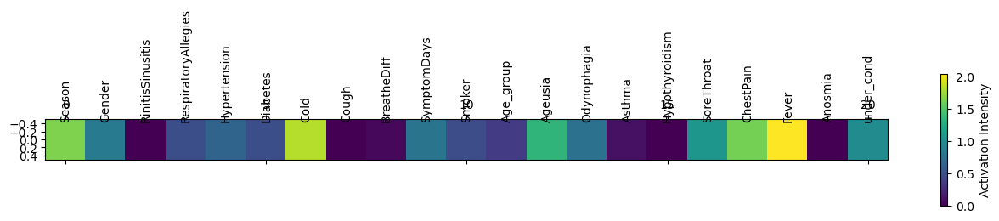

1/1 [==============================] - 0s 12ms/step


<Figure size 800x600 with 0 Axes>

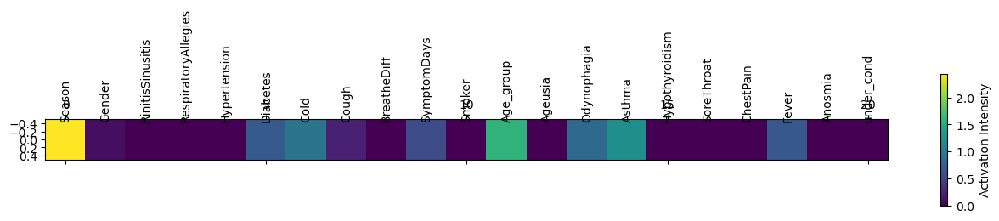

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

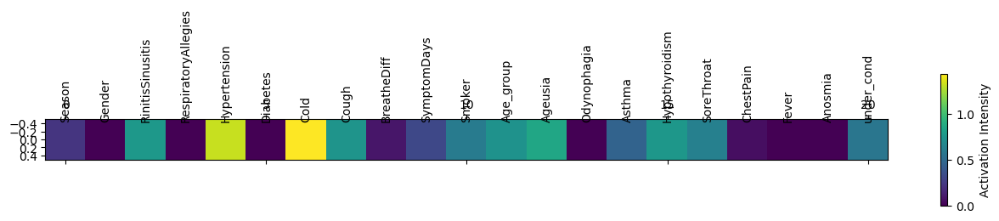

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

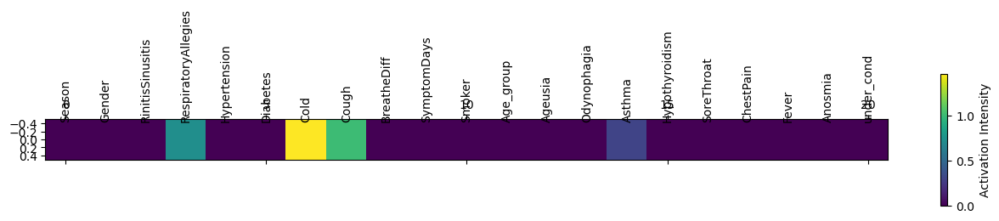

1/1 [==============================] - 0s 14ms/step


<Figure size 800x600 with 0 Axes>

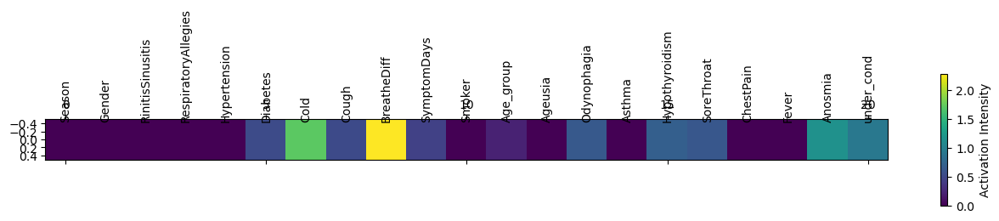

6/6 [==============================] - 0s 407us/step


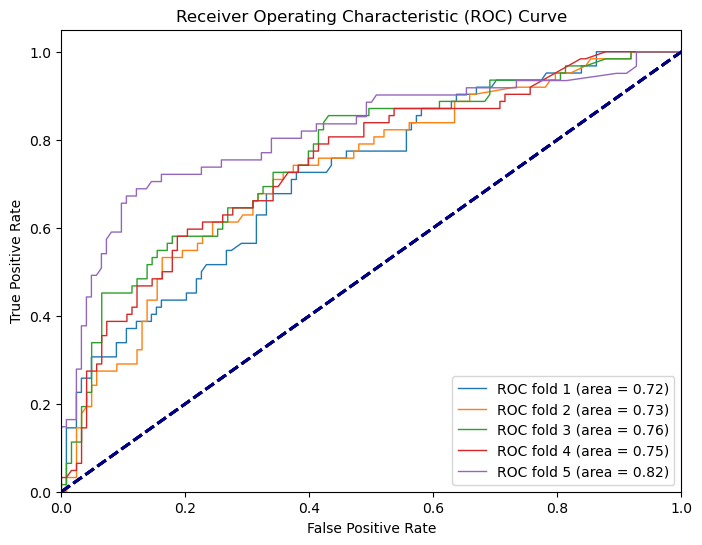

Average Cross-Validation Accuracy: 0.71


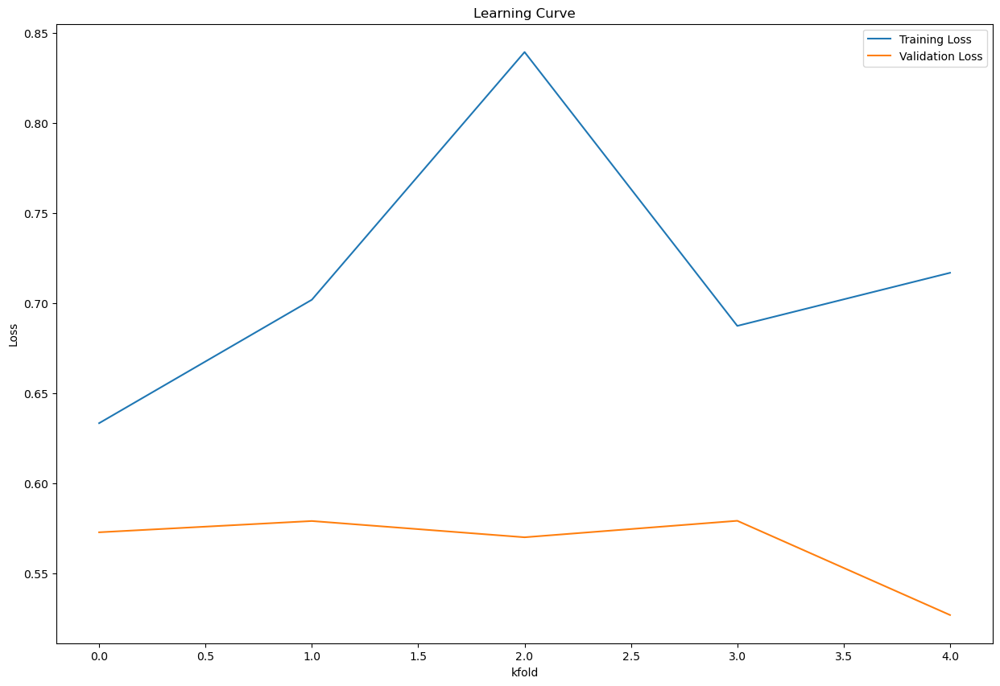

Elapsed time: 3.2879579067230225 seconds


In [651]:
start_time = time.time()


from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid1.drop(columns=[target]).columns.tolist()
features

#defining features and target

roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = covid1[features]
y = covid1[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(21, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(9, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    tpr_list.append(tpr)
    fpr_list.append(fpr)
    # Plot the average ROC curve
    plt.figure(figsize=(8, 6))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')
    
    
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')

plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend()
plt.show()

end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")






1/1 [==============================] - 0s 13ms/step


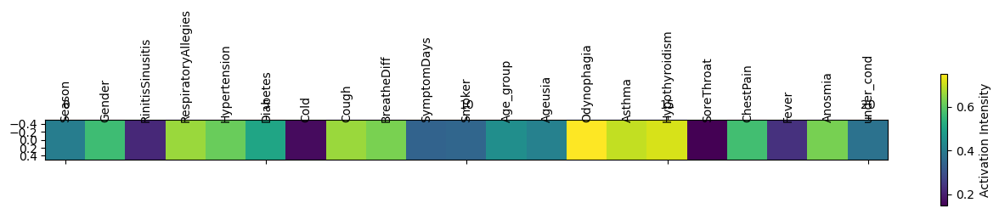

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

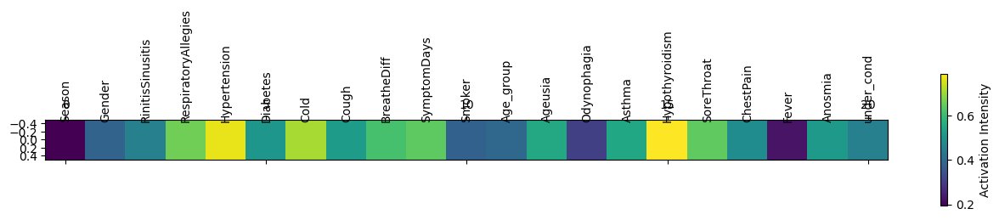

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

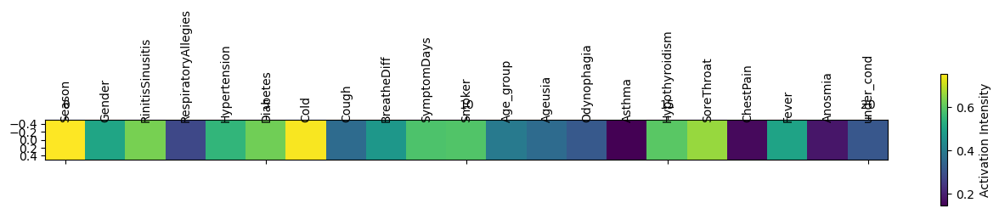

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

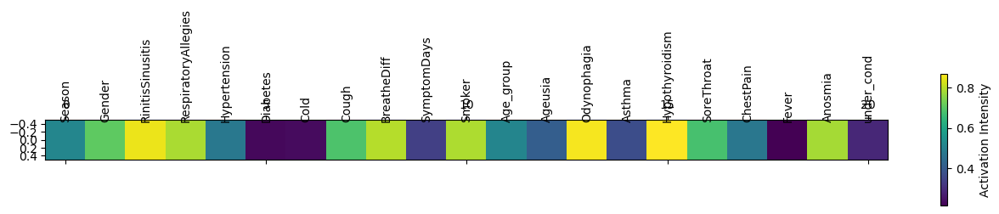

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

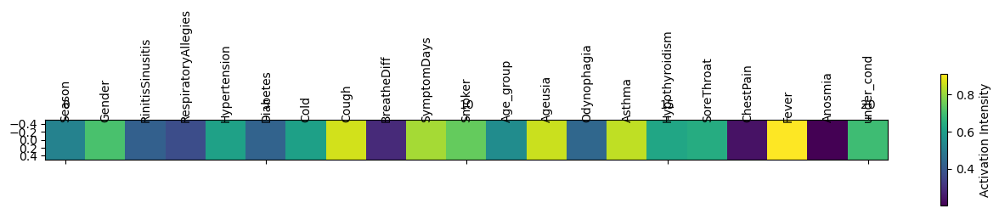

6/6 [==============================] - 0s 431us/step


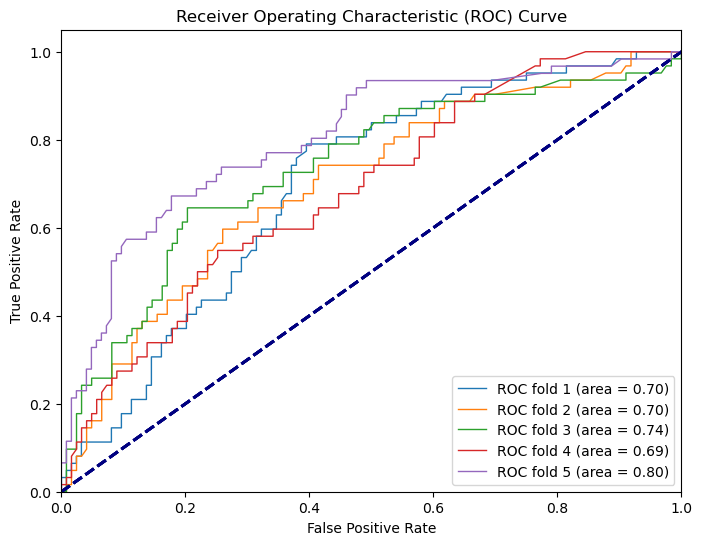

average accuracy: 0.6663062930107116


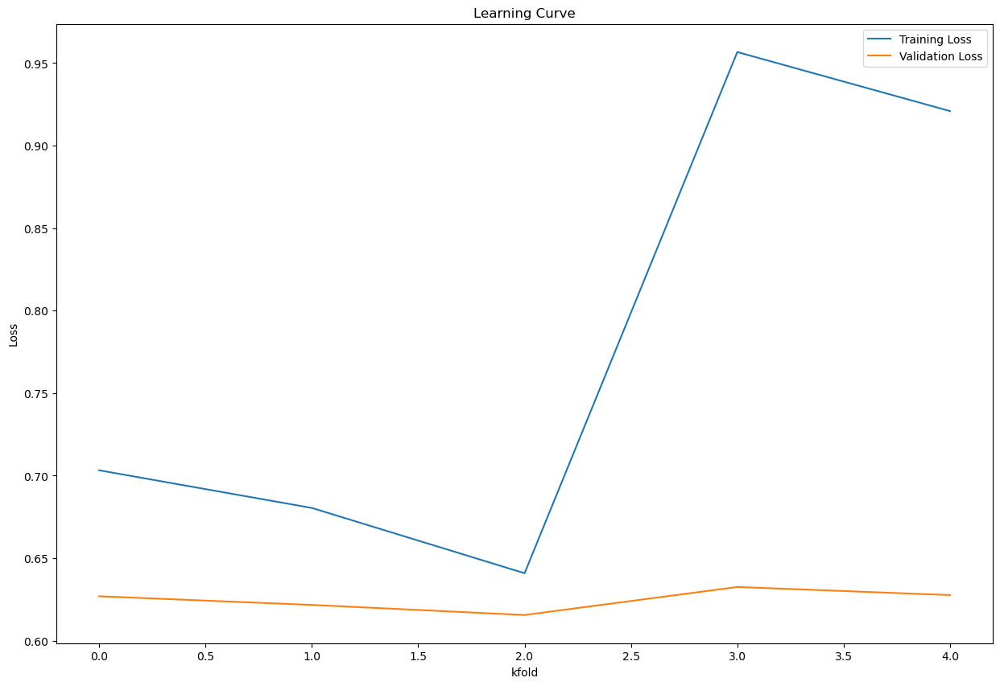

   Accuracy
0  0.666667
1  0.664865
2  0.664865
3  0.664865
4  0.670270
Elapsed time: 3.2759029865264893 seconds


In [652]:
start_time = time.time()

target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid1.drop(columns=[target]).columns.tolist()
features


from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

#defining features and target

roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = covid1[features]
y = covid1[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(21, activation='sigmoid', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(9, activation='sigmoid'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    tpr_list.append(tpr)
    fpr_list.append(fpr)
    # Plot the average ROC curve
    plt.figure(figsize=(8, 6))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')
    
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
print("average accuracy:", average_accuracy)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend()
plt.show()




accuracies = pd.DataFrame({'Accuracy': accuracies})

print(accuracies)
end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")





In [653]:
cov_new = covid1[['Cold', 'Cough', 'BreatheDiff', 'SymptomDays', 'Smoker', 'COVI19_PCR', 'Ageusia', 'Odynophagia', 'ChestPain', 'Fever','Anosmia']]

# Using the reduced dataset


1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

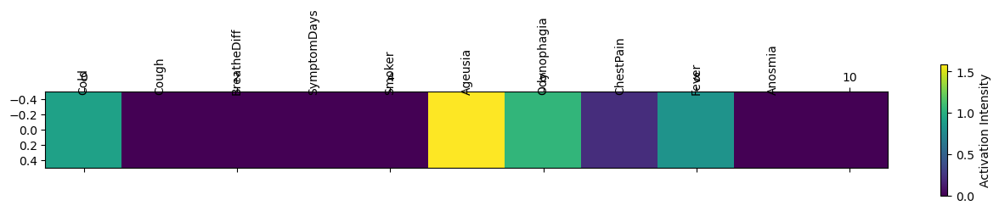

1/1 [==============================] - 0s 13ms/step


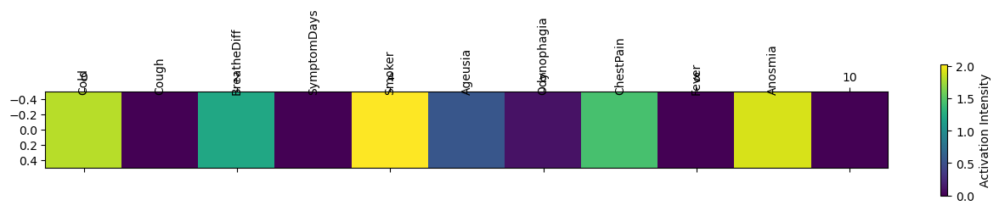

1/1 [==============================] - 0s 12ms/step


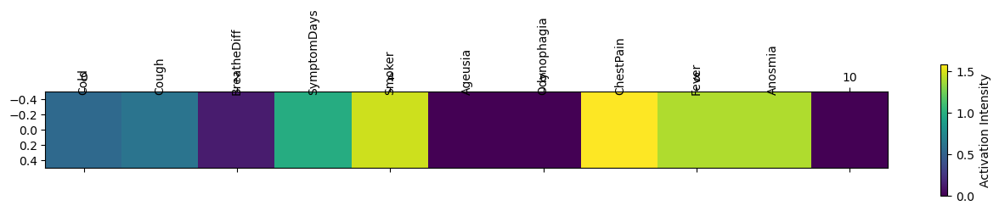

1/1 [==============================] - 1s 513ms/step


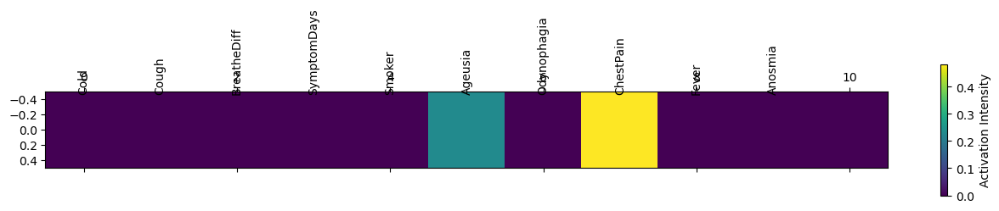

1/1 [==============================] - 0s 13ms/step


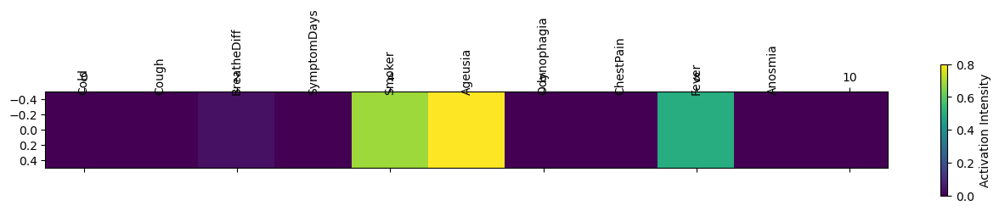

6/6 [==============================] - 0s 392us/step


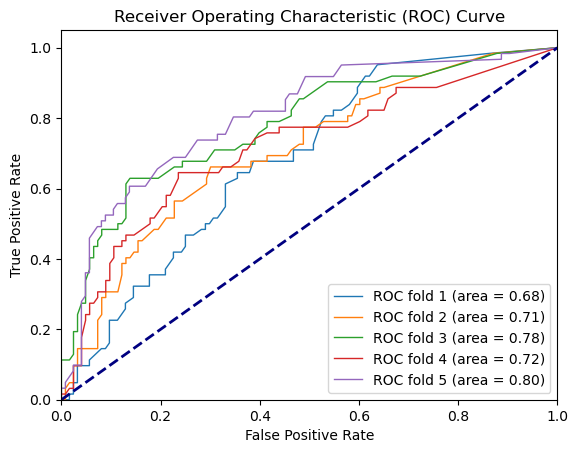

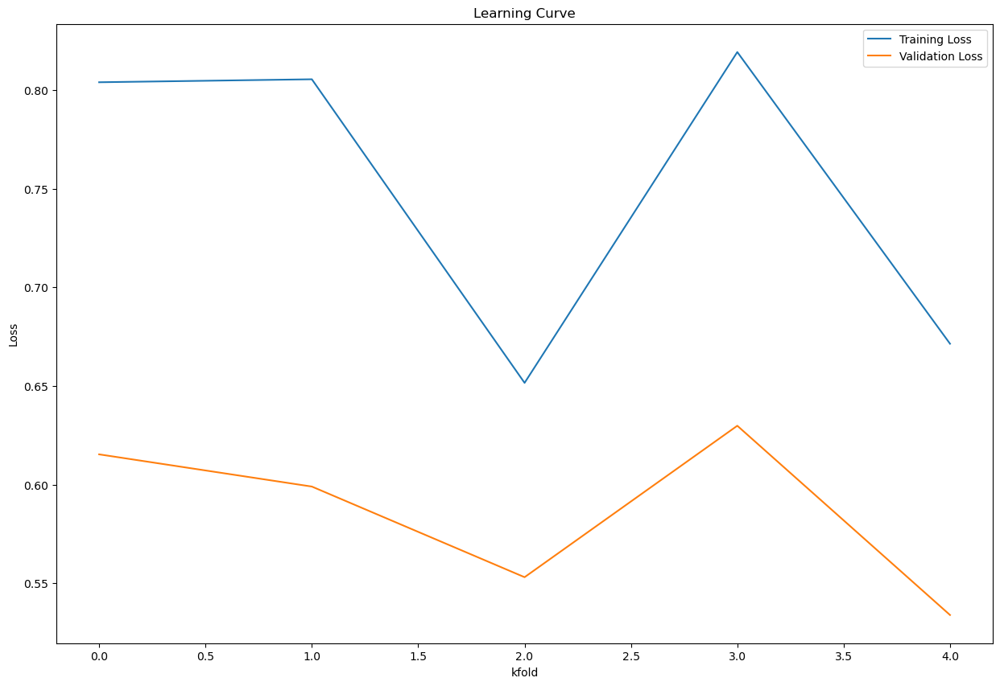

Elapsed time: 6.855998277664185 seconds
   Accuracy
0  0.666667
1  0.654054
2  0.735135
3  0.659459
4  0.718919


In [654]:

from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold

#defining features and target
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = cov_new.drop(columns=[target]).columns.tolist()
features

plt.figure(figsize=(8, 6))
roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = cov_new[features]
y = cov_new[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx],X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(11, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    tpr_list.append(tpr)
    fpr_list.append(fpr)
    # Plot the average ROC curve
    
    #plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
#print("Average ROC AUC:", average_roc_auc)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')


plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend()
plt.show()


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")


accuracies = pd.DataFrame({'Accuracy': accuracies})

print(accuracies)

1/1 [==============================] - 0s 12ms/step


<Figure size 800x600 with 0 Axes>

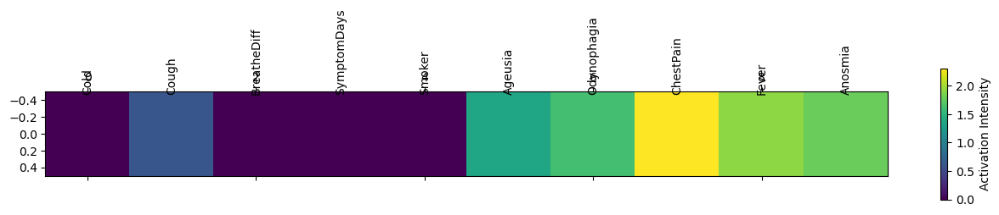

1/1 [==============================] - 0s 14ms/step


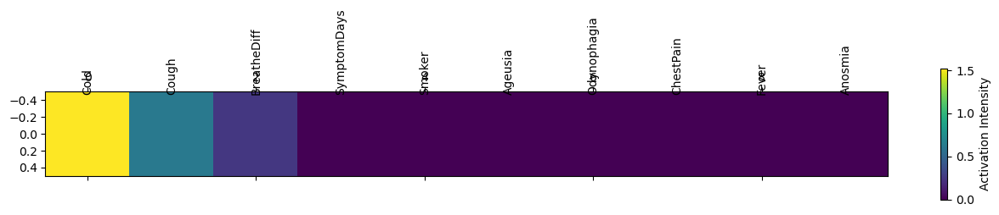

1/1 [==============================] - 0s 13ms/step


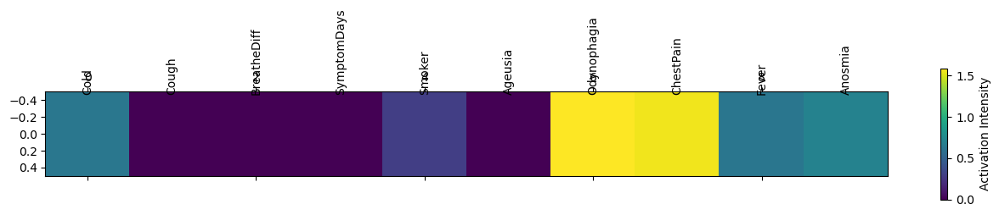

1/1 [==============================] - 0s 14ms/step


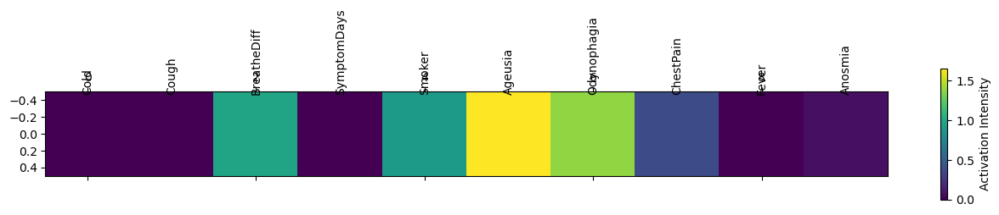

1/1 [==============================] - 0s 12ms/step


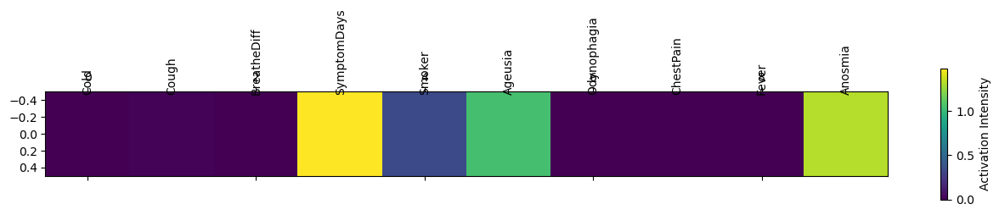

6/6 [==============================] - 0s 423us/step


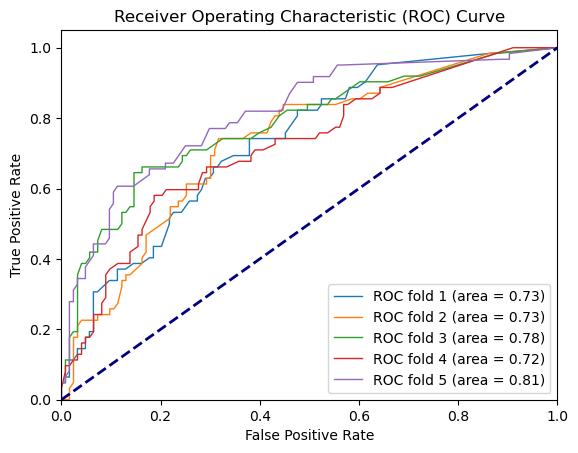

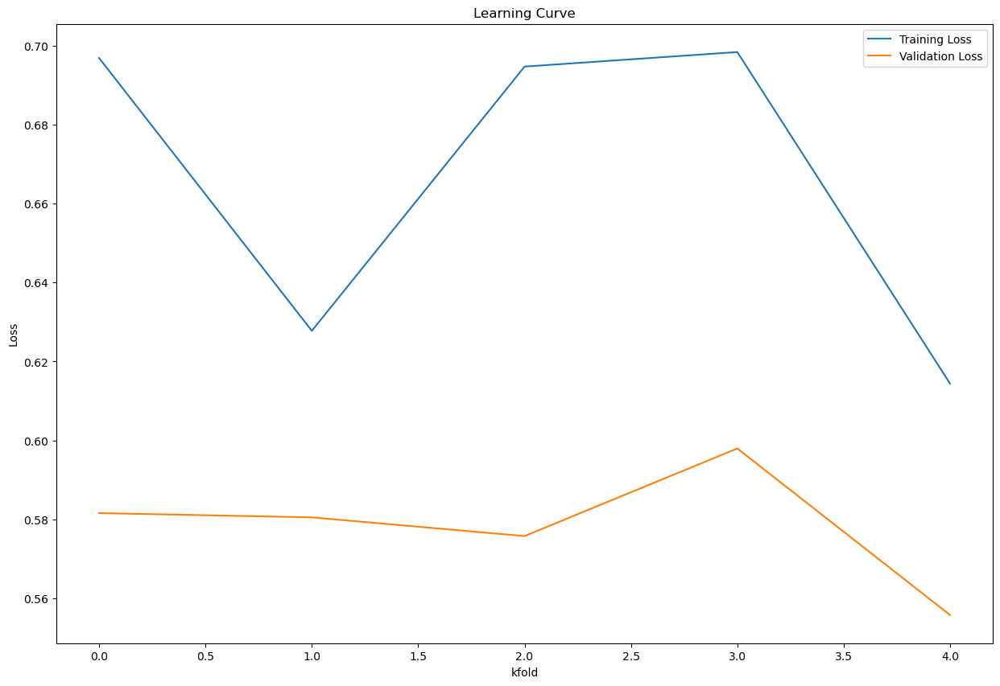

Elapsed time: 10.146229982376099 seconds
   Accuracy
0  0.672043
1  0.708108
2  0.697297
3  0.691892
4  0.691892


In [655]:
#trying to smooth out the learning curve
start_time-time.time()


from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#defining features and target
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = cov_new.drop(columns=[target]).columns.tolist()
features

plt.figure(figsize=(8, 6))
roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = cov_new[features]
y = cov_new[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx],X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(10, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),  # Early stopping
    ReduceLROnPlateau(factor=0.2, patience=2, verbose=1)  # Reduce learning rate on plateau
]

# ... (inside your model training loop)
    history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val), callbacks=callbacks, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    tpr_list.append(tpr)
    fpr_list.append(fpr)
    # Plot the average ROC curve
    
    #plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
#print("Average ROC AUC:", average_roc_auc)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')


plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend()
plt.show()


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")

accuracies = pd.DataFrame({'Accuracy': accuracies})

print(accuracies)


1/1 [==============================] - 0s 14ms/step


<Figure size 1000x800 with 0 Axes>

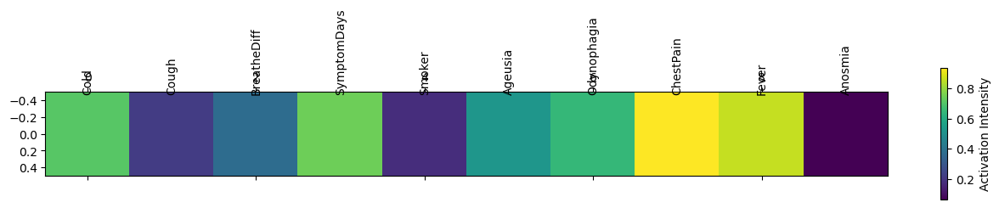

1/1 [==============================] - 0s 12ms/step


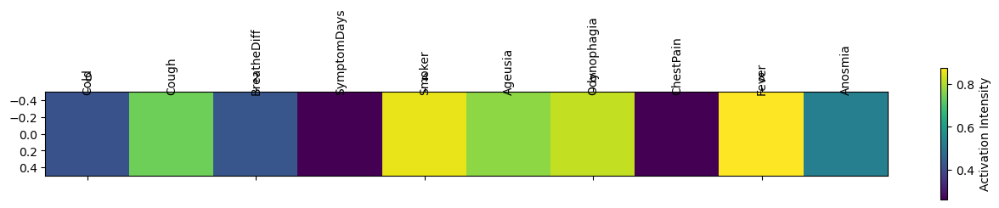

1/1 [==============================] - 0s 12ms/step


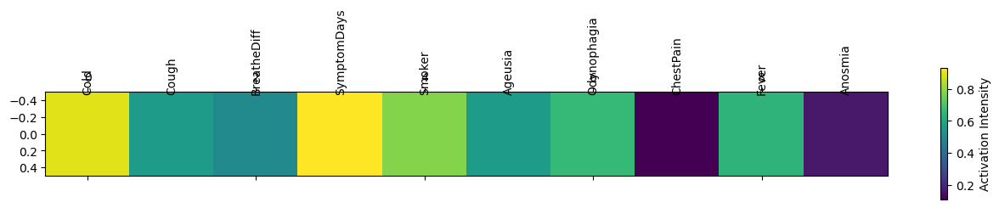

1/1 [==============================] - 0s 13ms/step


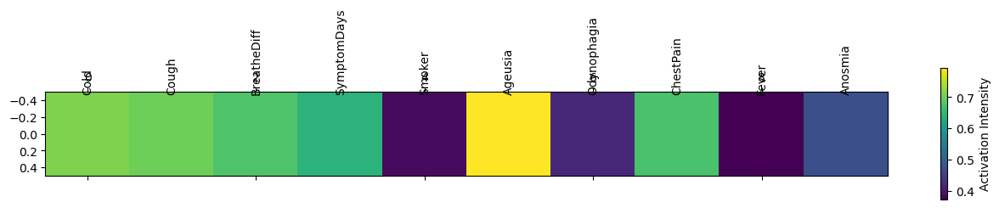

1/1 [==============================] - 0s 13ms/step


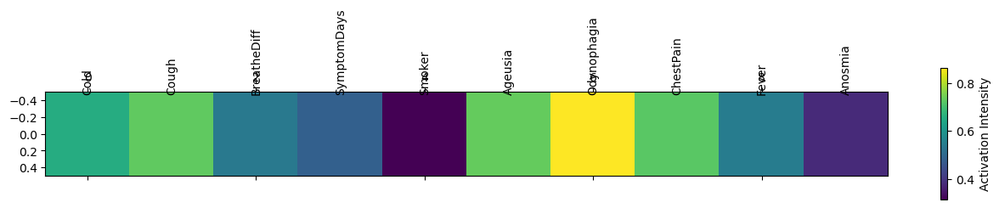

6/6 [==============================] - 0s 362us/step


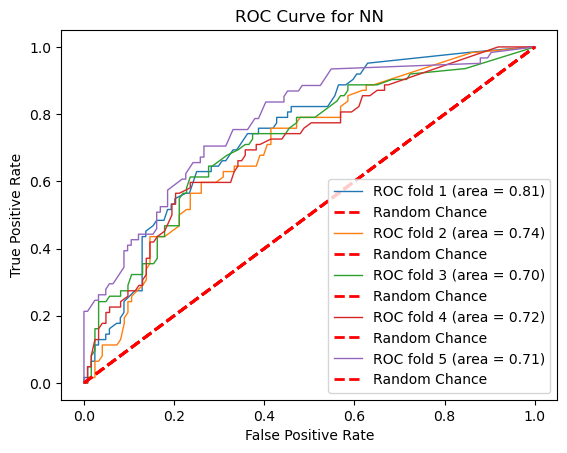

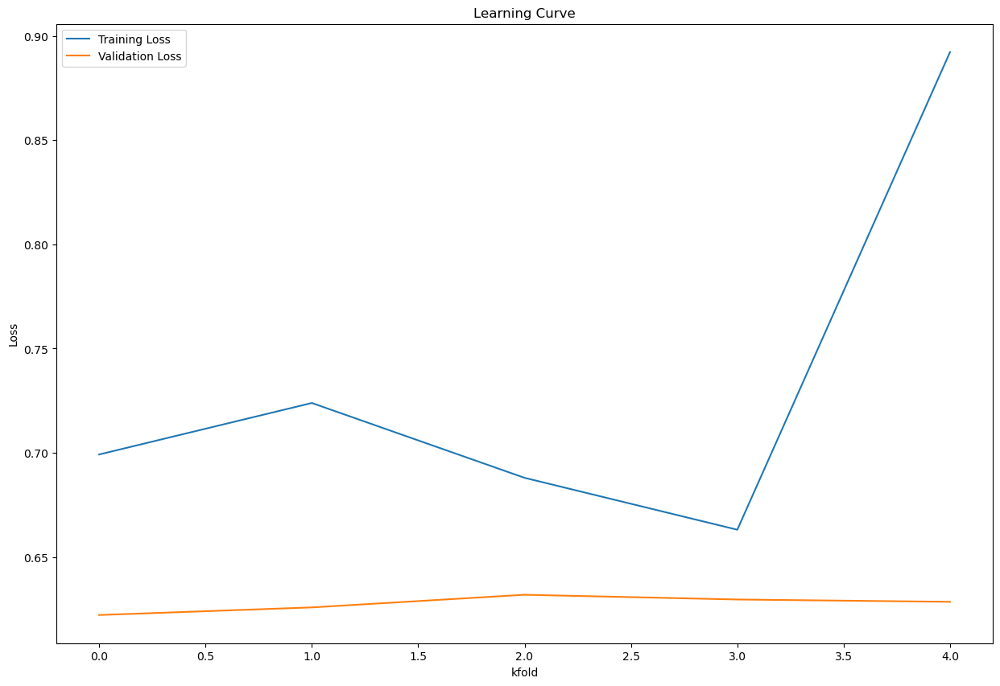

0.6663062930107116
Elapsed time: 2.8092360496520996 seconds
   Accuracy
0  0.666667
1  0.664865
2  0.664865
3  0.664865
4  0.670270


In [656]:
start_time=time.time()



from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold


plt.figure(figsize=(10, 8))
#defining features and target
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = cov_new.drop(columns=[target]).columns.tolist()
features


roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = cov_new[features]
y = cov_new[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]


for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx],X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(10, activation='sigmoid', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(10, activation='sigmoid'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    
    roc_auc_scores.append(roc_auc)
    
    #tpr_list.append(tpr)
    #fpr_list.append(fpr)
    # Plot the average ROC curve
   # Compute ROC curve
    roc_auc = auc(fpr, tpr)
    #plt.plot(fpr, tpr, lw=1, label=f'ROC fold (area = {roc_auc:.2f})')
    fpr_list.append(fpr)
    tpr_list.append(tpr)
    
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random Chance')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for NN')
plt.legend(loc='best')
plt.show()

    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
#print("Average ROC AUC:", average_roc_auc)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')


plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()


print(average_accuracy)



end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")


accuracies = pd.DataFrame({'Accuracy': accuracies})

print(accuracies)

SVM

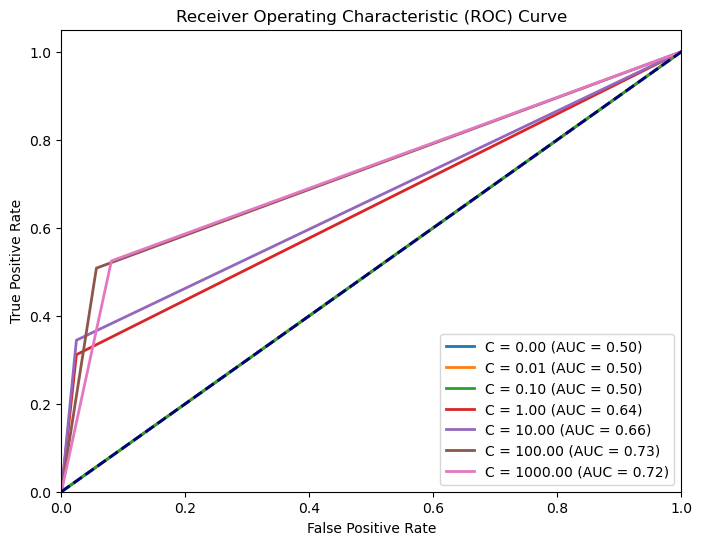

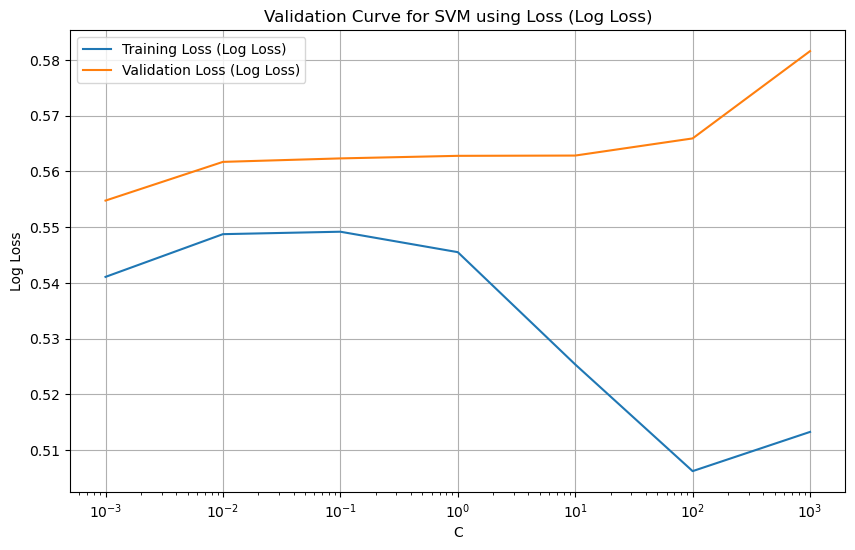

Average Accuracy: 0.7056586540457506
Elapsed time: 4.04477071762085 seconds
          C  Mean Accuracy
0     0.001       0.666306
1     0.010       0.666306
2     0.100       0.666306
3     1.000       0.685475
4    10.000       0.695470
5   100.000       0.702856
6  1000.000       0.705659


In [657]:

start_time=time.time()

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
# Define the range of parameter values you want to test (e.g., C values)
param_range = np.logspace(-3, 3, 7)  # Range of C values to explore
plt.figure(figsize=(8, 6))
# Initialize lists to store training and validation losses
train_losses = []
validation_losses = []
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
#X = cov_new[X]
#y = cov_new[y]
fold_accuracies = []   
fpr_list=[]
tpr_list=[]
results2=[]



for C_value in param_range:
    # Initialize lists to store losses for each fold
    fold_train_losses = []
    fold_validation_losses = []
    
    
    for train_idx, val_idx in kfold.split(X,y):
        X_train, X_val =X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        # Train an SVM with the current C value
        svm = SVC(kernel='rbf', C=C_value, random_state=0,probability=True)
        svm.fit(X_train, y_train)
        y_pred = svm.predict(X_val)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        
        fpr, tpr, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(fpr, tpr)
        fpr_list.append(fpr)
        tpr_list.append(tpr)
        
        # Plot ROC curve
        
       
        
        # Calculate training and validation losses (log loss in this case)
        train_loss = log_loss(y_train, svm.predict_proba(X_train))
        validation_loss = log_loss(y_val, svm.predict_proba(X_val))
        
        
        # Append the losses for this fold
        fold_train_losses.append(train_loss)
        fold_validation_losses.append(validation_loss)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        mean_accuracy=np.mean(fold_accuracies)
        
    results2.append({'C': C_value, 'Mean Accuracy': mean_accuracy})
        
      
   
        
        
        
    # Calculate the mean loss across folds for this C value
    mean_train_loss = np.mean(fold_train_losses)
    mean_validation_loss = np.mean(fold_validation_losses)
    
    # Append the mean losses to the respective lists
    train_losses.append(mean_train_loss)
    validation_losses.append(mean_validation_loss)
    
    plt.plot(fpr, tpr, lw=2, label=f'C = {C_value:.2f} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()    

    
plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_losses, label='Training Loss (Log Loss)')
plt.semilogx(param_range, validation_losses, label='Validation Loss (Log Loss)')
plt.xlabel('C')
plt.ylabel('Log Loss')
plt.title('Validation Curve for SVM using Loss (Log Loss)')
plt.legend()
plt.grid(True)
plt.show()


average_accuracy = np.mean(fold_accuracies)
print("Average Accuracy:", average_accuracy)


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")
results2_df=pd.DataFrame(results2)
print(results2_df)

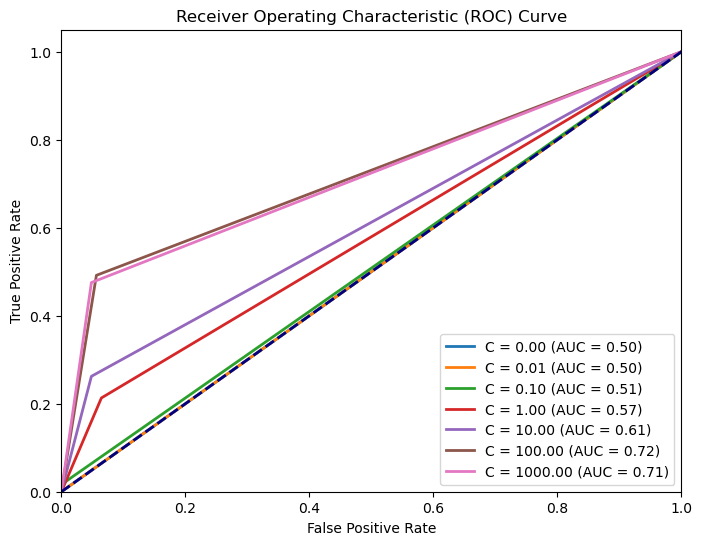

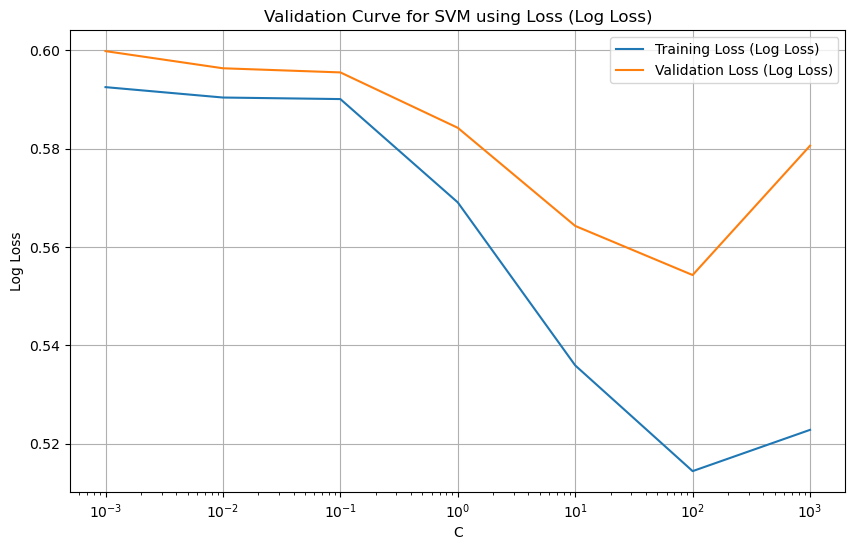

Average Accuracy: 0.7014854485822225
Elapsed time: 23.97522521018982 seconds
          C  Mean Accuracy
0     0.001       0.666306
1     0.010       0.666306
2     0.100       0.669904
3     1.000       0.676293
4    10.000       0.685960
5   100.000       0.696007
6  1000.000       0.701485


In [658]:
start_time=time.time()


results = [] 

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
# Define the range of parameter values you want to test (e.g., C values)
param_range = np.logspace(-3, 3, 7)  # Range of C values to explore
plt.figure(figsize=(8, 6))
# Initialize lists to store training and validation losses
train_losses = []
validation_losses = []
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]



#X = cov_new[X]
#y = cov_new[y]
fold_accuracies = []   
fpr_list=[]
tpr_list=[]
for C_value in param_range:
    # Initialize lists to store losses for each fold
    fold_train_losses = []
    fold_validation_losses = []
    
    
    
    for train_idx, val_idx in kfold.split(X,y):
        X_train, X_val =X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        # Train an SVM with the current C value
        svm = SVC(kernel='poly', C=C_value, random_state=0,probability=True)
        svm.fit(X_train, y_train)
        y_pred = svm.predict(X_val)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        
        fpr, tpr, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(fpr, tpr)
        fpr_list.append(fpr)
        tpr_list.append(tpr)
        
        # Plot ROC curve
        
       
        
        # Calculate training and validation losses (log loss in this case)
        train_loss = log_loss(y_train, svm.predict_proba(X_train))
        validation_loss = log_loss(y_val, svm.predict_proba(X_val))
        
        
        # Append the losses for this fold
        fold_train_losses.append(train_loss)
        fold_validation_losses.append(validation_loss)
        accuracy = accuracy_score(y_val, y_pred)
        accuracy=np.mean(accuracy)
        fold_accuracies.append(np.mean(accuracy))
        mean_accuracy = np.mean(fold_accuracies)
    results.append({'C': C_value, 'Mean Accuracy': mean_accuracy})
        
        
        
        
    # Calculate the mean loss across folds for this C value
    mean_train_loss = np.mean(fold_train_losses)
    mean_validation_loss = np.mean(fold_validation_losses)
    
    # Append the mean losses to the respective lists
    train_losses.append(mean_train_loss)
    validation_losses.append(mean_validation_loss)
    
    plt.plot(fpr, tpr, lw=2, label=f'C = {C_value:.2f} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()    

    
plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_losses, label='Training Loss (Log Loss)')
plt.semilogx(param_range, validation_losses, label='Validation Loss (Log Loss)')
plt.xlabel('C')
plt.ylabel('Log Loss')
plt.title('Validation Curve for SVM using Loss (Log Loss)')
plt.legend()
plt.grid(True)
plt.show()


average_accuracy = np.mean(fold_accuracies)
print("Average Accuracy:", average_accuracy)
end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")
results_df = pd.DataFrame(results)
print(results_df)

decision tree


tree depth: 1


<Figure size 800x600 with 0 Axes>

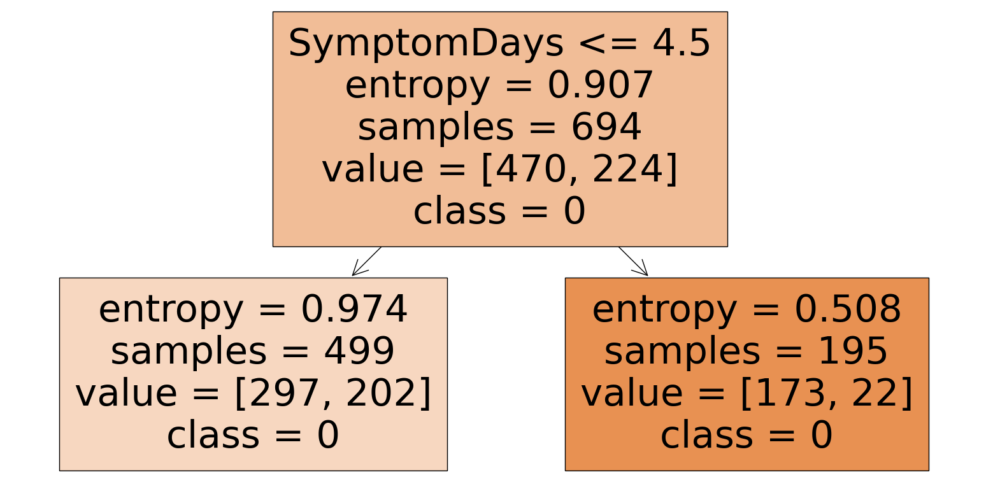

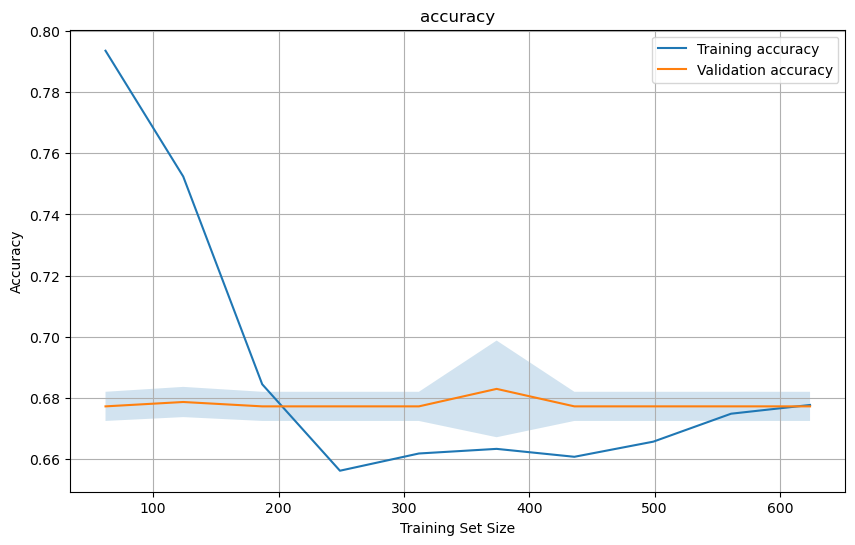

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 2


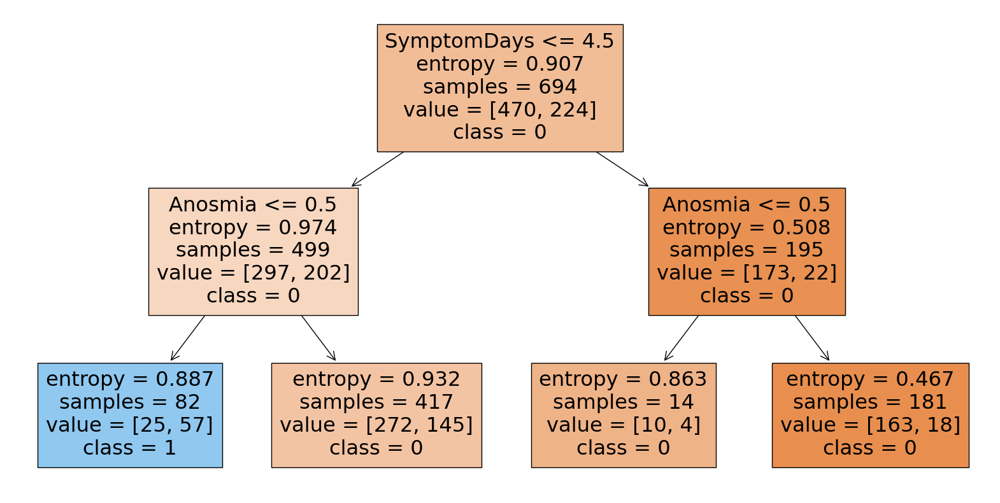

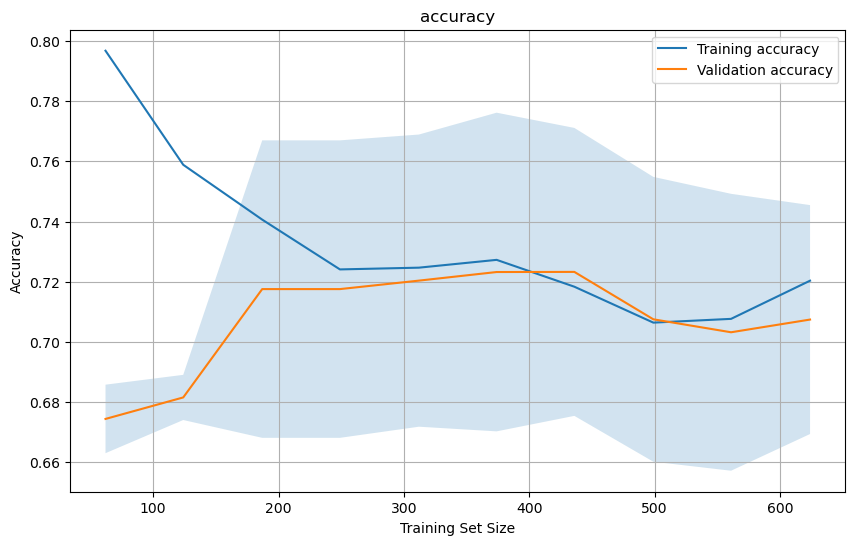

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 3


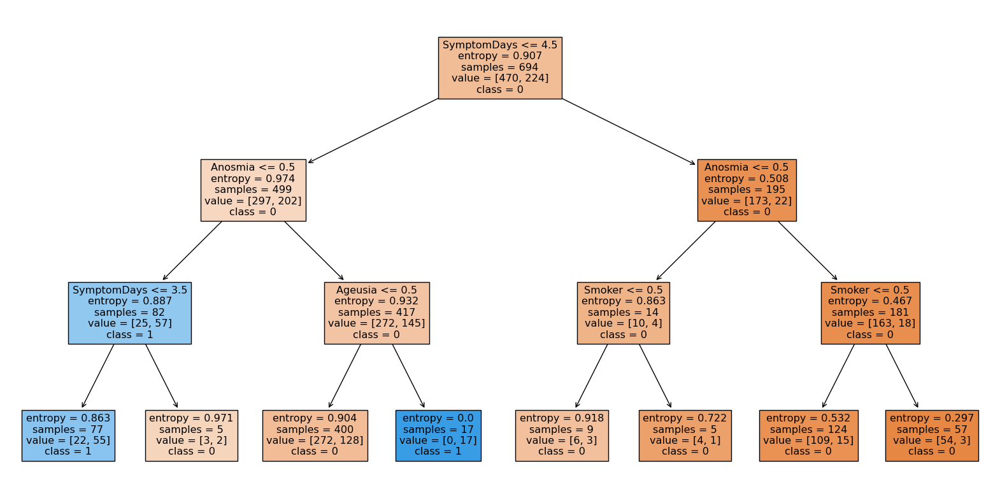

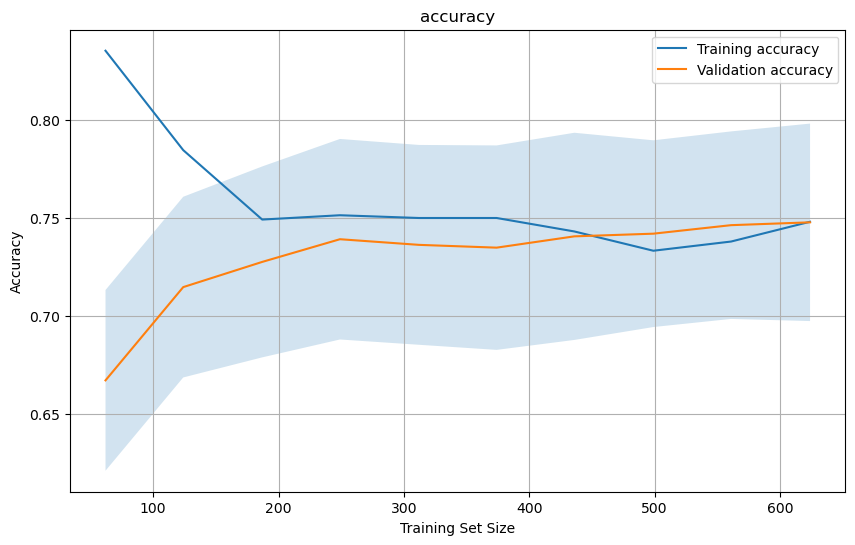

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 4


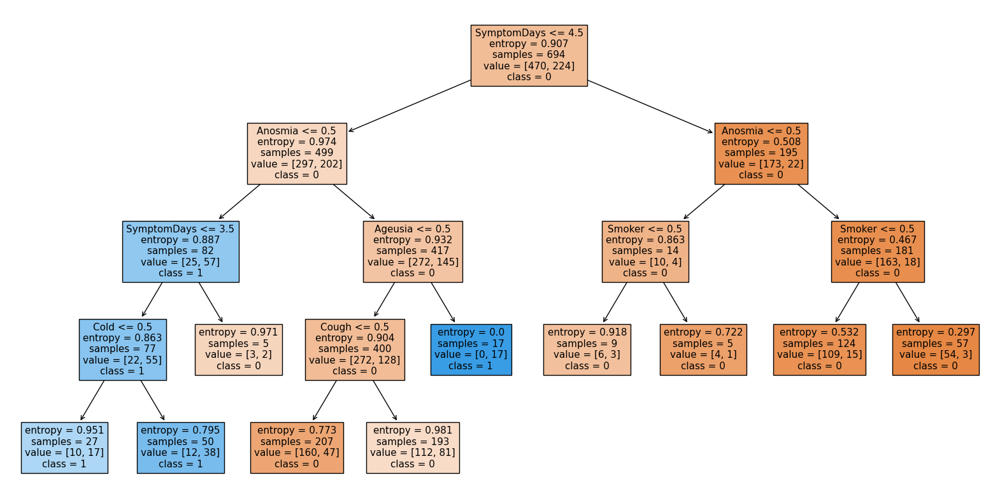

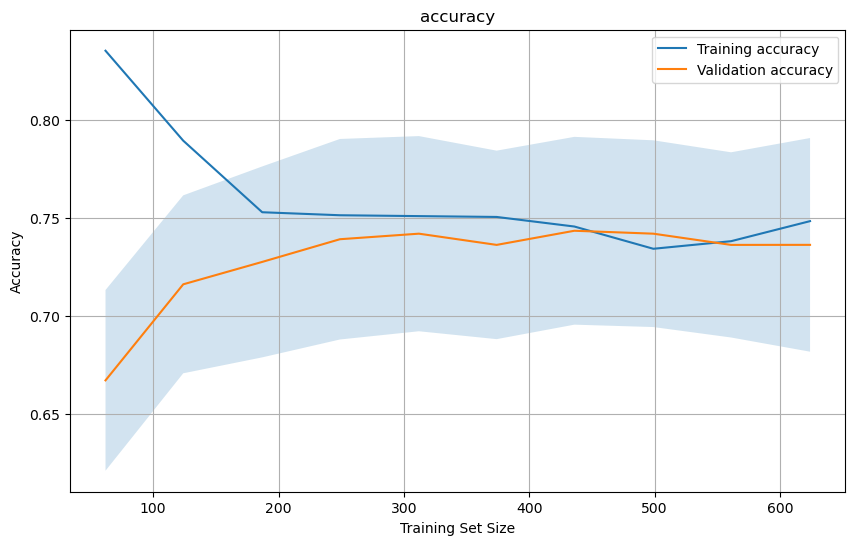

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 5


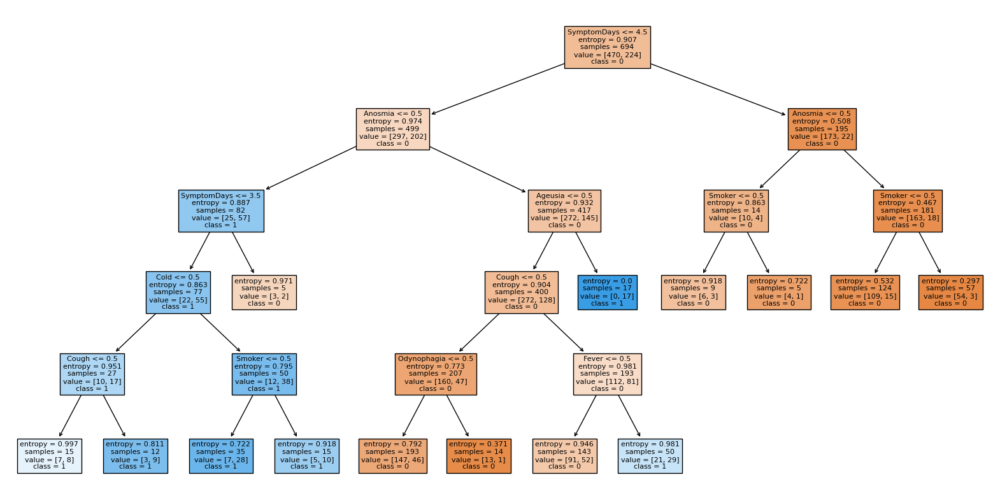

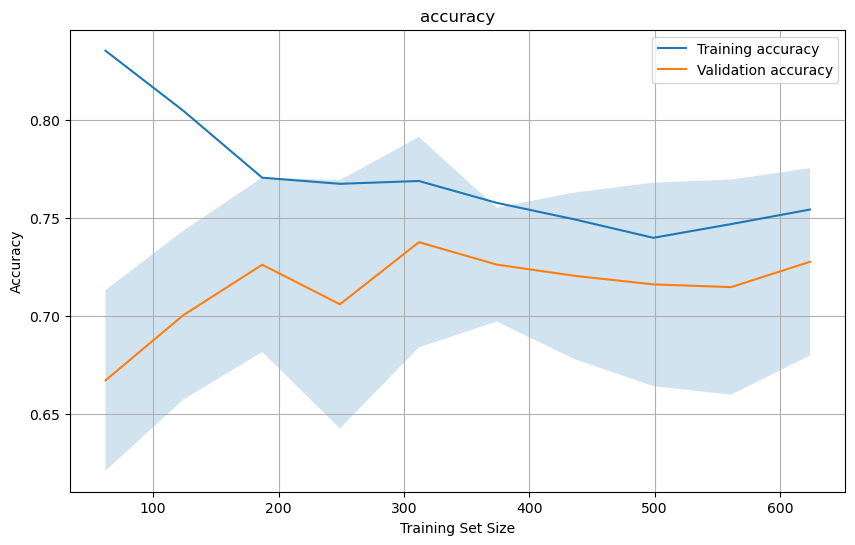

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 6


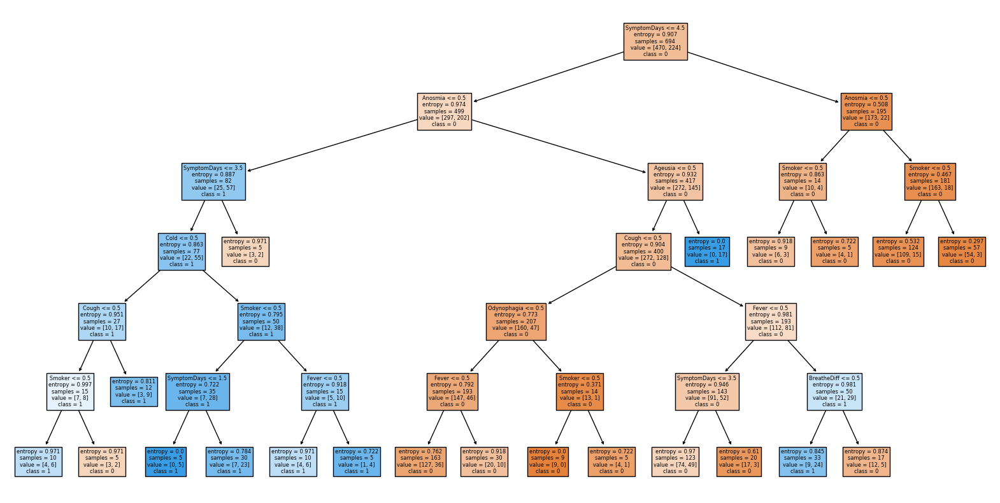

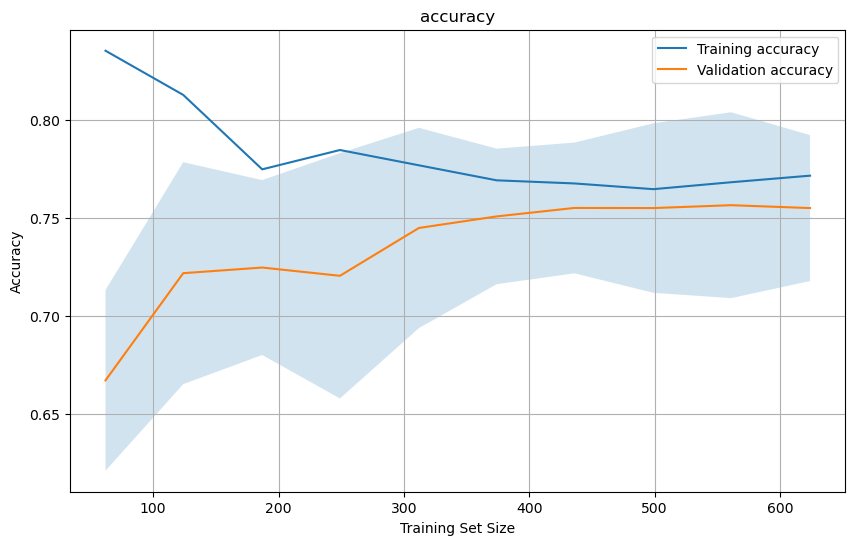

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 7


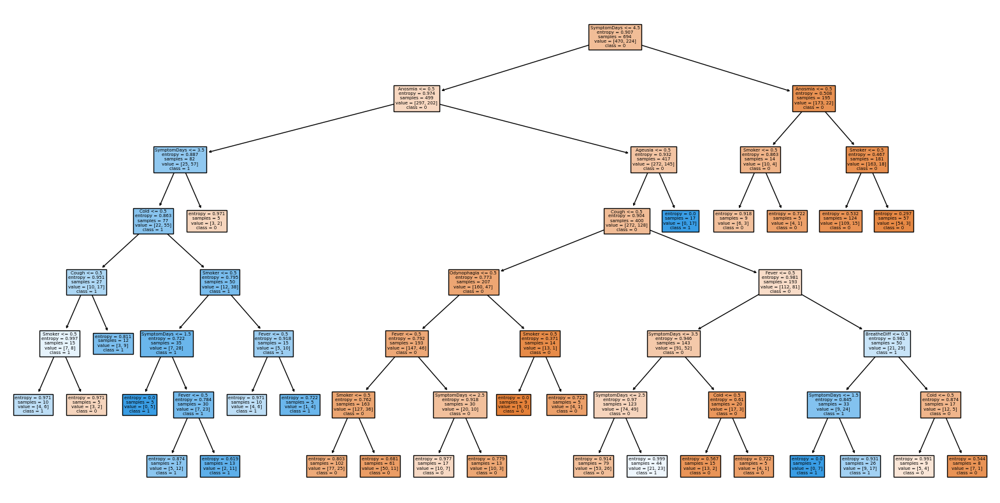

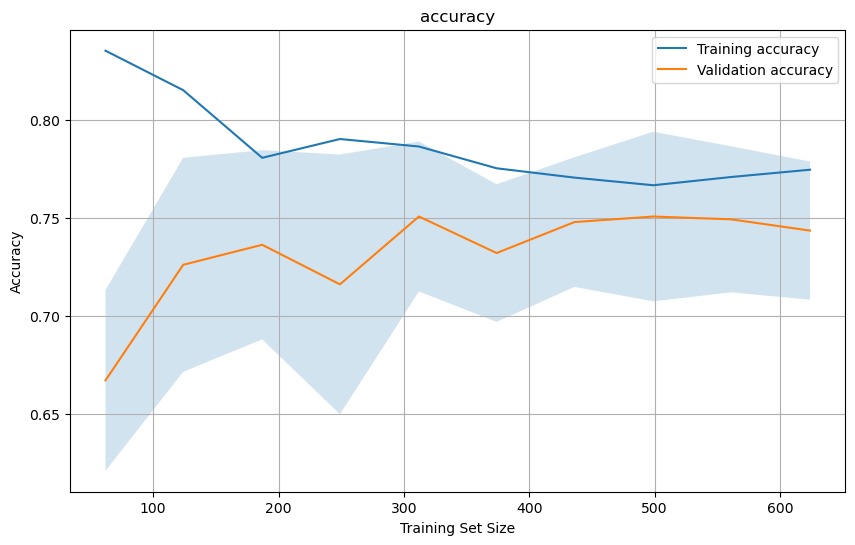

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 8


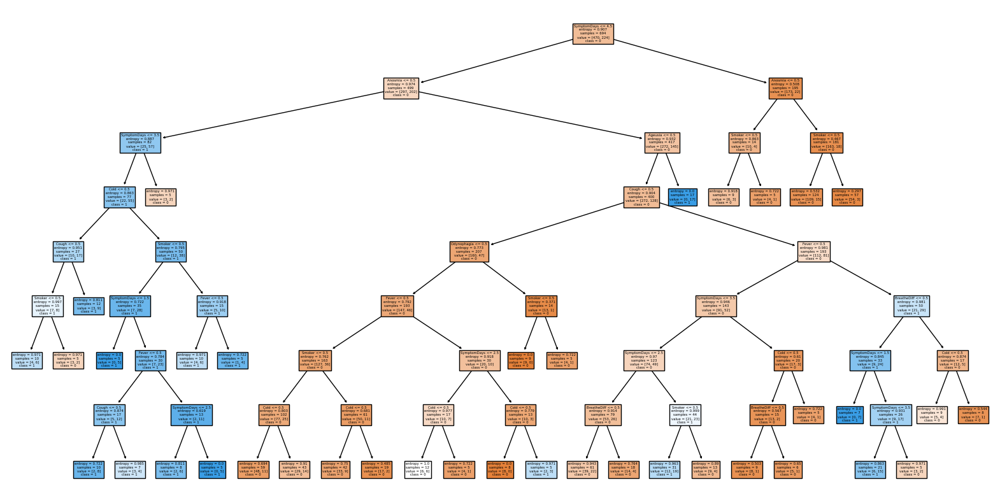

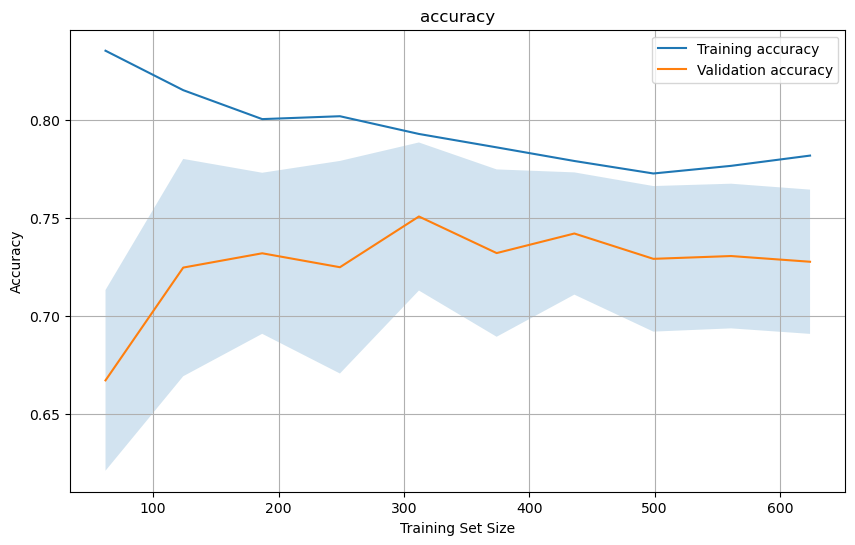

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 9


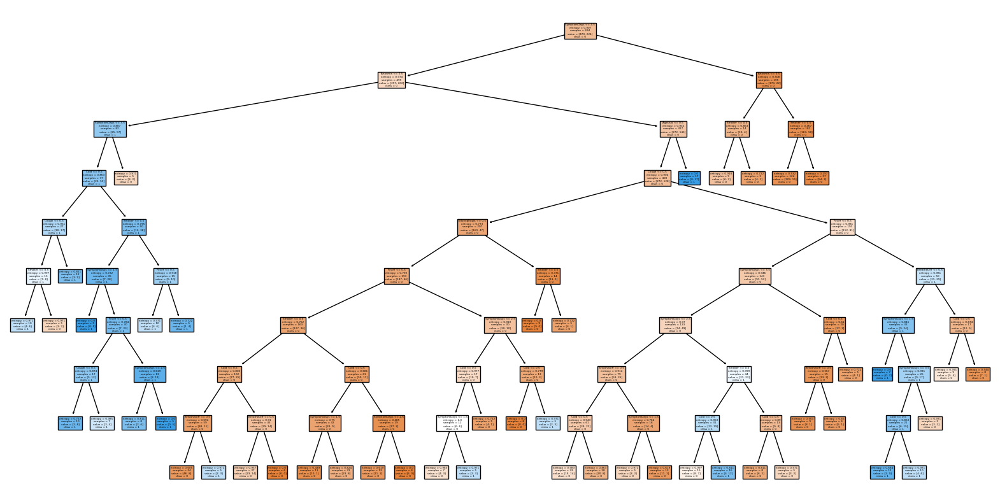

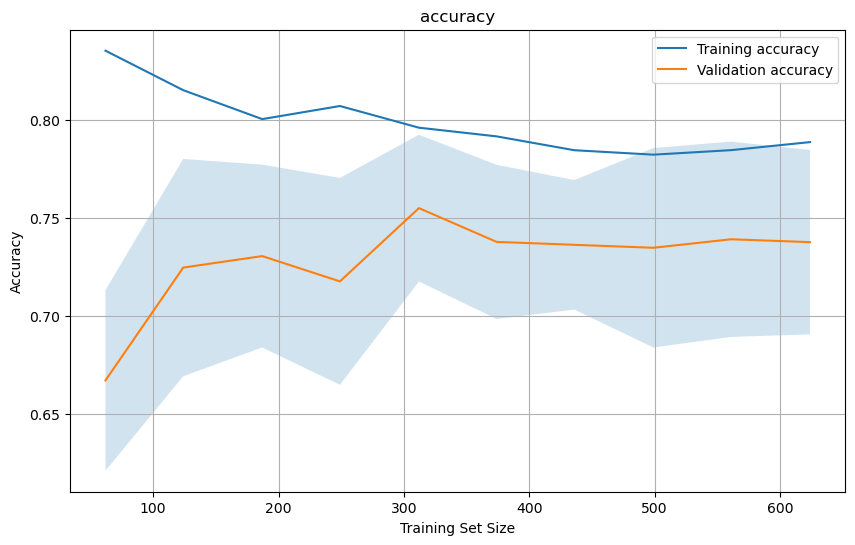

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/154084663.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


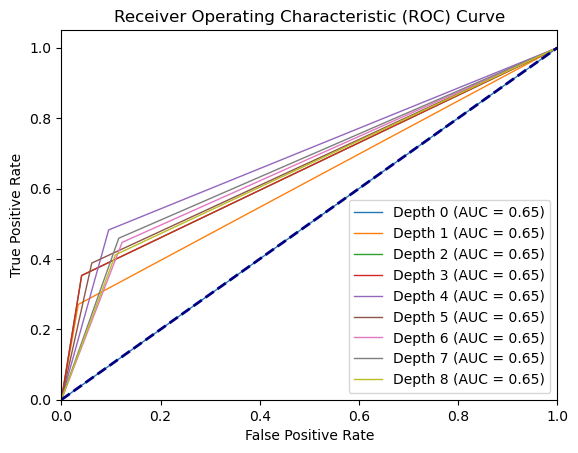

Average Accuracy: 0.7280517598343685
   Tree Depth  Training Accuracy  Validation Accuracy
0         1.0           0.677724             0.677267
1         2.0           0.720353             0.707433
2         3.0           0.748077             0.747785
3         4.0           0.748397             0.736273
4         5.0           0.754327             0.727619
5         6.0           0.771635             0.755072
6         7.0           0.774679             0.743561
7         8.0           0.781891             0.727640
8         9.0           0.788782             0.737660
Elapsed time: 6.409780979156494 seconds


In [659]:
start_time=time.time()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.model_selection import learning_curve
from sklearn.metrics import confusion_matrix


accuracy_table = pd.DataFrame(columns=['Tree Depth', 'Training Accuracy', 'Validation Accuracy'])


X_train, X_test, y_train, y_test = train_test_split(cov_new[features], cov_new[target], test_size = 0.25)
plt.figure(figsize=(8, 6))

fpr_list=[]
tpr_list=[]

for i in range(1,10):
    # Create a decision tree classifier
    clf = DecisionTreeClassifier(criterion="entropy", random_state=100, max_depth=i, min_samples_leaf=5)
    # Calculate learning curve
    train_sizes, train_scores, test_scores = learning_curve(
    clf, X_train, y_train, cv=10, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy', n_jobs=-1
)
    clf.fit(X_train, y_train)
    # Get the class names from the target variable
    class_names = y_train.unique().astype(str)
    # Plot the decision tree
    print("tree depth:",i)
    plt.figure(figsize=(20, 10))
    plot_tree(clf, filled=True, feature_names=X_train.columns, class_names=class_names)
    plt.show()
    # Calculate mean and standard deviation of scores
    mean_train_scores = np.mean(train_scores, axis=1)
    mean_test_scores = np.mean(test_scores, axis=1)
    std_test_scores = np.std(test_scores, axis=1)
    
    y_pred=clf.predict(X_test)
    # Plot learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, mean_train_scores, label='Training accuracy')
    plt.plot(train_sizes, mean_test_scores, label='Validation accuracy')
    plt.fill_between(train_sizes, mean_test_scores - std_test_scores, mean_test_scores + std_test_scores, alpha=0.2)
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.title('accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    
    
    accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)
   
    #plot roc curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    fpr_list.append(fpr) 
    tpr_list.append(tpr)
        
    # Plot ROC curve
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'Depth {i} (AUC = {roc_auc:.2f})')
    
    #plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    



from sklearn.tree import DecisionTreeClassifier, plot_tree
print("Average Accuracy:", np.mean(mean_test_scores))
print(accuracy_table)

end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")



In [660]:
# Logistic Regression

<Figure size 1200x800 with 0 Axes>

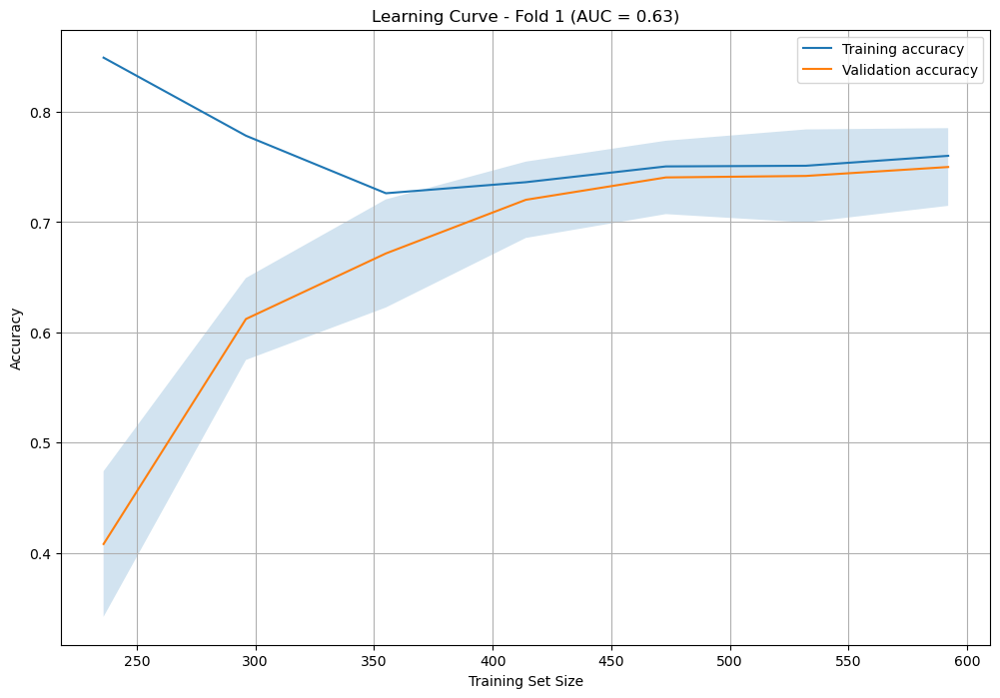

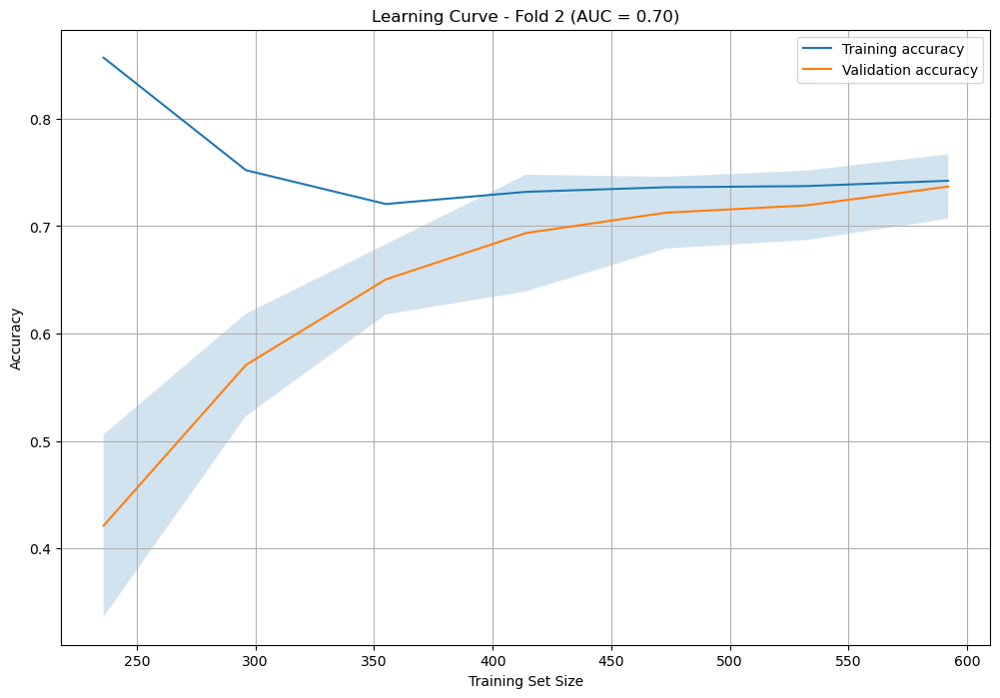

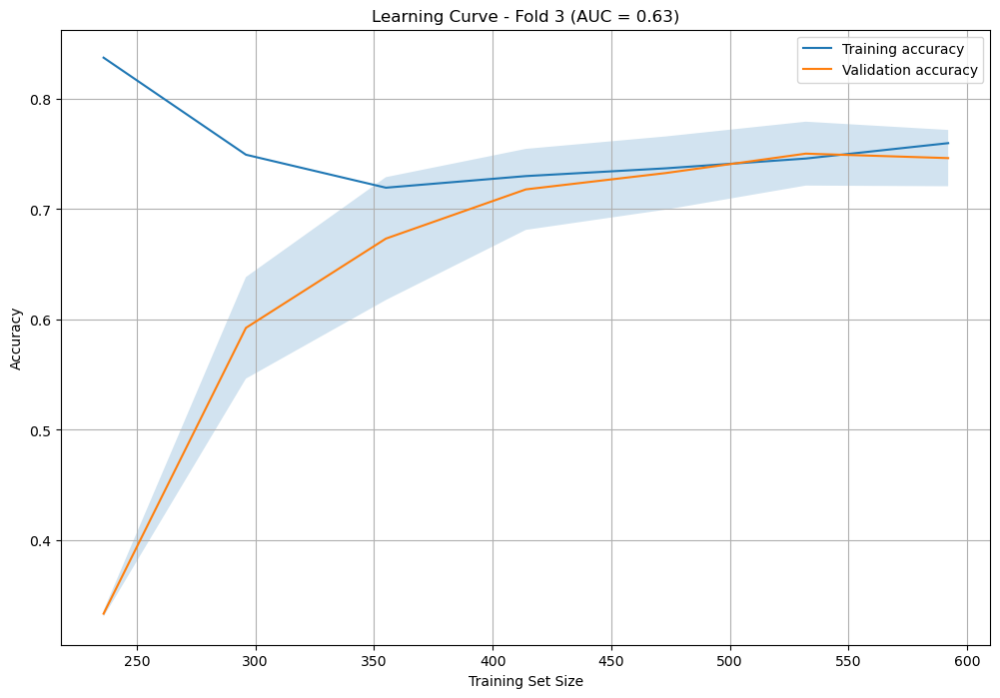

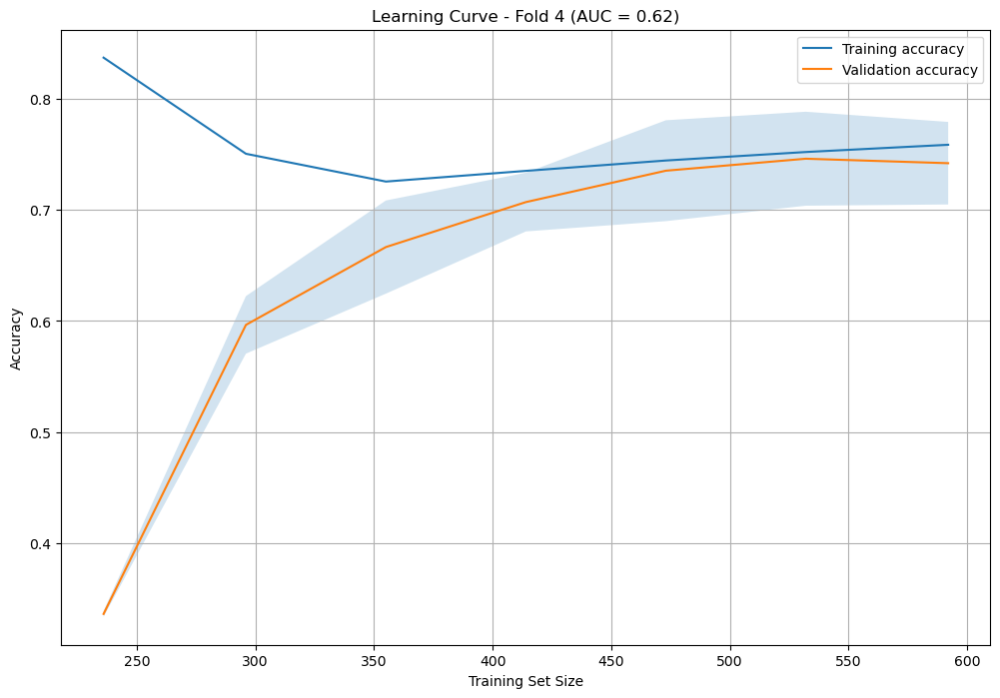

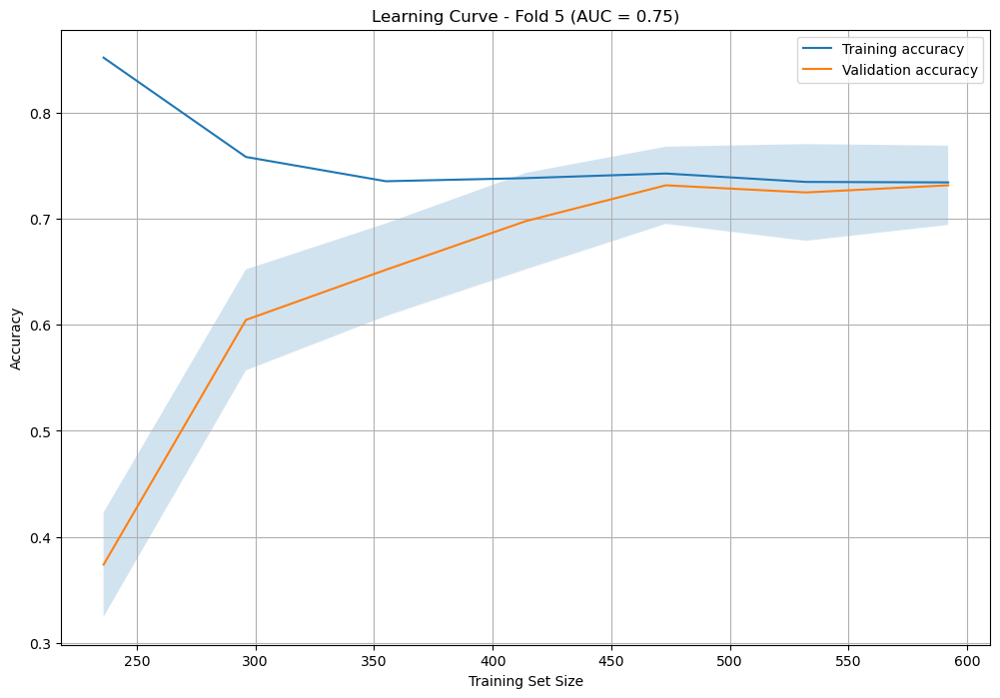

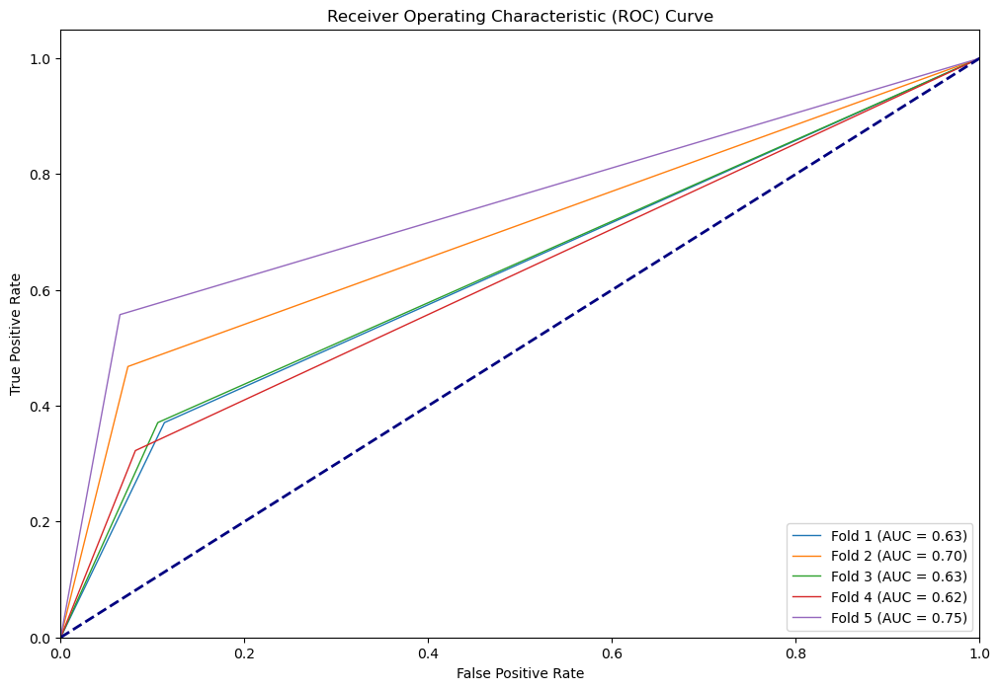

average accuracy 0.7473350770124964
Elapsed time: 0.7419099807739258 seconds


In [661]:
start_time=time.time()



import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold  # Import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.model_selection import learning_curve

# Assuming you have already defined 'cov_new', 'features', and 'target' earlier in your code.
acc=[]
X = cov_new[features]
y = cov_new[target]

plt.figure(figsize=(12, 8))

fpr_list = []
tpr_list = []

# Create StratifiedKFold for cross-validation
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=100)

for train_idx, test_idx in kf.split(X, y):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Create a logistic regression classifier
    clf = LogisticRegression(random_state=100, max_iter=1000)  # You can adjust parameters as needed
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    acc1=accuracy_score(y_test,y_pred)
    acc.append(acc1)

    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    fpr_list.append(fpr)
    tpr_list.append(tpr)

    # Plot learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        clf, X_train, y_train, cv=5, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy', n_jobs=-1
    )

    mean_train_scores = np.mean(train_scores, axis=1)
    mean_test_scores = np.mean(test_scores, axis=1)
    std_test_scores = np.std(test_scores, axis=1)

    plt.figure(figsize=(12, 8))
    plt.plot(train_sizes, mean_train_scores, label='Training accuracy')
    plt.plot(train_sizes, mean_test_scores, label='Validation accuracy')
    plt.fill_between(train_sizes, mean_test_scores - std_test_scores, mean_test_scores + std_test_scores, alpha=0.2)
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.title(f'Learning Curve - Fold {len(fpr_list)} (AUC = {roc_auc:.2f})')
    plt.legend()
    plt.grid(True)

# Plot ROC curves for all folds
plt.figure(figsize=(12, 8))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'Fold {i + 1} (AUC = {auc(fpr_list[i], tpr_list[i]):.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
acc2=np.mean(acc)
print("average accuracy",acc2)



end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")


# Using the new resampled dataset

In [662]:
covid_resampled= pd.read_csv("covid2_resampled.csv")
covid_resampled.head(2)

,Season,Gender,RinitisSinusitis,RespiratoryAllegies,Hypertension,Diabetes,Cold,Cough,BreatheDiff,SymptomDays,Smoker,COVI19_PCR,Age_group,Ageusia,Odynophagia,Asthma,Hypothyroidism,SoreThroat,ChestPain,Fever,Anosmia,under_cond
0,1,1,0,0,0,0,0,1,0,3,0,0,2,0,0,0,0,0,0,0,1,0
1,1,1,0,0,0,0,1,1,1,2,0,0,2,0,0,0,0,0,0,0,1,0


# Using all columns and doing a NN

In [663]:
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid_resampled.drop(columns=[target]).columns.tolist()
features



['Season',
 'Gender',
 'RinitisSinusitis',
 'RespiratoryAllegies',
 'Hypertension',
 'Diabetes',
 'Cold',
 'Cough',
 'BreatheDiff',
 'SymptomDays',
 'Smoker',
 'Age_group',
 'Ageusia',
 'Odynophagia',
 'Asthma',
 'Hypothyroidism',
 'SoreThroat',
 'ChestPain',
 'Fever',
 'Anosmia',
 'under_cond']

1/1 [==============================] - 0s 13ms/step


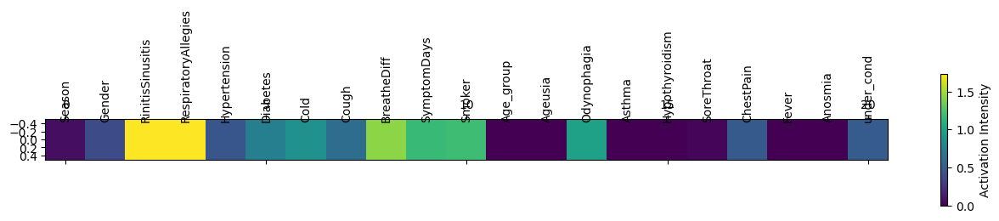

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

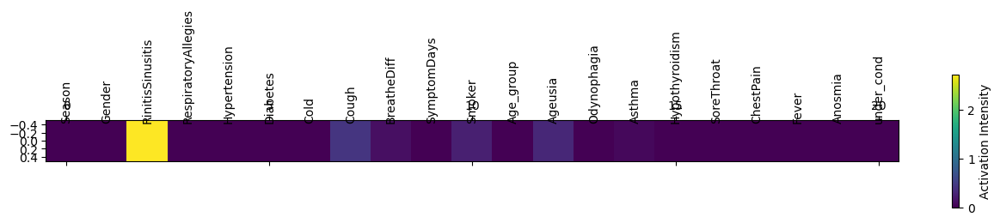

1/1 [==============================] - 0s 12ms/step


<Figure size 800x600 with 0 Axes>

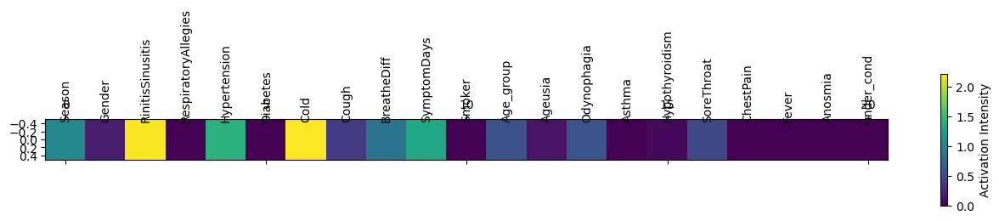

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

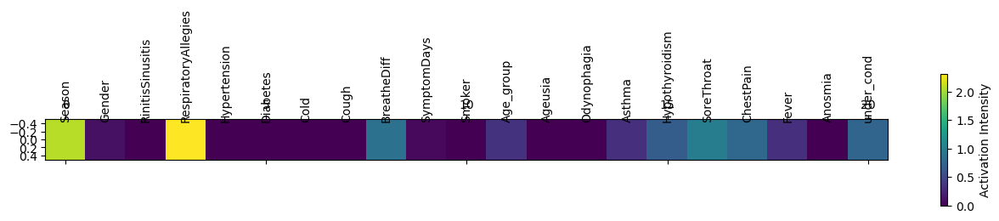

1/1 [==============================] - 0s 12ms/step


<Figure size 800x600 with 0 Axes>

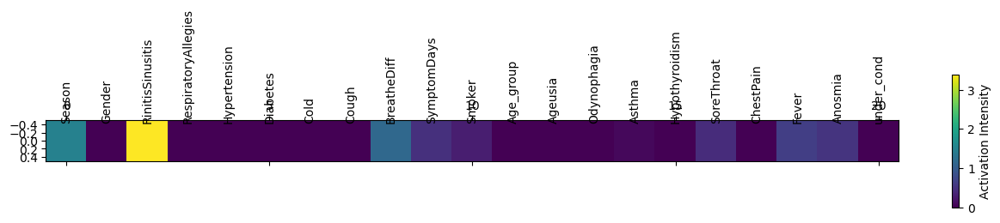

32/32 [==============================] - 0s 278us/step


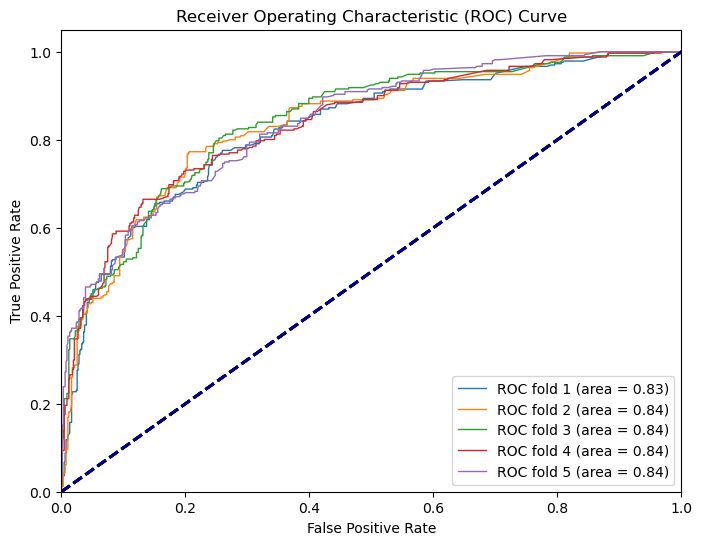

Average ROC AUC: 0.8356368405342867


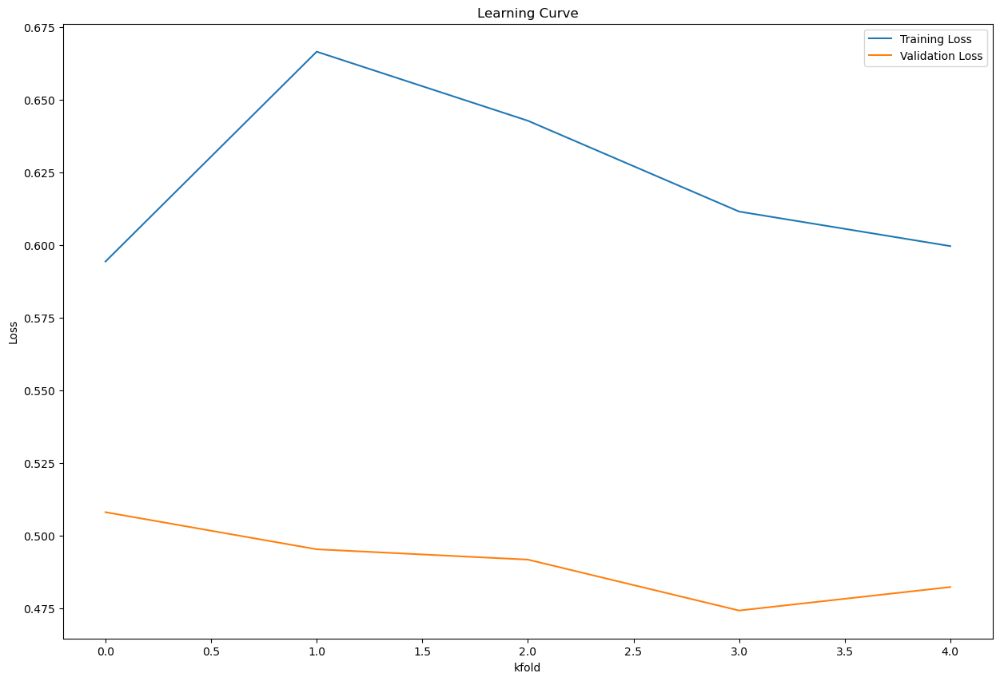

Elapsed time: 7.483442068099976 seconds


In [664]:
start_time=time.time()


from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

#defining features and target

roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = covid_resampled[features]
y = covid_resampled[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(21, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(9, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    tpr_list.append(tpr)
    fpr_list.append(fpr)
    # Plot the average ROC curve
    plt.figure(figsize=(8, 6))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')
    
    
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
print("Average ROC AUC:", average_roc_auc)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend()
plt.show()

end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")



1/1 [==============================] - 0s 13ms/step


<Figure size 1000x800 with 0 Axes>

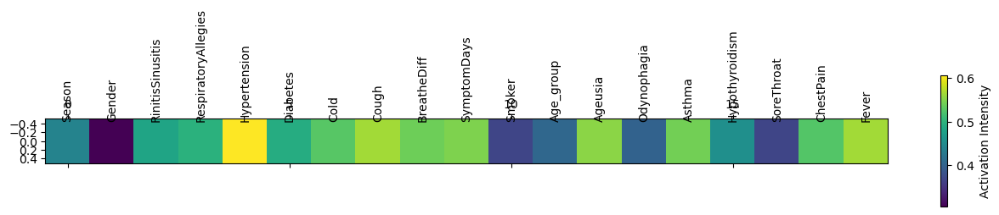

1/1 [==============================] - 0s 12ms/step


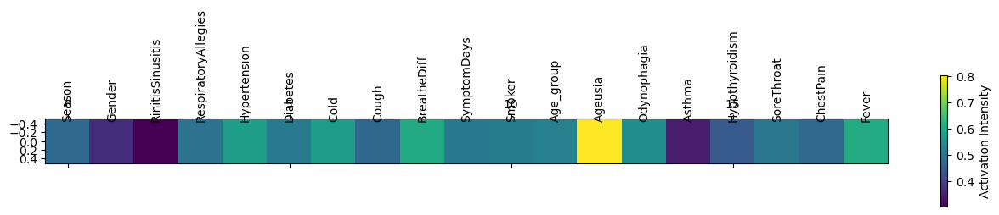

1/1 [==============================] - 0s 12ms/step


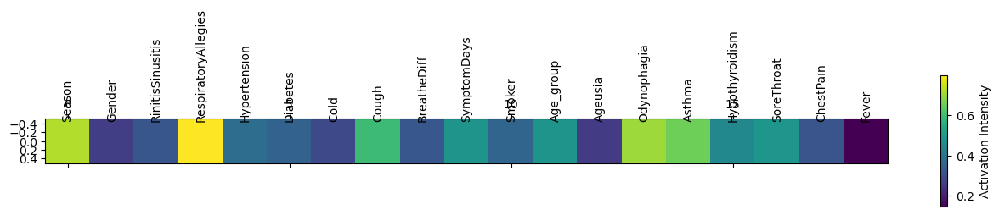

1/1 [==============================] - 0s 13ms/step


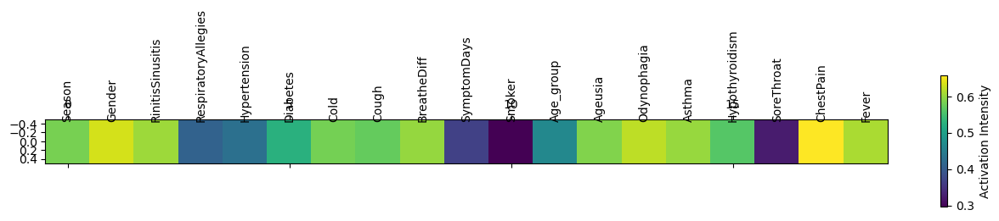

1/1 [==============================] - 0s 14ms/step


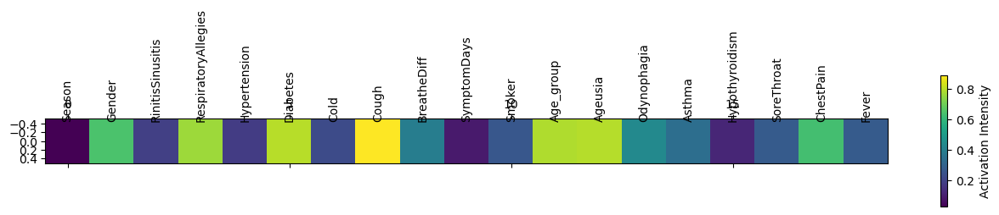

32/32 [==============================] - 0s 271us/step


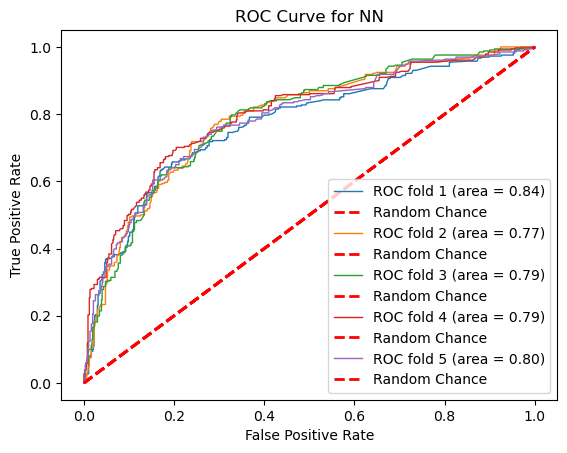

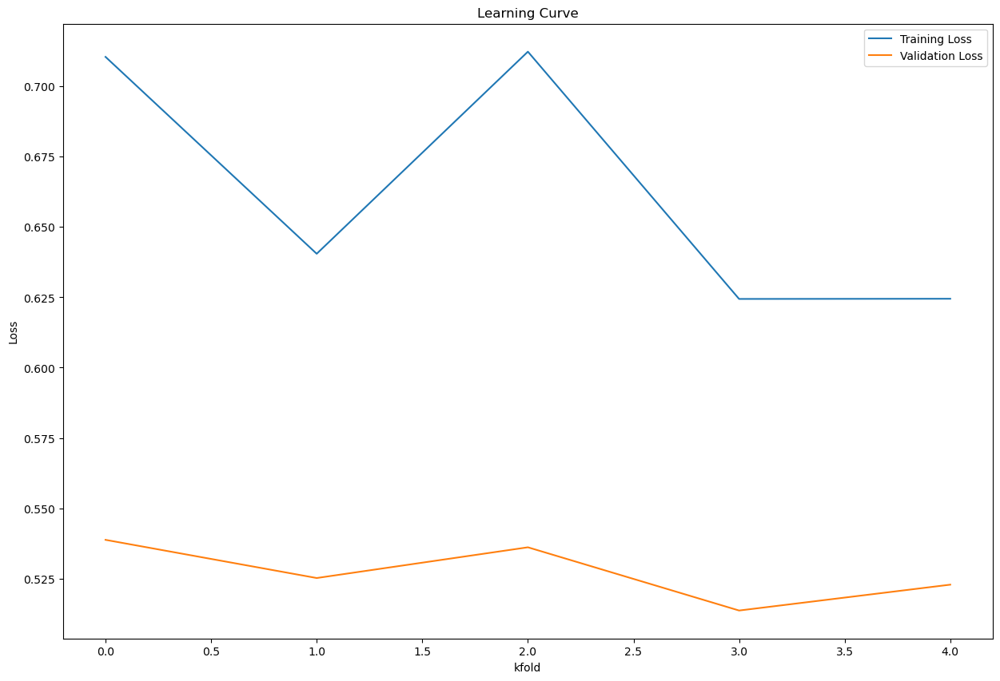

0.7456000089645386
Elapsed time: 7.454258918762207 seconds


In [665]:
start_time=time.time()

from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold


plt.figure(figsize=(10, 8))
#defining features and target
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid_resampled.drop(columns=[target]).columns.tolist()
#features


roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 
X = covid_resampled[features]
y = covid_resampled[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]


for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx],X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(19, activation='sigmoid', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(10, activation='sigmoid'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    
    roc_auc_scores.append(roc_auc)
    
    #tpr_list.append(tpr)
    #fpr_list.append(fpr)
    # Plot the average ROC curve
   # Compute ROC curve
    roc_auc = auc(fpr, tpr)
    #plt.plot(fpr, tpr, lw=1, label=f'ROC fold (area = {roc_auc:.2f})')
    fpr_list.append(fpr)
    tpr_list.append(tpr)
    
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Random Chance')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for NN')
plt.legend(loc='best')
plt.show()

    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
#print("Average ROC AUC:", average_roc_auc)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')


plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()


print(average_accuracy)

end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")


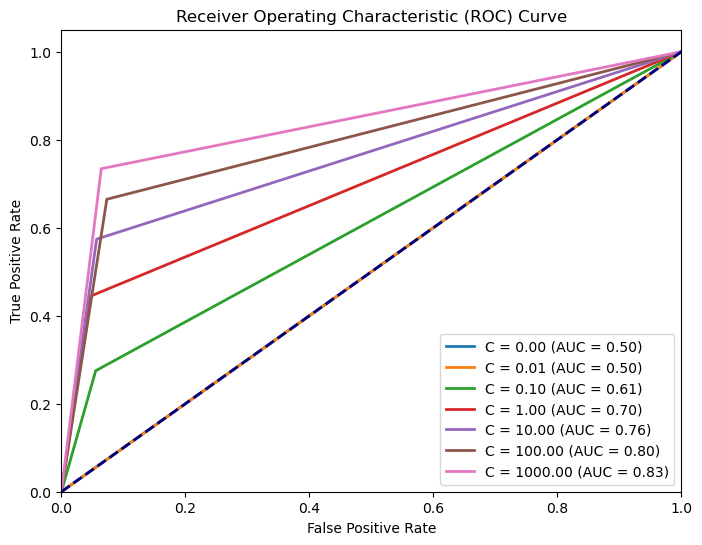

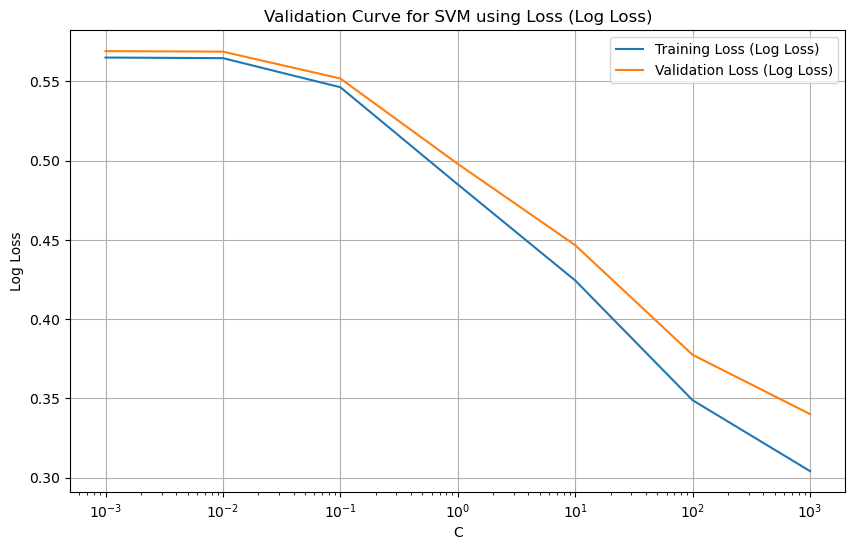

Average Accuracy: 0.7630571428571429
Elapsed time: 473.05999422073364 seconds


In [666]:
#SVM using entire resampled dataset
start_time=time.time()

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score

target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid_resampled.drop(columns=[target]).columns.tolist()
#features



X = covid_resampled[features]
y = covid_resampled[target]



param_range = np.logspace(-3, 3, 7)  # Range of C values to explore
plt.figure(figsize=(8, 6))
# Initialize lists to store training and validation losses
train_losses = []
validation_losses = []
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
results=[]
#X = cov_new[X]
#y = cov_new[y]
fold_accuracies = []   
fpr_list=[]
tpr_list=[]
for C_value in param_range:
    # Initialize lists to store losses for each fold
    fold_train_losses = []
    fold_validation_losses = []
    
    
    for train_idx, val_idx in kfold.split(X,y):
        X_train, X_val =X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        # Train an SVM with the current C value
        svm = SVC(kernel='poly', C=C_value, random_state=0,probability=True)
        svm.fit(X_train, y_train)
        y_pred = svm.predict(X_val)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        
        fpr, tpr, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(fpr, tpr)
        fpr_list.append(fpr)
        tpr_list.append(tpr)
        
        # Plot ROC curve
        
       
        
        # Calculate training and validation losses (log loss in this case)
        train_loss = log_loss(y_train, svm.predict_proba(X_train))
        validation_loss = log_loss(y_val, svm.predict_proba(X_val))
        
        
        # Append the losses for this fold
        fold_train_losses.append(train_loss)
        fold_validation_losses.append(validation_loss)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        mean_accuracy=np.mean(fold_accuracies)
        
        
    results.append({'C': C_value, 'Mean Accuracy': mean_accuracy})
        
        
        
    # Calculate the mean loss across folds for this C value
    mean_train_loss = np.mean(fold_train_losses)
    mean_validation_loss = np.mean(fold_validation_losses)
    
    # Append the mean losses to the respective lists
    train_losses.append(mean_train_loss)
    validation_losses.append(mean_validation_loss)
    
    plt.plot(fpr, tpr, lw=2, label=f'C = {C_value:.2f} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()    

    
plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_losses, label='Training Loss (Log Loss)')
plt.semilogx(param_range, validation_losses, label='Validation Loss (Log Loss)')
plt.xlabel('C')
plt.ylabel('Log Loss')
plt.title('Validation Curve for SVM using Loss (Log Loss)')
plt.legend()
plt.grid(True)
plt.show()


average_accuracy = np.mean(fold_accuracies)
print("Average Accuracy:", average_accuracy)


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")


tree depth: 1


<Figure size 800x600 with 0 Axes>

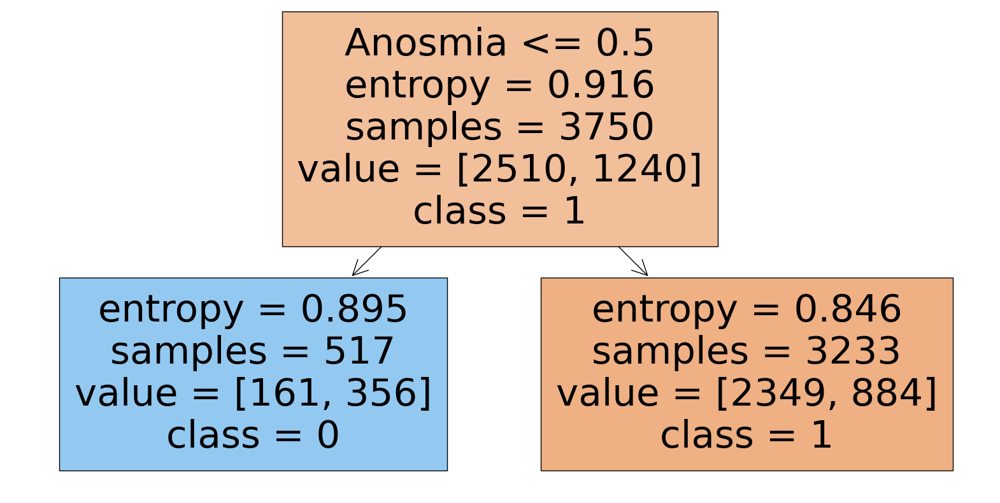

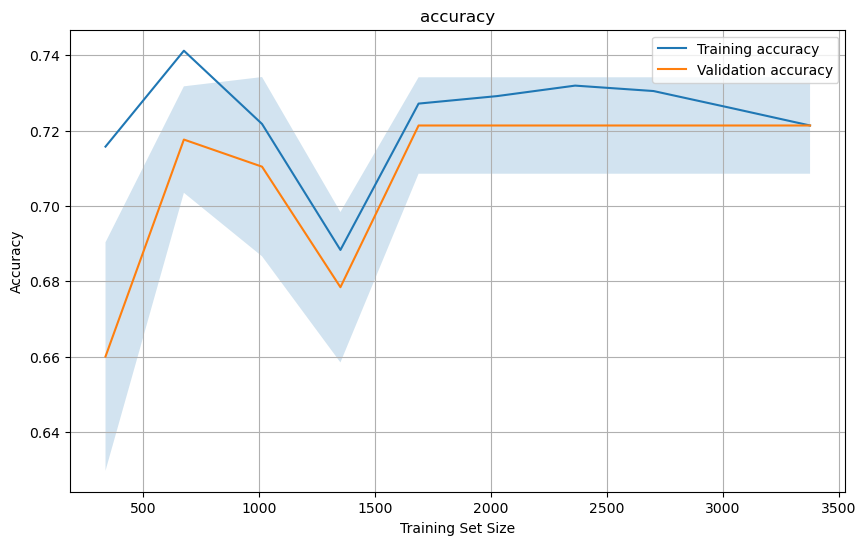

tree depth: 2


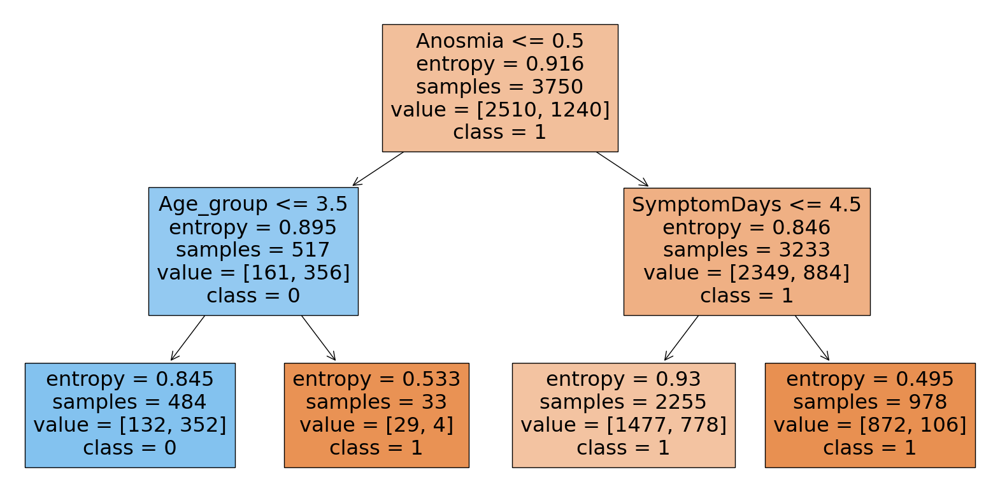

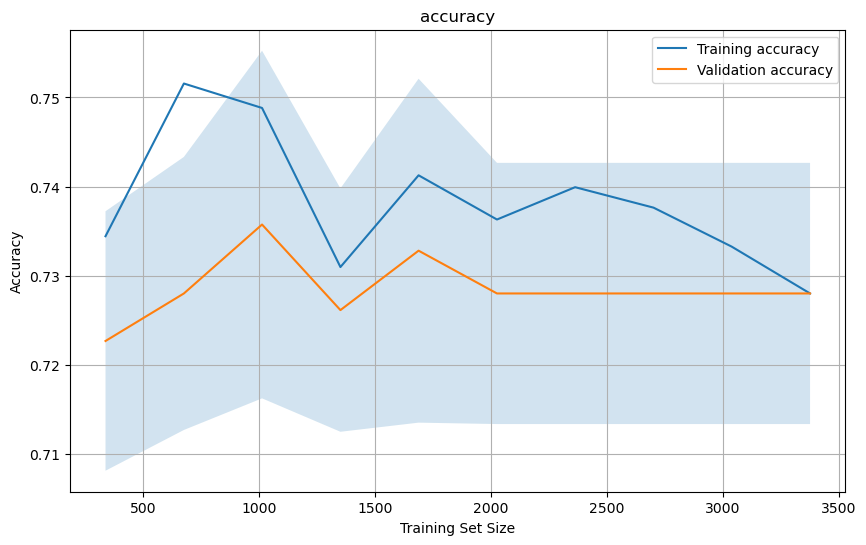

tree depth: 3


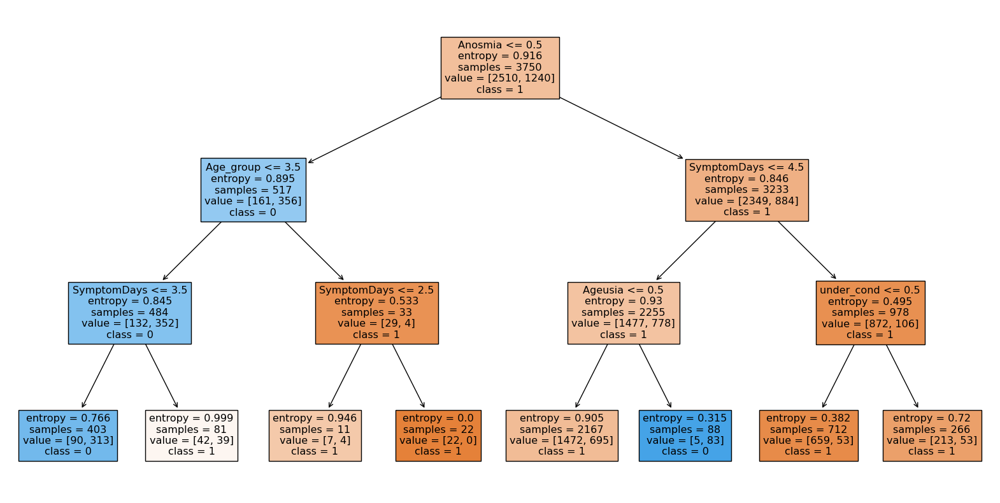

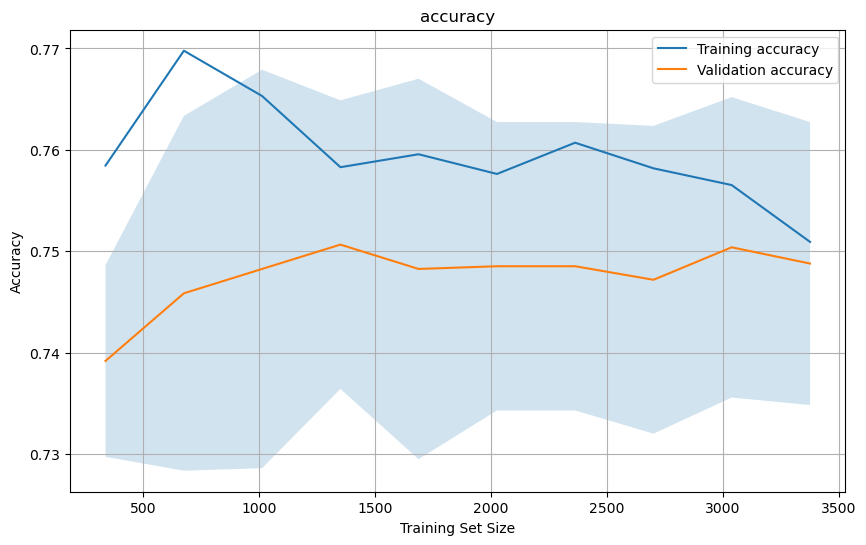

tree depth: 4


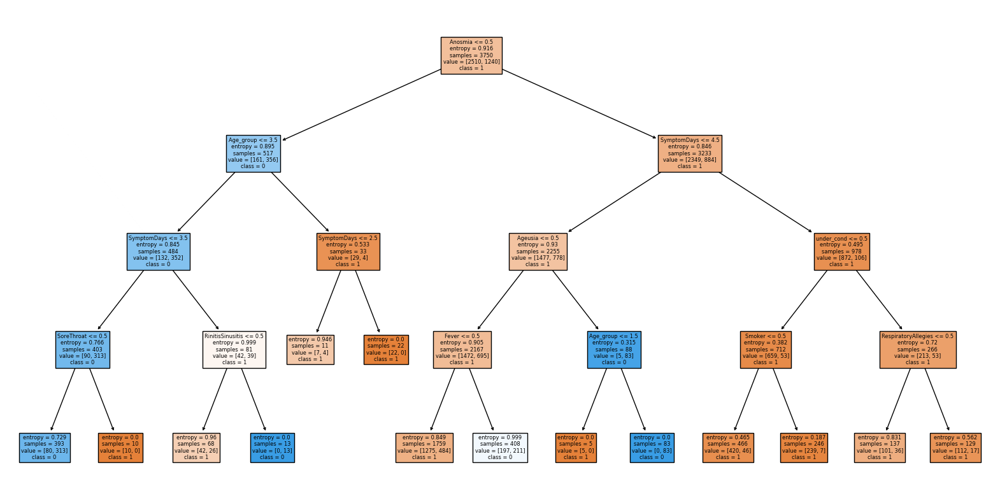

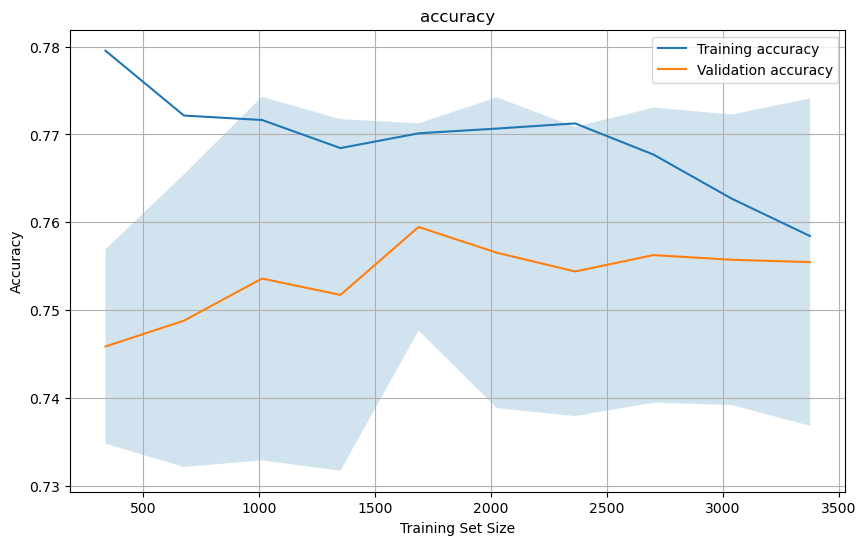

tree depth: 5


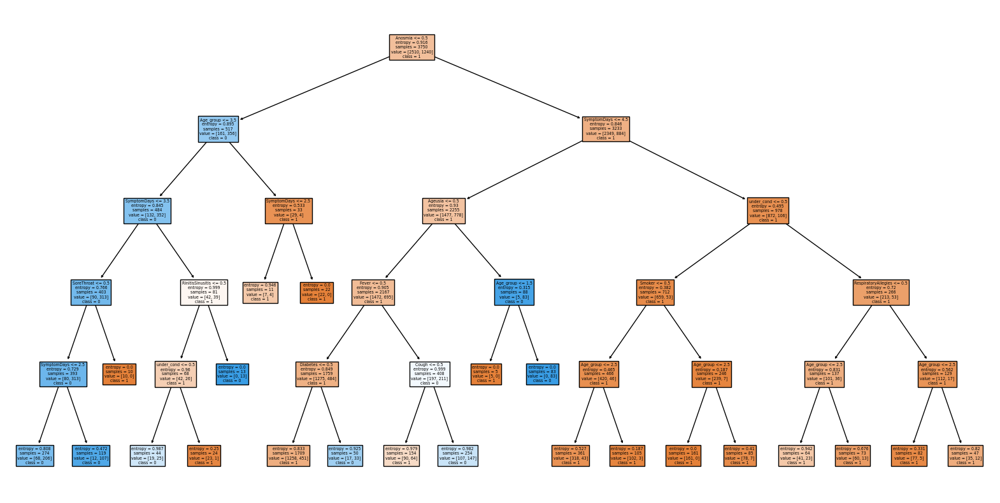

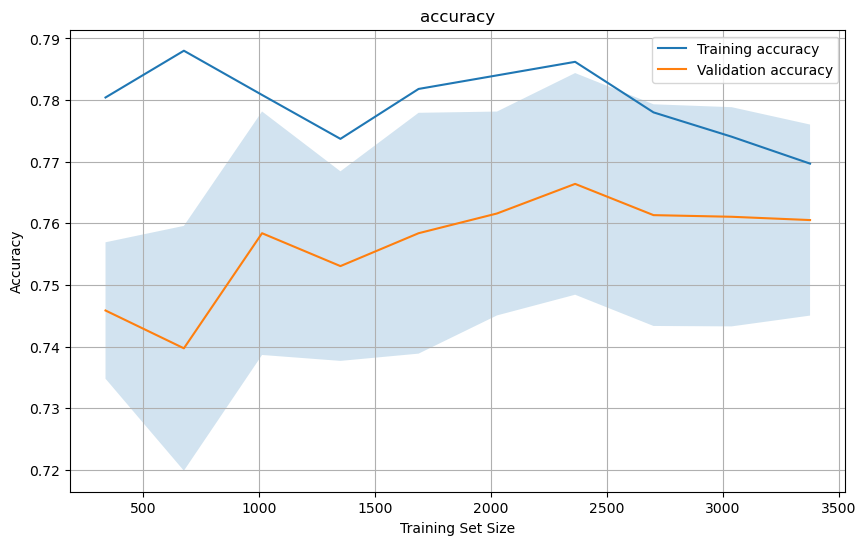

tree depth: 6


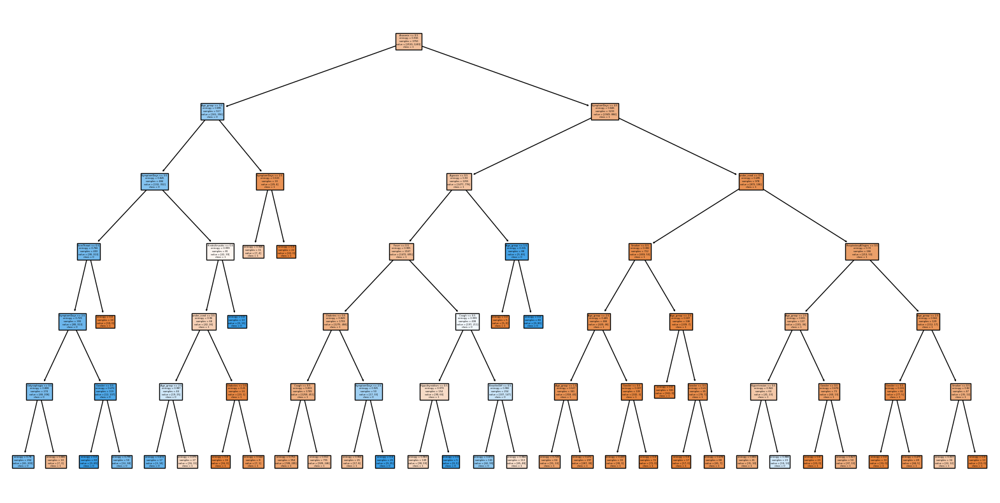

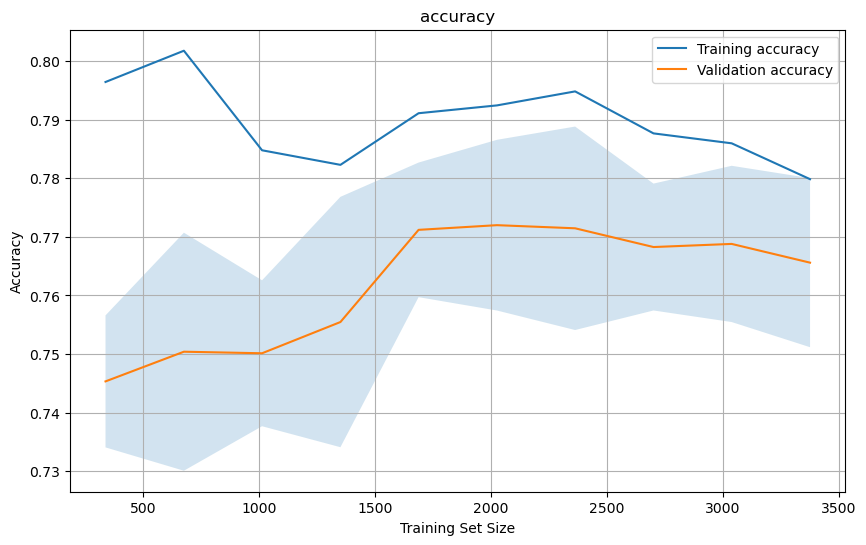

tree depth: 7


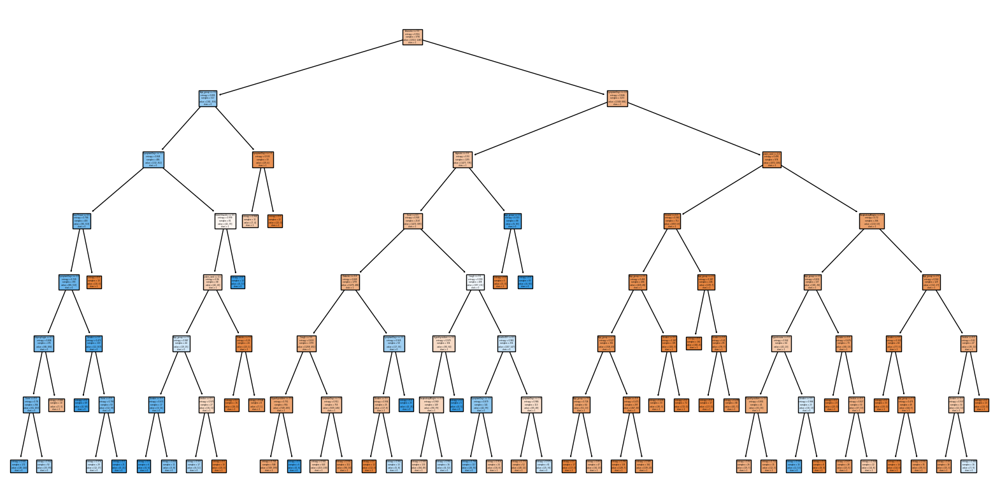

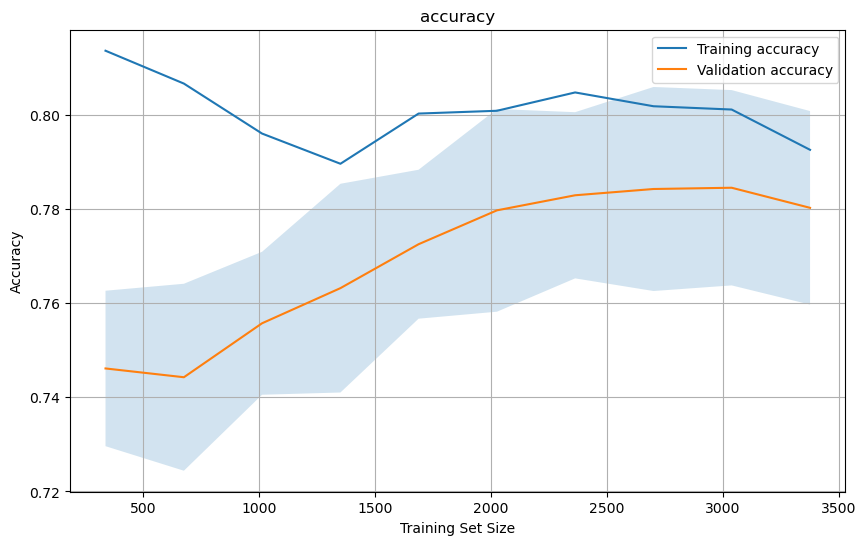

tree depth: 8


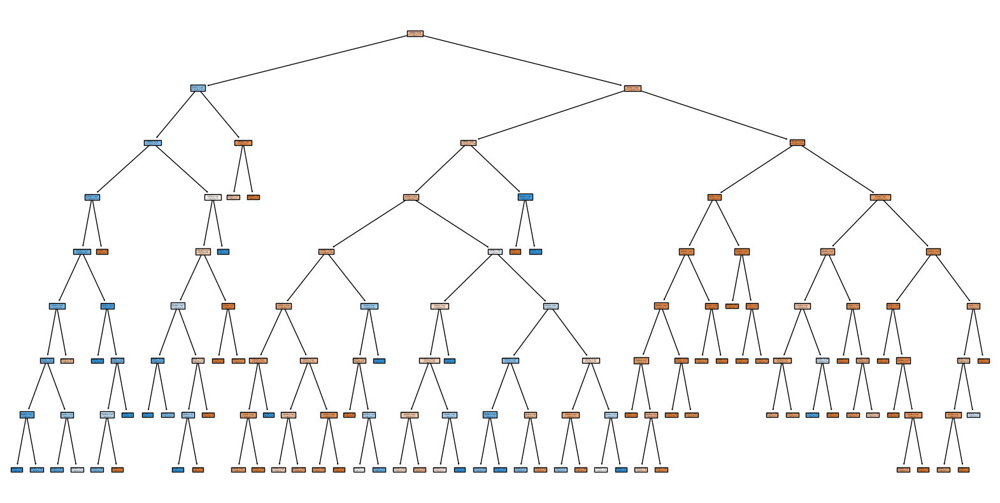

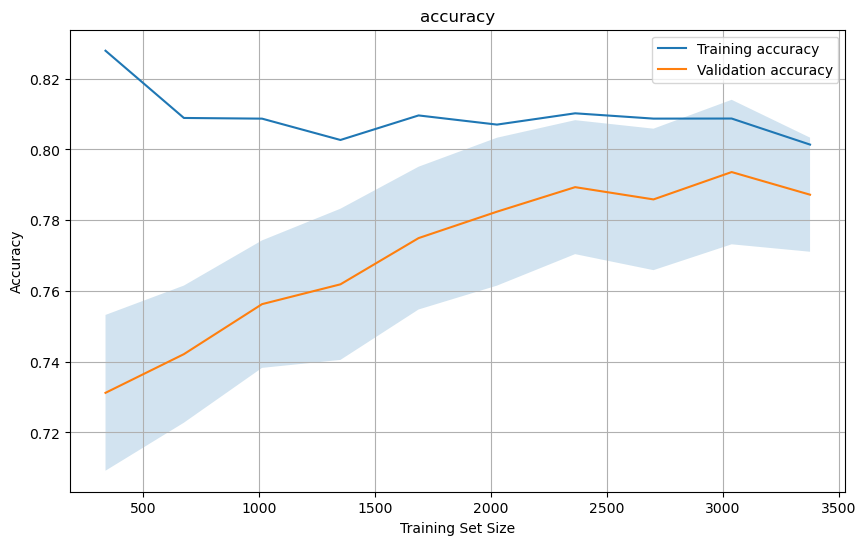

tree depth: 9


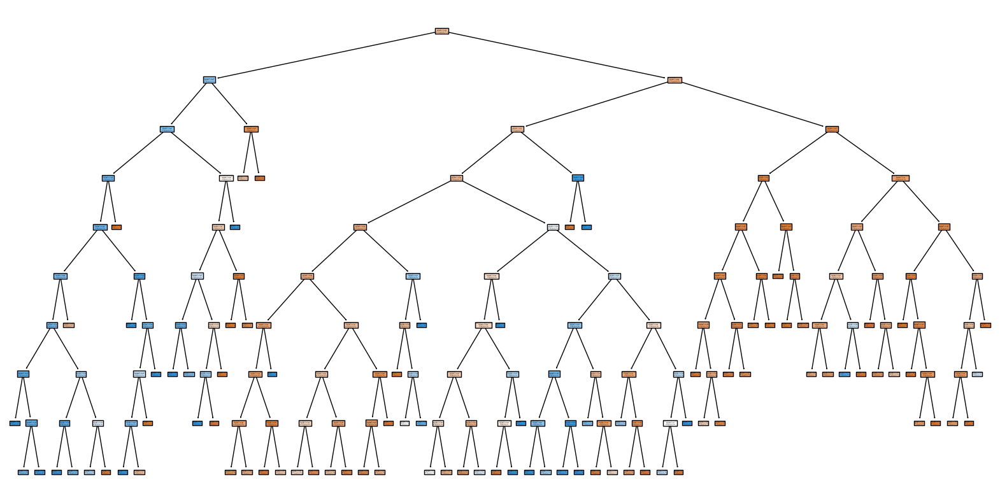

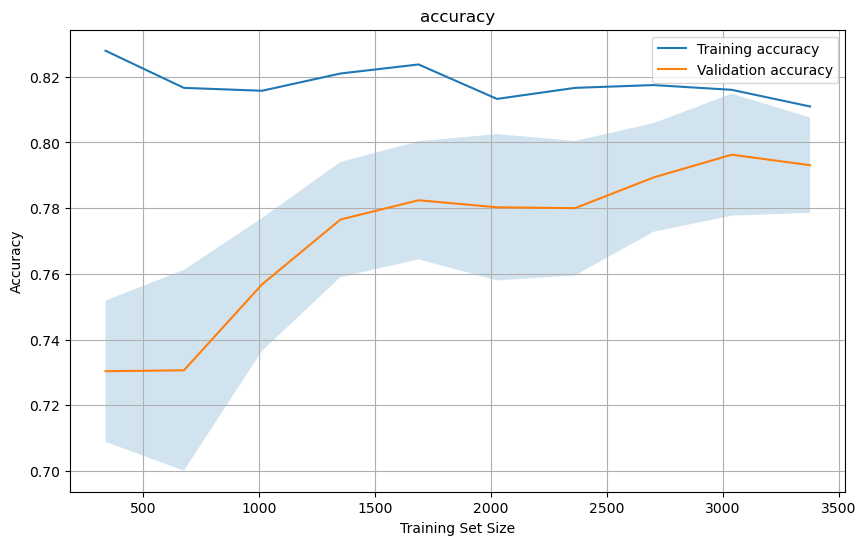

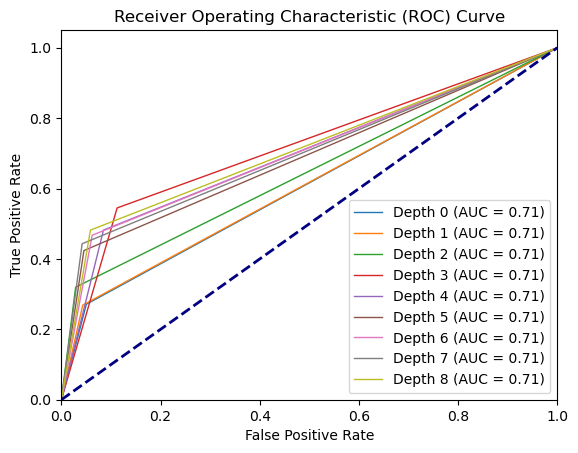

Average Accuracy: 0.7715733333333333
Elapsed time: 8.044457912445068 seconds


In [667]:
start_time=time.time()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.model_selection import learning_curve
from sklearn.metrics import confusion_matrix



target = "COVI19_PCR"
# Define features as all columns except the target variable
features = covid_resampled.drop(columns=[target]).columns.tolist()
#features

X_train, X_test, y_train, y_test = train_test_split(covid_resampled[features], covid_resampled[target], test_size = 0.25)
plt.figure(figsize=(8, 6))

fpr_list=[]
tpr_list=[]

for i in range(1,10):
    # Create a decision tree classifier
    clf = DecisionTreeClassifier(criterion="entropy", random_state=100, max_depth=i, min_samples_leaf=5)
    # Calculate learning curve
    train_sizes, train_scores, test_scores = learning_curve(
    clf, X_train, y_train, cv=10, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy', n_jobs=-1
)
    clf.fit(X_train, y_train)
    # Get the class names from the target variable
    class_names = y_train.unique().astype(str)
    # Plot the decision tree
    print("tree depth:",i)
    plt.figure(figsize=(20, 10))
    plot_tree(clf, filled=True, feature_names=X_train.columns, class_names=class_names)
    plt.show()
    # Calculate mean and standard deviation of scores
    mean_train_scores = np.mean(train_scores, axis=1)
    mean_test_scores = np.mean(test_scores, axis=1)
    std_test_scores = np.std(test_scores, axis=1)
    
    y_pred=clf.predict(X_test)
    # Plot learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, mean_train_scores, label='Training accuracy')
    plt.plot(train_sizes, mean_test_scores, label='Validation accuracy')
    plt.fill_between(train_sizes, mean_test_scores - std_test_scores, mean_test_scores + std_test_scores, alpha=0.2)
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.title('accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()
   
    #plot roc curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    fpr_list.append(fpr) 
    tpr_list.append(tpr)
        
    # Plot ROC curve
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'Depth {i} (AUC = {roc_auc:.2f})')
    
    #plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    



from sklearn.tree import DecisionTreeClassifier, plot_tree
print("Average Accuracy:", np.mean(mean_test_scores))


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")



Now reducing the new resampled dataset to a dataset that has high correlation with the target variable and working with it

In [668]:
covid_resampled.columns

Index(['Season', 'Gender', 'RinitisSinusitis', 'RespiratoryAllegies',
       'Hypertension', 'Diabetes', 'Cold', 'Cough', 'BreatheDiff',
       'SymptomDays', 'Smoker', 'COVI19_PCR', 'Age_group', 'Ageusia',
       'Odynophagia', 'Asthma', 'Hypothyroidism', 'SoreThroat', 'ChestPain',
       'Fever', 'Anosmia', 'under_cond'],
      dtype='object')

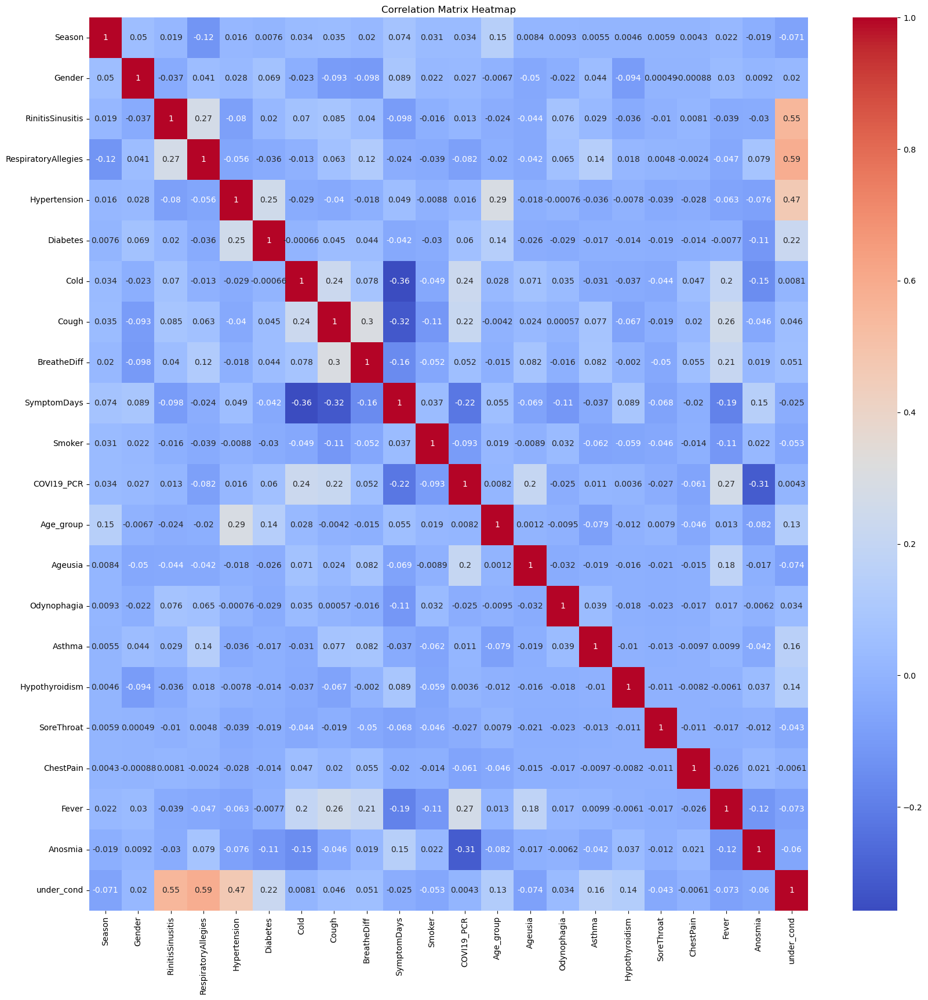

In [669]:
correlation_matrix = np.corrcoef(covid_resampled, rowvar=False)

plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm',xticklabels=covid_resampled.columns,
            yticklabels=covid_resampled.columns)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [670]:
cov_newresam = covid_resampled[['Season','Gender', 'RinitisSinusitis', 'RespiratoryAllegies', 'Hypertension', 'Diabetes', 'Cold', 'Cough', 'BreatheDiff', 'SymptomDays', 'Smoker', 'COVI19_PCR', 'Age_group', 'Ageusia', 'ChestPain', 'Fever', 'Anosmia']]

In [671]:
cov_newresam.columns

Index(['Season', 'Gender', 'RinitisSinusitis', 'RespiratoryAllegies',
       'Hypertension', 'Diabetes', 'Cold', 'Cough', 'BreatheDiff',
       'SymptomDays', 'Smoker', 'COVI19_PCR', 'Age_group', 'Ageusia',
       'ChestPain', 'Fever', 'Anosmia'],
      dtype='object')

1/1 [==============================] - 0s 12ms/step


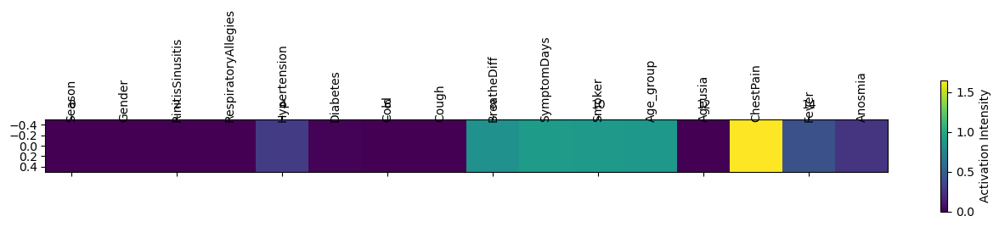

1/1 [==============================] - 0s 12ms/step


<Figure size 800x600 with 0 Axes>

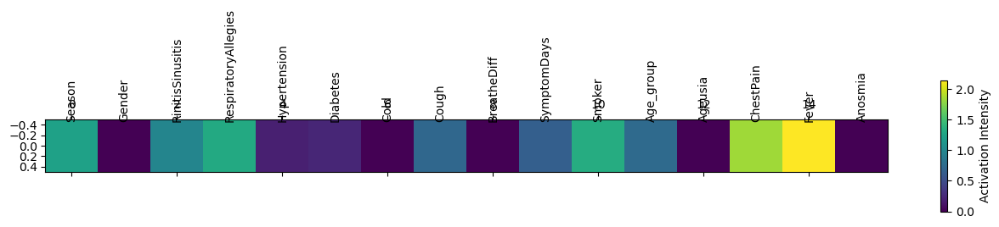

1/1 [==============================] - 0s 12ms/step


<Figure size 800x600 with 0 Axes>

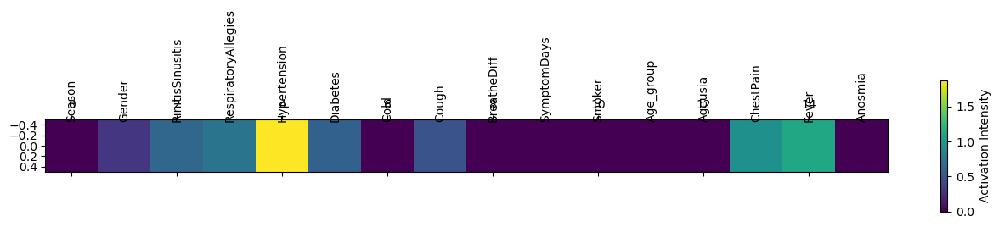

1/1 [==============================] - 0s 14ms/step


<Figure size 800x600 with 0 Axes>

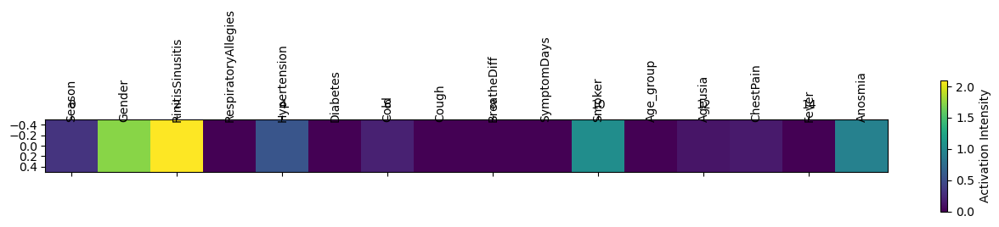

1/1 [==============================] - 0s 13ms/step


<Figure size 800x600 with 0 Axes>

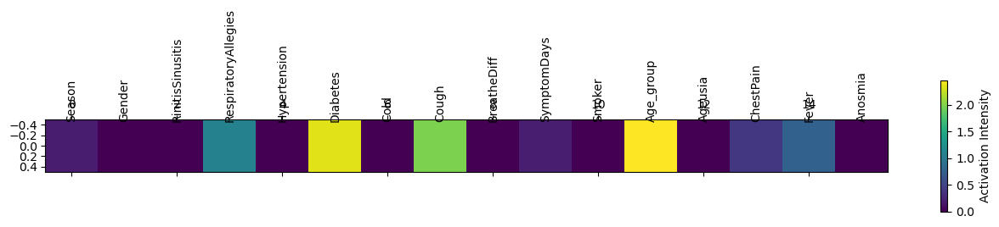

32/32 [==============================] - 0s 265us/step


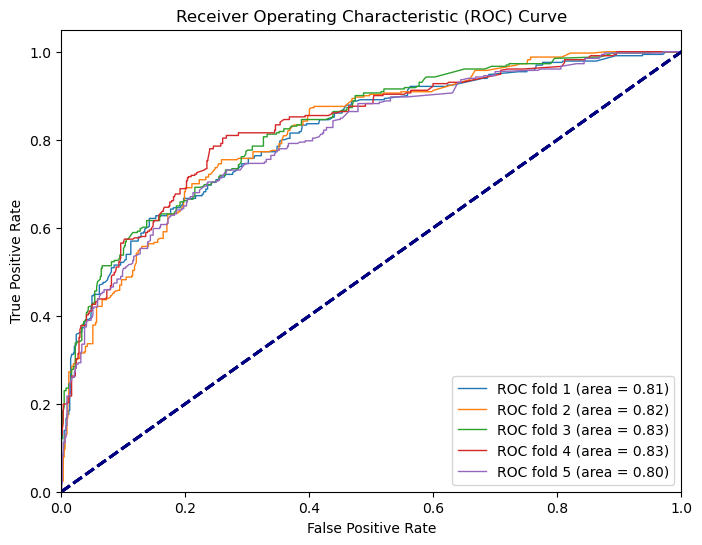

average accuracy: 0.7616000056266785


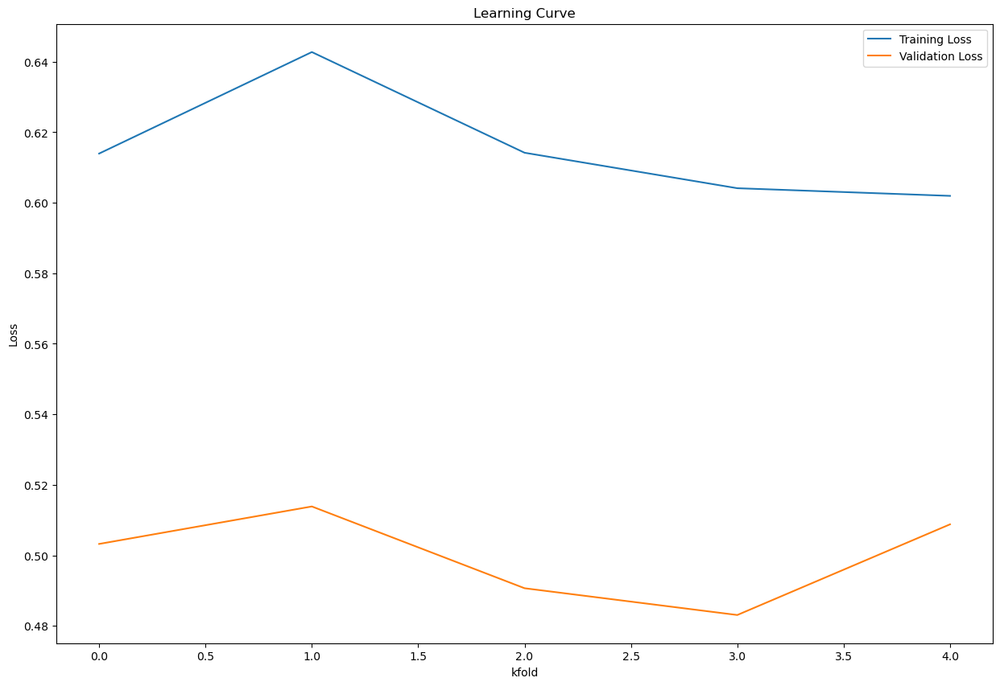

Elapsed time: 6.115891933441162 seconds


In [672]:

start_time=time.time()

from sklearn.model_selection import KFold
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

#defining features and target

roc_auc_scores = []
tpr_list = [] 
fpr_list = [] 


target = "COVI19_PCR"
# Define features as all columns except the target variable
features = cov_newresam.drop(columns=[target]).columns.tolist()
#features
X = cov_newresam[features]
y = cov_newresam[target]
# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
for train_idx, val_idx in kfold.split(X,y):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(16, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(9, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history=model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    train_losses.append(history.history['loss'][0])
    
    accuracy = model.evaluate(X_val, y_val)[1]
    
    val_losses.append(model.evaluate(X_val, y_val)[0])
    accuracies.append(accuracy)
    
    
    layer_to_visualize = model.layers[0]
    
    # Create a model to output the activations of the chosen layer
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_to_visualize.output)
    
    # Get activations for a sample data point (X_val[0] or any other sample)
    sample_activations = activation_model.predict(np.expand_dims(X_val.iloc[0], axis=0))
    # Assuming sample_activations is of shape (width,)
    sample_activations_reshaped = sample_activations.reshape(1, -1)  # Reshape to (1, width)
    plt.matshow(sample_activations_reshaped, cmap='viridis')
    plt.colorbar(label='Activation Intensity')

    feature_names = features
    for i in range(len(feature_names)):
        plt.annotate(feature_names[i], (i, -0.5), rotation='vertical', ha='center')
    plt.show()
    
    
    
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    y_pred_prob = model.predict(X_val)
    
    # Compute ROC curve and AUC for the current fold
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    tpr_list.append(tpr)
    fpr_list.append(fpr)
    # Plot the average ROC curve
    plt.figure(figsize=(8, 6))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'ROC fold {i + 1} (area = {roc_auc_scores[i]:.2f})')
    
    
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    
    
    
    


average_accuracy = np.mean(accuracies)
#print(f'Average Cross-Validation Accuracy: {average_accuracy:.2f}')train_losses.append(history.history['loss'][0]) 
average_roc_auc = sum(roc_auc_scores) / len(roc_auc_scores)
print("average accuracy:", average_accuracy)
plt.figure(figsize=(15, 10))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Learning Curve')
plt.xlabel('kfold')
plt.ylabel('Loss')
plt.legend()
plt.show()


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")


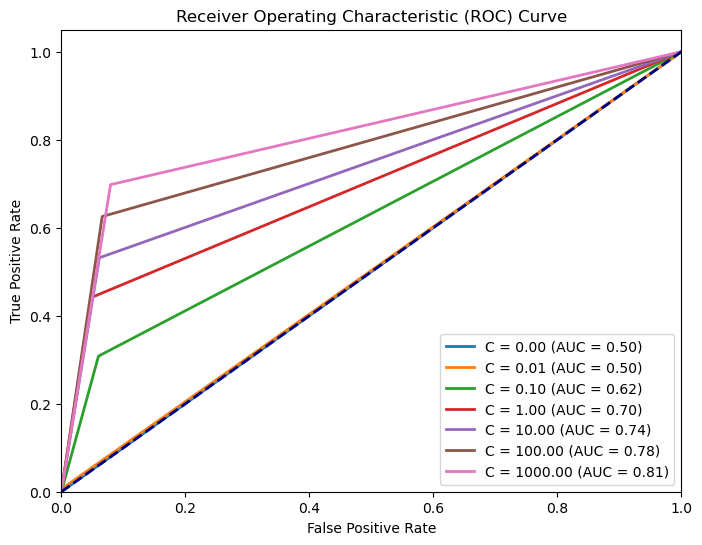

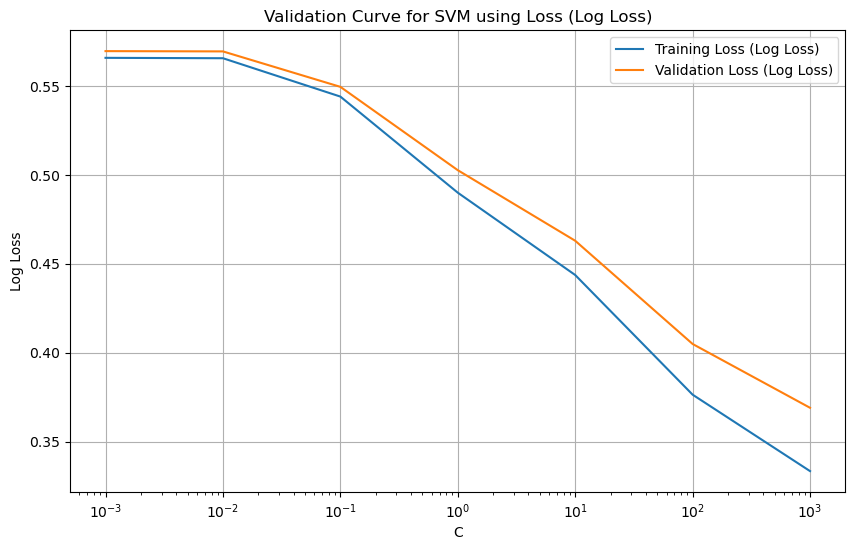

Average Accuracy: 0.7582571428571429
Elapsed time: 341.754399061203 seconds
          C  Mean Accuracy
0     0.001       0.669400
1     0.010       0.669900
2     0.100       0.686200
3     1.000       0.707250
4    10.000       0.725120
5   100.000       0.741733
6  1000.000       0.758257


In [675]:
#SVM using entire resampled dataset
start_time=time.time()

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score

target = "COVI19_PCR"
# Define features as all columns except the target variable
features = cov_newresam.drop(columns=[target]).columns.tolist()
#features



X = cov_newresam[features]
y = cov_newresam[target]



param_range = np.logspace(-3, 3, 7)  # Range of C values to explore
plt.figure(figsize=(8, 6))
# Initialize lists to store training and validation losses
train_losses = []
validation_losses = []
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
accuracies = []
train_losses=[]
val_losses=[]
#X = cov_new[X]
#y = cov_new[y]
fold_accuracies = []   
fpr_list=[]
tpr_list=[]
result3=[]
for C_value in param_range:
    # Initialize lists to store losses for each fold
    fold_train_losses = []
    fold_validation_losses = []
    
    
    for train_idx, val_idx in kfold.split(X,y):
        X_train, X_val =X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        # Train an SVM with the current C value
        svm = SVC(kernel='poly', C=C_value, random_state=0,probability=True)
        svm.fit(X_train, y_train)
        y_pred = svm.predict(X_val)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        
        fpr, tpr, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(fpr, tpr)
        fpr_list.append(fpr)
        tpr_list.append(tpr)
        
        # Plot ROC curve
        
       
        
        # Calculate training and validation losses (log loss in this case)
        train_loss = log_loss(y_train, svm.predict_proba(X_train))
        validation_loss = log_loss(y_val, svm.predict_proba(X_val))
        
        
        # Append the losses for this fold
        fold_train_losses.append(train_loss)
        fold_validation_losses.append(validation_loss)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        mean_accuracy=np.mean(fold_accuracies)
        
        
    result3.append({'C': C_value,'Mean Accuracy': mean_accuracy})
      
        
        
    # Calculate the mean loss across folds for this C value
    mean_train_loss = np.mean(fold_train_losses)
    mean_validation_loss = np.mean(fold_validation_losses)
    
    # Append the mean losses to the respective lists
    train_losses.append(mean_train_loss)
    validation_losses.append(mean_validation_loss)
    
    plt.plot(fpr, tpr, lw=2, label=f'C = {C_value:.2f} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()    

    
plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_losses, label='Training Loss (Log Loss)')
plt.semilogx(param_range, validation_losses, label='Validation Loss (Log Loss)')
plt.xlabel('C')
plt.ylabel('Log Loss')
plt.title('Validation Curve for SVM using Loss (Log Loss)')
plt.legend()
plt.grid(True)
plt.show()


average_accuracy = np.mean(fold_accuracies)
print("Average Accuracy:", average_accuracy)


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")
result3_df = pd.DataFrame(result3)
print(result3_df)

tree depth: 1


<Figure size 800x600 with 0 Axes>

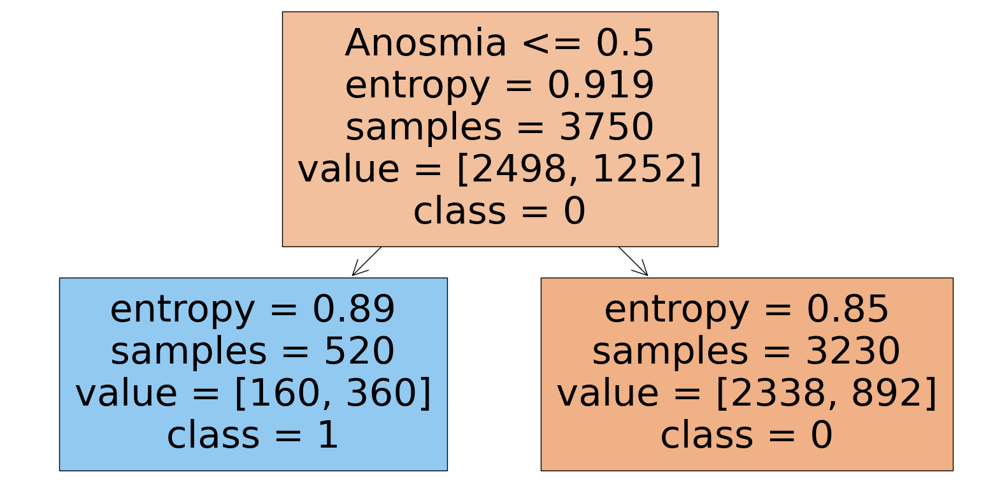

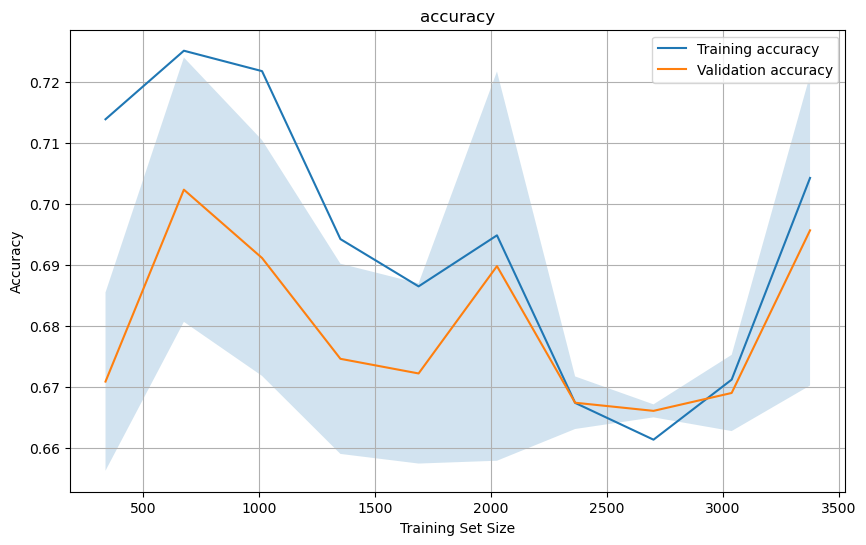

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 2


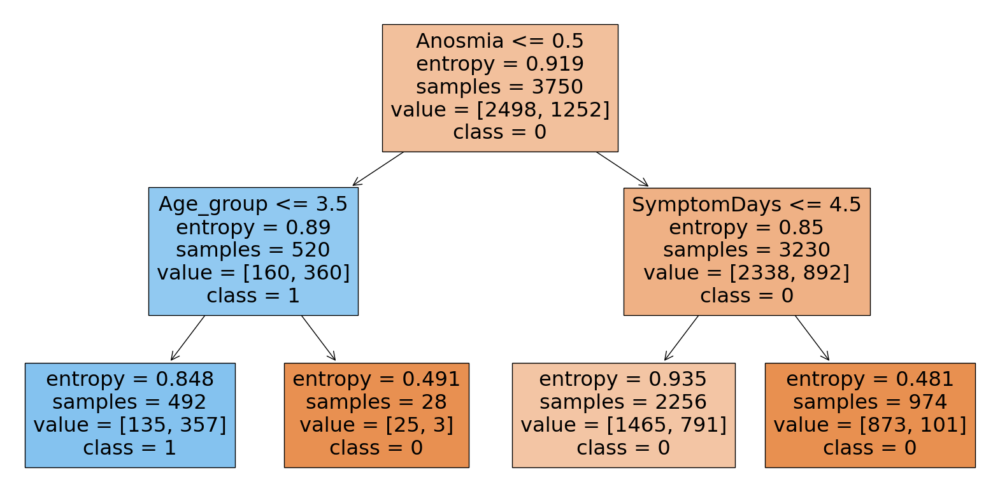

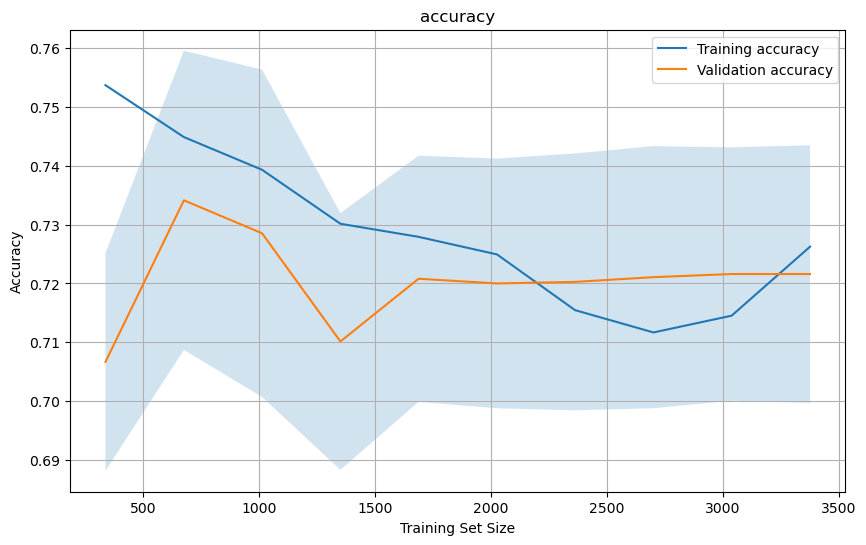

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 3


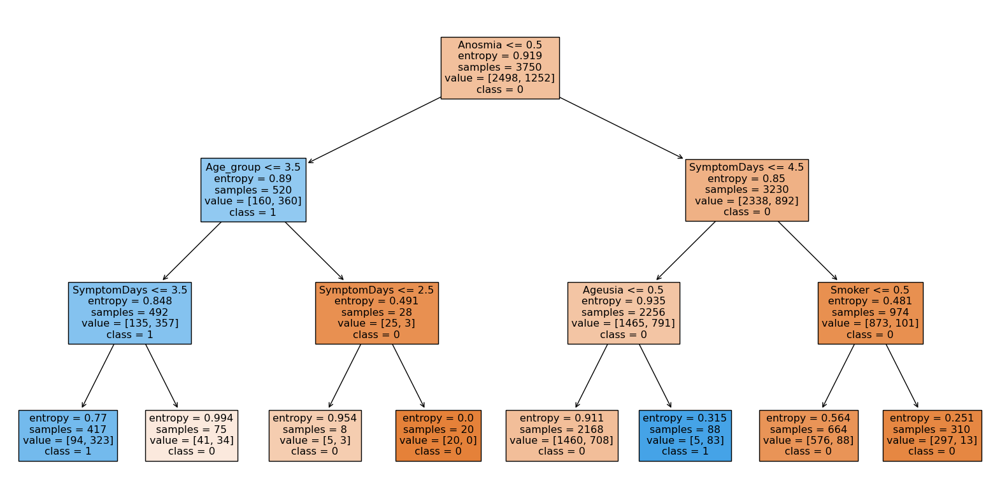

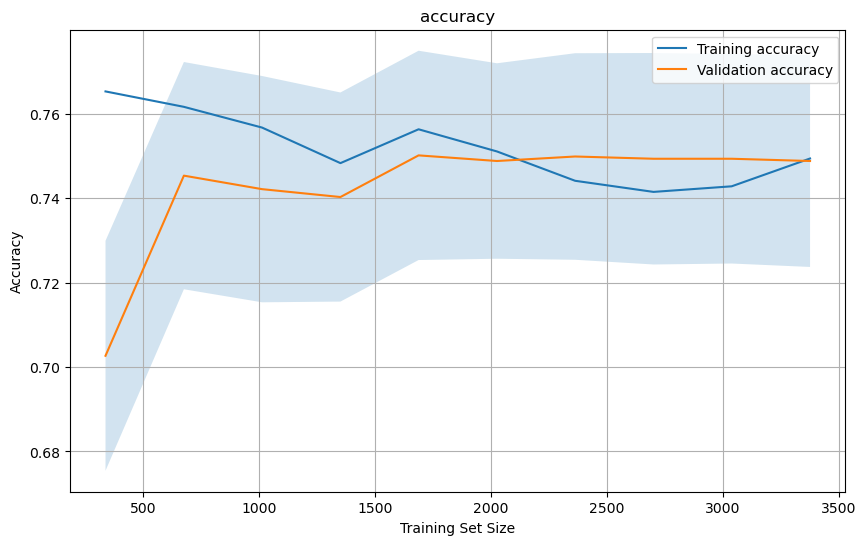

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 4


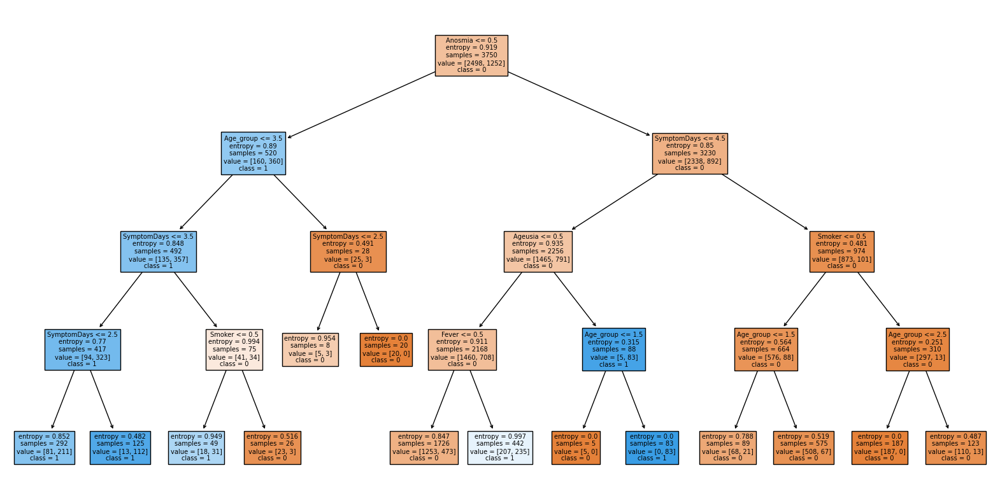

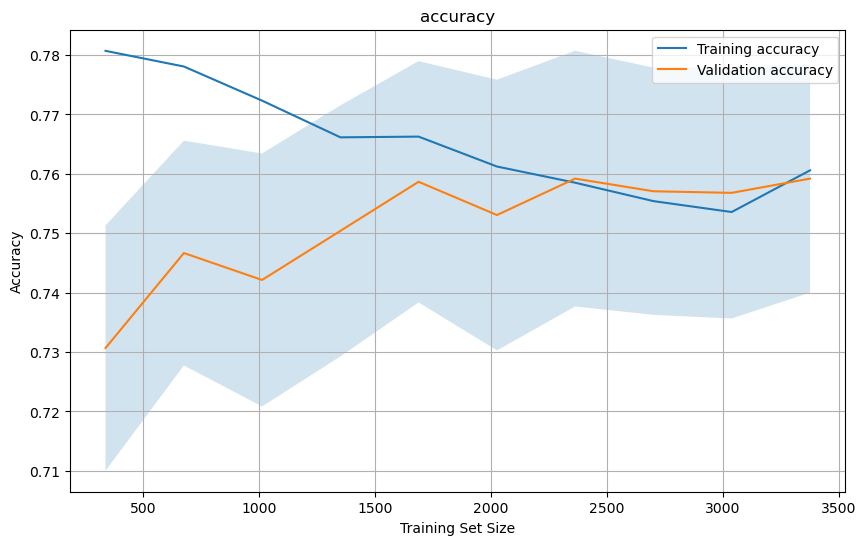

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 5


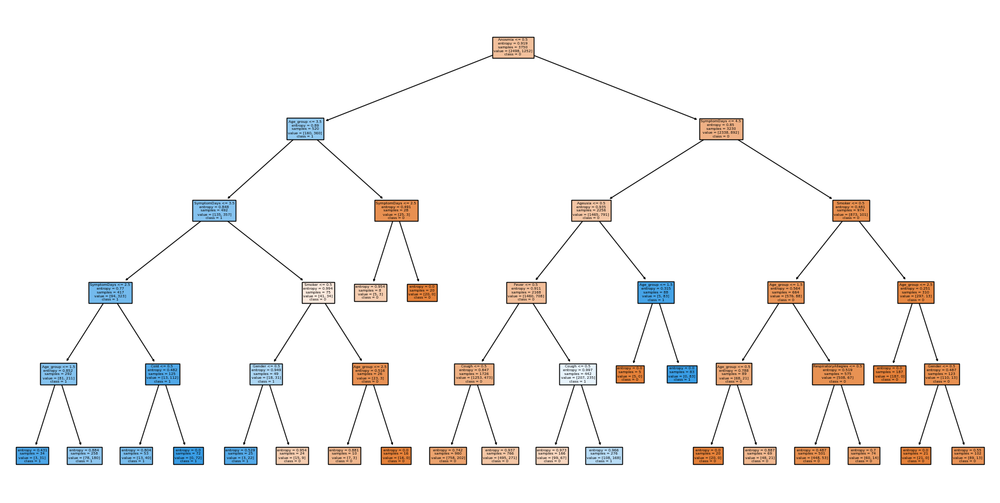

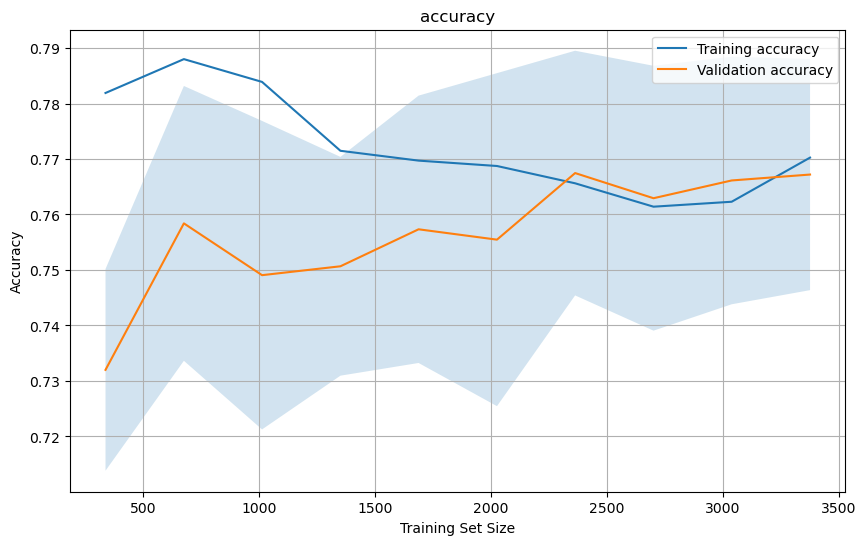

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 6


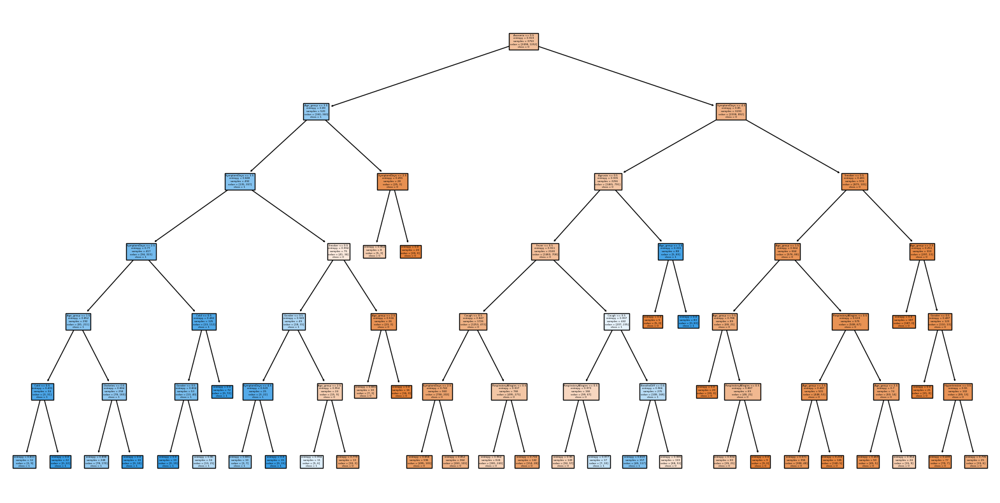

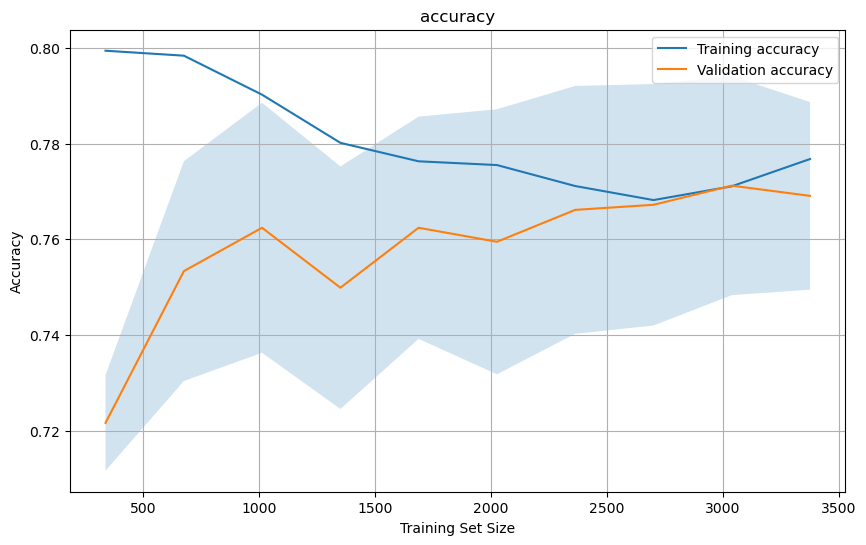

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 7


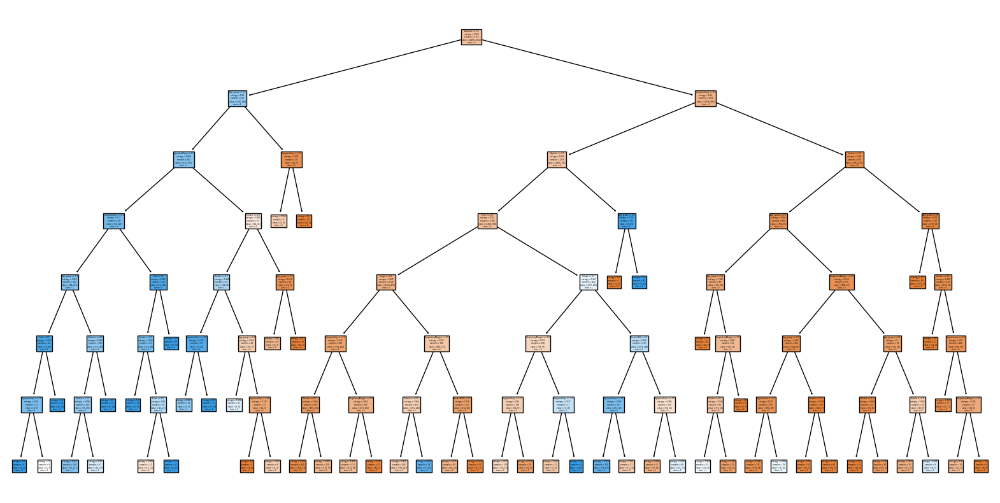

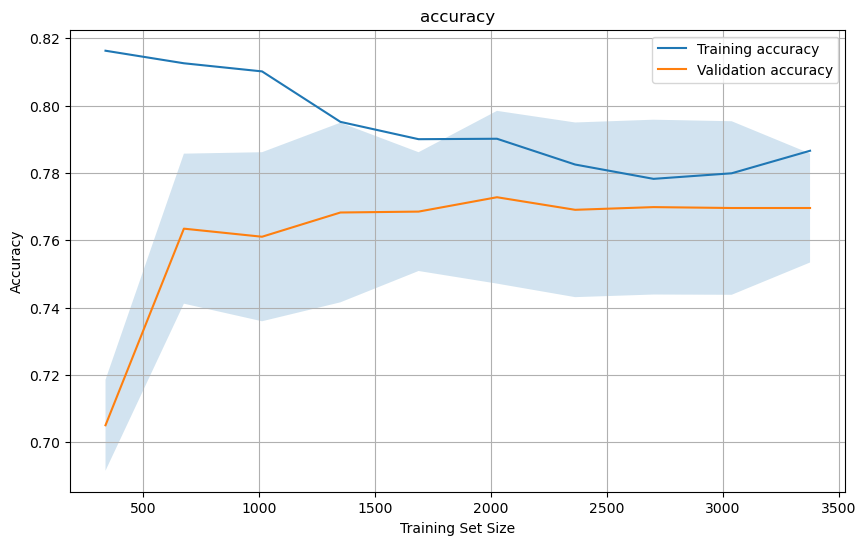

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 8


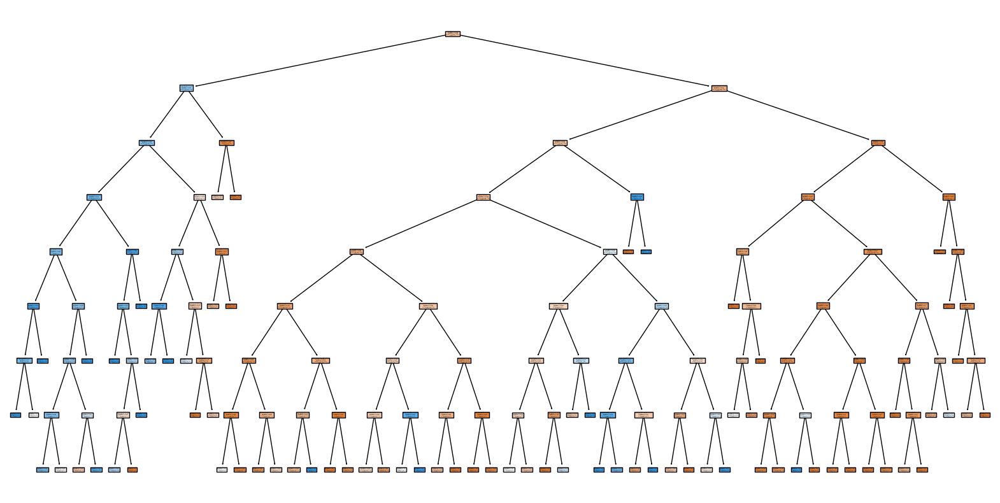

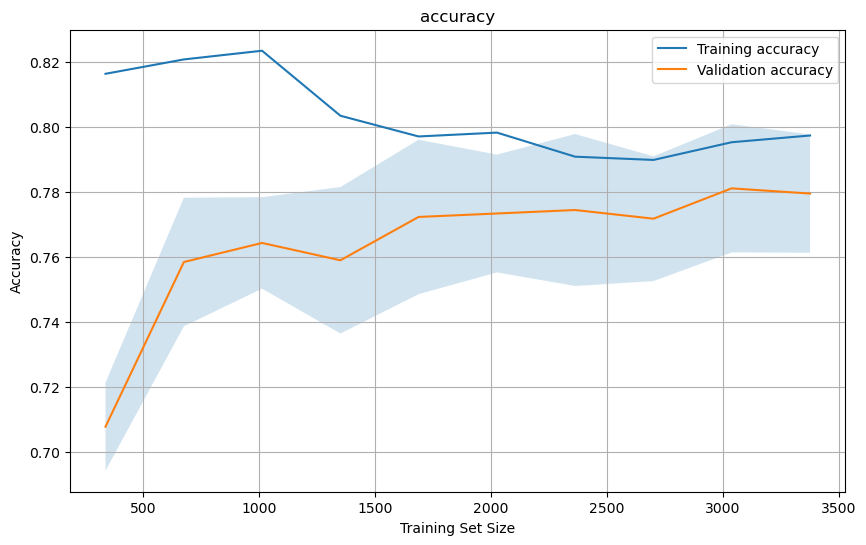

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


tree depth: 9


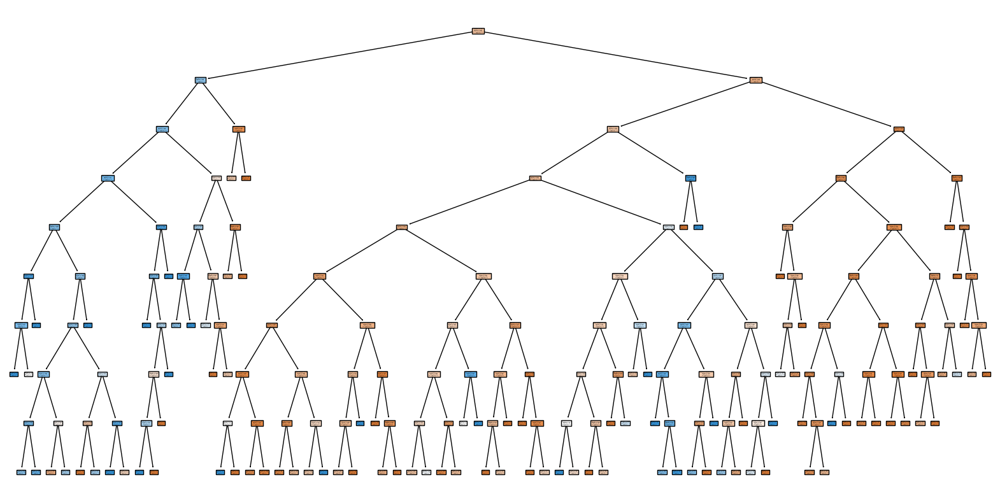

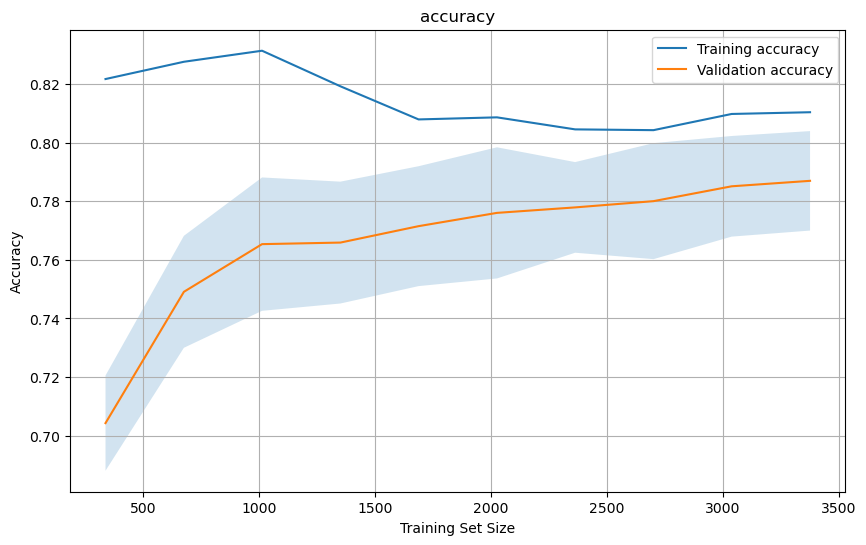

/var/folders/5y/466mqc5d1c9722h6thyb41hr0000gn/T/ipykernel_8680/4184545057.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)


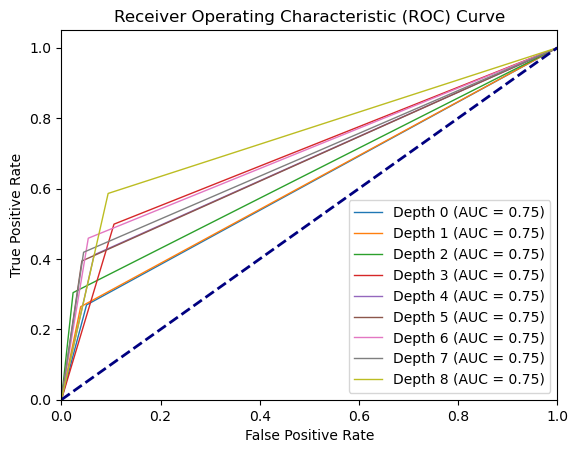

Average Accuracy: 0.7661866666666667
Elapsed time: 8.842919826507568 seconds
   Tree Depth  Training Accuracy  Validation Accuracy
0         1.0           0.704326             0.695733
1         2.0           0.726252             0.721600
2         3.0           0.749393             0.748800
3         4.0           0.760593             0.759200
4         5.0           0.770252             0.767200
5         6.0           0.776770             0.769067
6         7.0           0.786607             0.769600
7         8.0           0.797333             0.779467
8         9.0           0.810341             0.786933


In [676]:
start_time=time.time()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.model_selection import learning_curve
from sklearn.metrics import confusion_matrix


accuracy_table = pd.DataFrame(columns=['Tree Depth', 'Training Accuracy', 'Validation Accuracy'])
target = "COVI19_PCR"
# Define features as all columns except the target variable
features = cov_newresam.drop(columns=[target]).columns.tolist()
#features

X_train, X_test, y_train, y_test = train_test_split(cov_newresam[features], cov_newresam[target], test_size = 0.25)
plt.figure(figsize=(8, 6))

fpr_list=[]
tpr_list=[]

for i in range(1,10):
    # Create a decision tree classifier
    clf = DecisionTreeClassifier(criterion="entropy", random_state=100, max_depth=i, min_samples_leaf=5)
    # Calculate learning curve
    train_sizes, train_scores, test_scores = learning_curve(
    clf, X_train, y_train, cv=10, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy', n_jobs=-1
)
    clf.fit(X_train, y_train)
    # Get the class names from the target variable
    class_names = y_train.unique().astype(str)
    # Plot the decision tree
    print("tree depth:",i)
    plt.figure(figsize=(20, 10))
    plot_tree(clf, filled=True, feature_names=X_train.columns, class_names=class_names)
    plt.show()
    # Calculate mean and standard deviation of scores
    mean_train_scores = np.mean(train_scores, axis=1)
    mean_test_scores = np.mean(test_scores, axis=1)
    std_test_scores = np.std(test_scores, axis=1)
    
    y_pred=clf.predict(X_test)
    # Plot learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, mean_train_scores, label='Training accuracy')
    plt.plot(train_sizes, mean_test_scores, label='Validation accuracy')
    plt.fill_between(train_sizes, mean_test_scores - std_test_scores, mean_test_scores + std_test_scores, alpha=0.2)
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.title('accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()
   
    #plot roc curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    fpr_list.append(fpr) 
    tpr_list.append(tpr)
    
    accuracy_table = accuracy_table.append({'Tree Depth': i, 'Training Accuracy': mean_train_scores[-1], 'Validation Accuracy': mean_test_scores[-1]}, ignore_index=True)
        
    # Plot ROC curve
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'Depth {i} (AUC = {roc_auc:.2f})')
    
    #plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
    
    
    
    
    



from sklearn.tree import DecisionTreeClassifier, plot_tree
print("Average Accuracy:", np.mean(mean_test_scores))


end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")
print(accuracy_table)

<Figure size 1200x800 with 0 Axes>

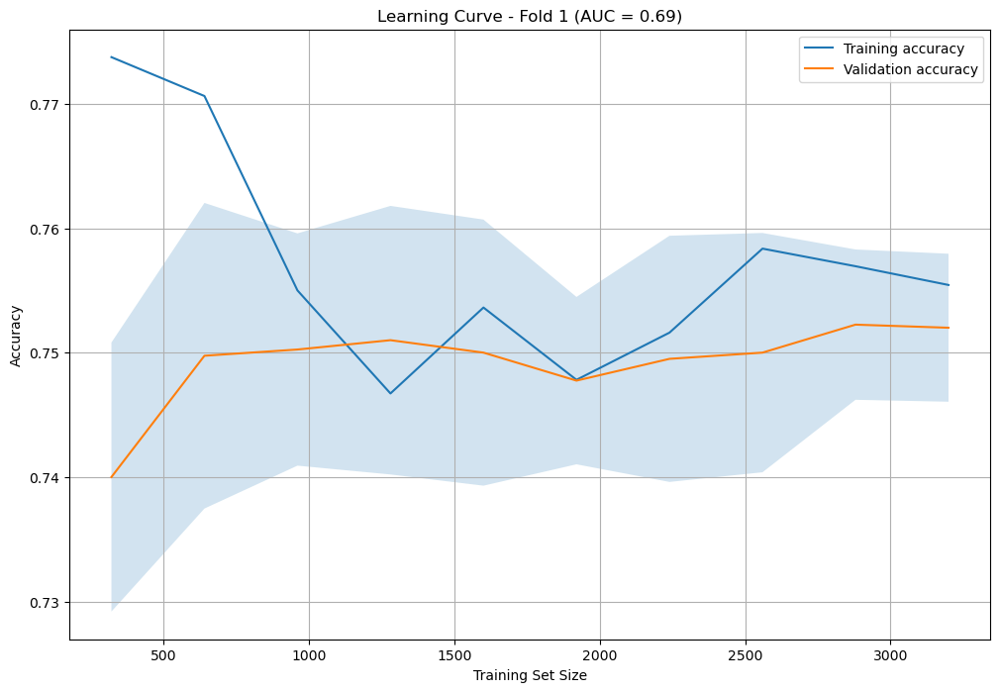

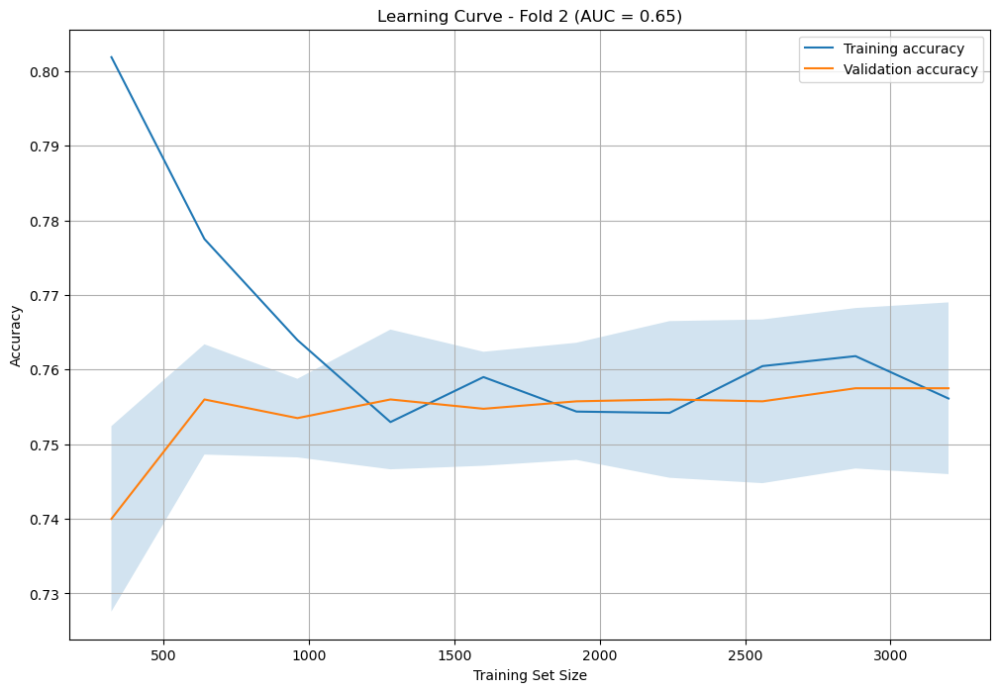

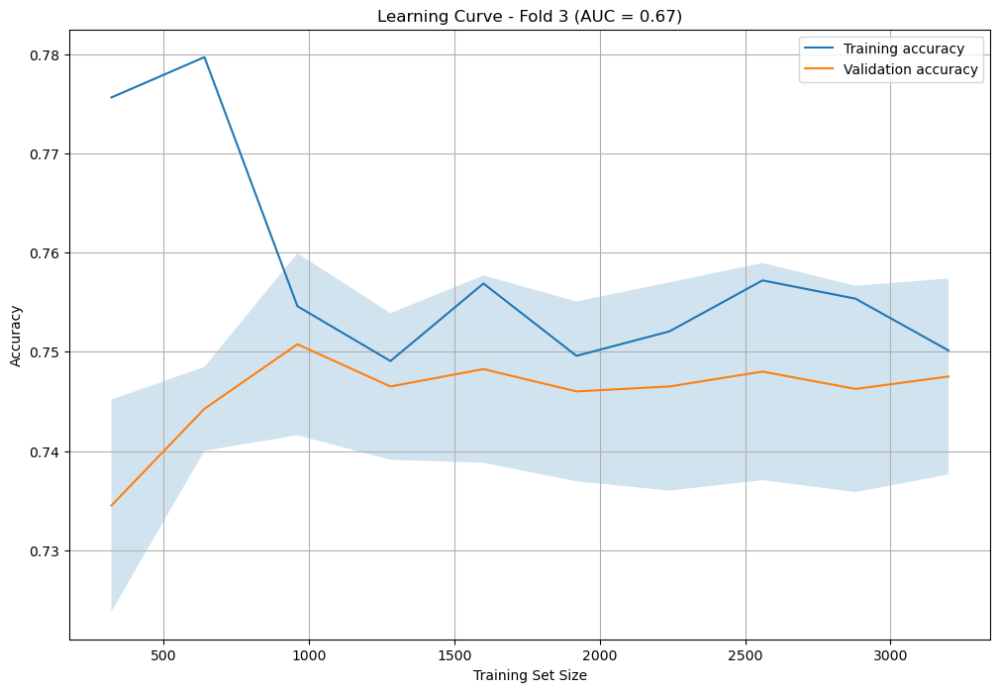

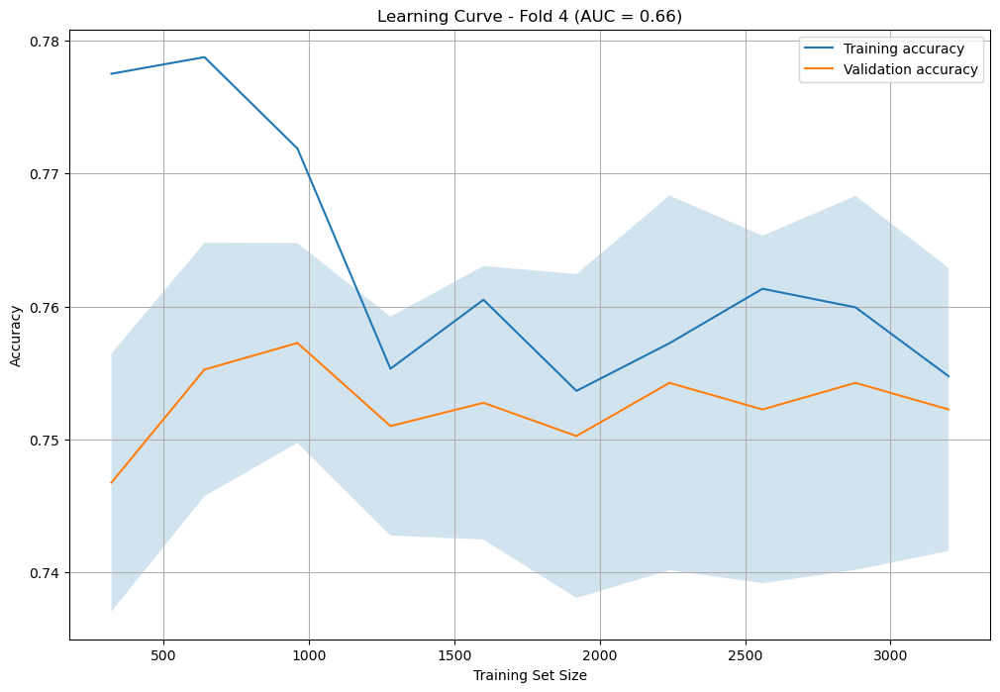

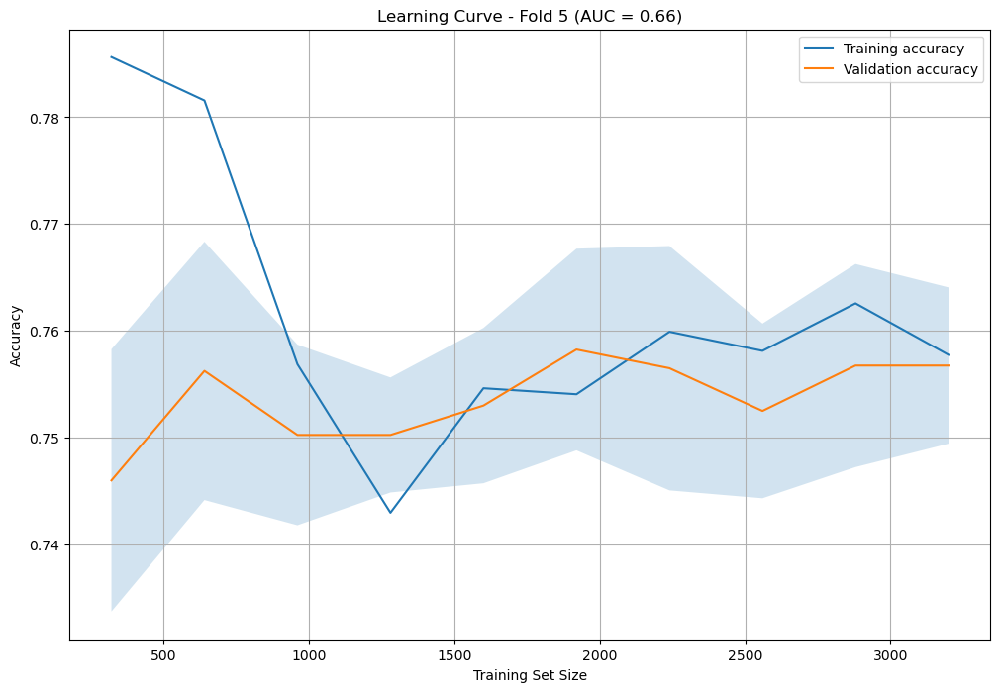

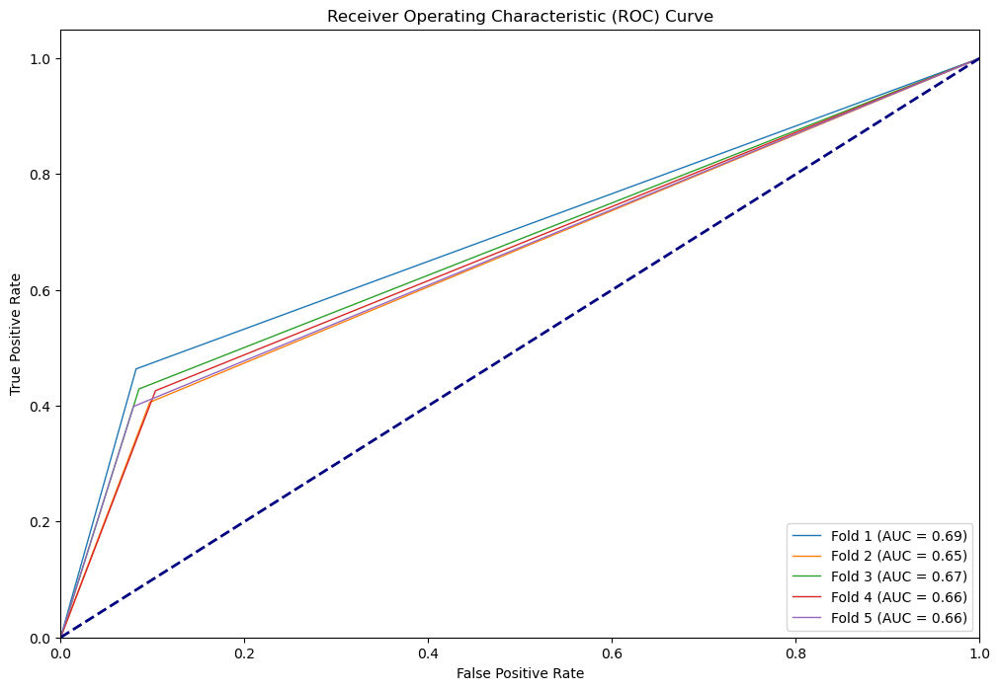

average accuracy 0.75
Elapsed time: 1.5000901222229004 seconds


In [677]:
start_time=time.time()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold  # Import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.model_selection import learning_curve

# Assuming you have already defined 'cov_new', 'features', and 'target' earlier in your code.
acc=[]
X = cov_newresam[features]
y = cov_newresam[target]

plt.figure(figsize=(12, 8))

fpr_list = []
tpr_list = []

# Create StratifiedKFold for cross-validation
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=100)

for train_idx, test_idx in kf.split(X, y):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Create a logistic regression classifier
    clf = LogisticRegression(random_state=100, max_iter=1000)  # You can adjust parameters as needed
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    acc1=accuracy_score(y_test,y_pred)
    acc.append(acc1)

    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    fpr_list.append(fpr)
    tpr_list.append(tpr)

    # Plot learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        clf, X_train, y_train, cv=5, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy', n_jobs=-1
    )

    mean_train_scores = np.mean(train_scores, axis=1)
    mean_test_scores = np.mean(test_scores, axis=1)
    std_test_scores = np.std(test_scores, axis=1)

    plt.figure(figsize=(12, 8))
    plt.plot(train_sizes, mean_train_scores, label='Training accuracy')
    plt.plot(train_sizes, mean_test_scores, label='Validation accuracy')
    plt.fill_between(train_sizes, mean_test_scores - std_test_scores, mean_test_scores + std_test_scores, alpha=0.2)
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.title(f'Learning Curve - Fold {len(fpr_list)} (AUC = {roc_auc:.2f})')
    plt.legend()
    plt.grid(True)

# Plot ROC curves for all folds
plt.figure(figsize=(12, 8))
for i in range(len(fpr_list)):
    plt.plot(fpr_list[i], tpr_list[i], lw=1, label=f'Fold {i + 1} (AUC = {auc(fpr_list[i], tpr_list[i]):.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
acc2=np.mean(acc)
print("average accuracy",acc2)

end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")
